# ⛅ **Probabilistic forecasting I: Temperature**

#### ❗ **Introducción**
---
En esta tarea se trabaja con un conjunto de datos de series temporales proporcionado en el contexto de una competición de predicción de temperatura. El objetivo principal es predecir el valor futuro de la variable Temperature utilizando una serie temporal con características anonimizadas.

El conjunto de datos se divide en dos partes:

- train.csv: contiene 64,320 filas con datos desde el 1 de julio de 2016 hasta el 1 de mayo de 2018. Incluye una columna de marca temporal (timestamp), seis variables anonimizadas (feature_1 a feature_6), y la variable objetivo Temperature.

- test.csv: contiene 5,360 filas con datos desde el 2 de mayo de 2018 hasta el 26 de junio de 2018. No se incluye la temperatura en este archivo, ya que se debe predecir.

- sample_submission.csv: archivo de ejemplo con el formato esperado de entrega. Contiene una columna id y 21 columnas adicionales que representan los distintos cuantiles de predicción solicitados: desde el percentil 2.5 (0.025) hasta el 97.5 (0.975).

La predicción debe generarse como una **estimación probabilística**, lo cual implica que en vez de predecir un solo valor para la temperatura, se deben entregar 21 estimaciones correspondientes a distintos niveles de confianza (cuantiles). Este enfoque es útil para capturar la incertidumbre del modelo.




#### 📝 **Experimentos**
---
1. EDA: se aplica un análisis exploratorio de los datos
  * Visualización
  * Análisis Estadístico de Temperatura
  * Estacionariedad y Tendencia.

2. ARIMA univariable
  * Técnica de evaluación de incertidumbre: Bootstrapping de Residuos
  * `CRPS: 2.43`

3. VAR
  * Técnica de evaluación de incertidumbre: Bootstrapping de Residuos
  * CRPS: 8

4. Feature Engineering + LightGBM. *Feature Engineering* incluye:
  * Test de Granger
  * Seasonal-Trend Descomposition (STL)
  * Anomalies Analysis
  * Mutual Information
  * `CRPS: 3.14`

5. Recurrent Neural Networks (RNN)

6. Feature Engineering + CatBoost
  * Técnica de evaluación de incertidumbre: Conformal Prediction
  * `CRPS: 0.80`


## 📊 **Exploratory Data Analysis - EDA**
---
El primer paso consiste en realizar un Análisis Exploratorio de los Datos, repasando conceptos relacionados con las series temporales.

**Conceptos**:

- Stationary Time Serie: estadísticas constantes
- Non-Stationary Time Serie (Time-Dependent Mean): la media varía en el tiempo
- Non-Stationary Time Serie (Time-Dependent Variance): la varianza varía en el tiempo
- Classical Descomposition: cualquier variable se puede representar como:

$$
Z_t = T_t + S_t + I_t
$$

donde:

- \( Z_t \): valor observado en el tiempo \( t \)  
- \( T_t \): componente de tendencia (**trend**): Representa la evolución a largo plazo de la serie temporal. Puede reflejar un crecimiento, una disminución o una estabilidad sostenida a lo largo del tiempo. Ejemplo: el aumento gradual de la temperatura global a lo largo de los años.
- \( S_t \): componente estacional (**seasonality**): Captura patrones repetitivos en intervalos regulares (como días, meses o años). Estos patrones suelen estar influenciados por factores cíclicos. Ejemplo: el aumento de ventas en diciembre por Navidad o las variaciones diarias de temperatura.
- \( I_t \): componente irregular o residual (**irregular**): Representa las fluctuaciones aleatorias no explicadas por la tendencia ni por la estacionalidad. Es el "ruido" impredecible, como un evento climático extremo o una avería inesperada.



**Tipos de predicción**:
Existen dos formas de predecir el valor futuro de una serie temporal usando valores pasados:

1. Predecir directamente la parte predecible Zt*: se busca la función minimizando al máximo el ruido (el ruido no es predecible).
Aquí se busca una función:

    $$
    Z_t^* = f(Z_{t-1}, Z_{t-2}, \dots)
    $$

    Luego, como:

    $$
    Z_t = Z_t^* + a_t
    $$

    donde \( a_t \) es ruido (no se puede predecir, pero se espera que sea pequeño).

    > Este enfoque se centra en **modelar la estructura del dato** (tendencia, estacionalidad, patrones repetitivos). Esto es lo que hacen modelos como **ARIMA**, **Prophet** o **LSTM**

2. Modelar el valor completo Zt:
Aquí se define una función:

    $$
    Z_t = f(Z_{t-1}, Z_{t-2}, \dots) + a_t
    $$

    La idea es predecir \( Z_t \) lo mejor posible, y lo que quede sin explicar (el error, \( a_t \)) se considera ruido.

    > Este enfoque es casi igual que el anterior, pero en vez de separar explícitamente \( Z_t^* \), lo incluyes directamente en la función de predicción.

In [67]:
def crps(submission, solution):
    """
    This routine returns the mean continuous ranked probability score (CRPS).
    Each individual CRPS score is numerically integrated using 23 points.
    The extremal points (100% coverage) are competition fixed at -30 and 60.
    The "submission" dataframe: the last 21 columns should be the predictions
    The "solution" dataframe must contain a "Temperature" column (the "ground truth")

    Author: Carl McBride Ellis
    Version: 1.0.0
    Date: 2024-03-30
    """

    # A list of the requested quantile values, along with added 100% coverage endpoints
    # (these values are all competition fixed)
    # the 0.5 quantile is the "zero coverage" forecast i.e. the median point prediction
    quantiles = [0.00, 0.025, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95, 0.975, 1.00]
    submission_tmp = submission.copy()
    # inset the y_true values to the submission_tmp dataframe to the LHS
    submission_tmp.insert(0, "Temperature", solution["Temperature"].values)

    CRPS = 0
    for index, row in submission_tmp.iterrows():
        x_values = row[-(len(quantiles)-2):] # column name agnostic
        y_true = row["Temperature"] # the ground truth value

        x_values = [float(i) for i in x_values] # make sure all x values are floats
        # add extremal 100% quantile x-values so as to be sure to bracket all possible y_true values
        # note: any changing of these values will change the score
        x_values.append(-30.0)
        x_values.append( 60.0)
        x_values.sort() # sort x values into ascending order (no quantile crossing)

        # split predictions to the left and right of the true value
        # get items below the true value (y_true)
        LHS_keys = [i for i,x in enumerate(x_values) if x < y_true]
        # get items above the true value (y_true)
        RHS_keys = [i for i,x in enumerate(x_values) if x >= y_true]

        # quantiles and predictions below the true value (y_true)
        LHS_values = [x_values[i] for i in LHS_keys]
        LHS_quantiles = [quantiles[i] for i in LHS_keys]

        # quantiles and predictions above the true value (y_true)
        RHS_values = [x_values[i] for i in RHS_keys]
        RHS_quantiles = [quantiles[i] for i in RHS_keys]

        # also calculate quantile at y (q_at_y_true)
        x1, y1 = LHS_values[-1], LHS_quantiles[-1]
        x2, y2 = RHS_values[0], RHS_quantiles[0]
        q_at_y_true = ((y2-y1)*(y_true-x1)/(x2-x1))+y1

        # add y_true and q_at_y_true to RHS of LHS list
        LHS_values.append(y_true)
        LHS_quantiles.append(q_at_y_true)

        # add y_true and q_at_y_true to LHS of RHS list
        RHS_values.insert(0, y_true)
        RHS_quantiles.insert(0, q_at_y_true)

        # integrate the LHS as a sum of trapezium for CDF**2
        LHS_integral = 0
        for i in range(len(LHS_values)-1):
            LHS_integral += (0.5 * (LHS_values[i+1]-LHS_values[i]) * (LHS_quantiles[i]**2 + LHS_quantiles[i+1]**2) )

        # integrate the RHS as a sum of trapezium for (1-CDF)**2
        RHS_integral = 0
        for i in range(len(RHS_values)-1):
            RHS_integral += (0.5 * (RHS_values[i+1]-RHS_values[i]) * ((1-RHS_quantiles[i])**2 +(1-RHS_quantiles[i+1])**2 ) )

        CRPS += (LHS_integral + RHS_integral)

    del submission_tmp
    # calculate the mean CRPS
    CRPS = CRPS/len(submission)
    return CRPS


def coverage_report(submission, solution):
    """
    Version: 1.0.1
    """
    y_true = solution["Temperature"].values
    # this does not take the "zero coverage" prediction into account
    # which is assumed to be located in submission.csv column -11
    coverages = [95, 90, 80, 70, 60, 50, 40, 30, 20, 10]
    N = len(coverages)
    # ANSI color codes
    BOLD_RED = '\033[1;31m'
    BOLD_GREEN = '\033[1;32m'
    END_COLOR = '\033[0m'

    def mean_coverage(y_pred_low,y_true,y_pred_up):
        return ( (y_pred_low <= y_true) & (y_pred_up >= y_true) ).mean()

    for i, coverage in enumerate(coverages):
        lower_col, upper_col = (2*N+1-i), (i+1)
        actual_coverage = mean_coverage(submission.iloc[:,-lower_col], y_true, submission.iloc[:,-upper_col])
        actual_coverage = round(actual_coverage*100,2)
        if actual_coverage >= coverages[i]:
            print(BOLD_GREEN, "Ideal: {}% Actual: {}% [PASS]".format(coverage, actual_coverage), END_COLOR)
        else:
            print(BOLD_RED, "Ideal: {}% Actual: {}% [FAIL]".format(coverage, actual_coverage), END_COLOR)

In [ ]:
def read_data():
  train = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/train.csv", sep=",")
  test = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/test.csv", sep=",")
  train_public  = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/train_and_Public.csv", sep=",")

  train['date'] = pd.to_datetime(train['date'])
  test['date'] = pd.to_datetime(test['date'])

  train.head()

  return train, test

In [ ]:
import crps as us

In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt

df_train = pd.read_csv("./data/train.csv", sep=",")
df_train.info()

In [ ]:
df_train['date'] = pd.to_datetime(df_train['date'])

In [ ]:
df_train.head(5)

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001


> Missing values

In [ ]:
df_train.isna().sum()

id             0
date           0
feature_AA     0
feature_AB     0
feature_BA     0
feature_BB     0
feature_CA     0
feature_CB     0
Temperature    0
dtype: int64

Una herramienta útil para realizar un EDA inicial es el **Report** de ydata_profiling

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df_train.sample(30000))
profile.to_file('report_30000.html')


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 52.72it/s]


Del reporte, lo más destacable es que en la siguiente matrix de correlación existe una correlación perfecta entre las features [AA,BA] y [AB,BB].

![Texto alternativo](./correlation_matrix.png)

### **Visualización**

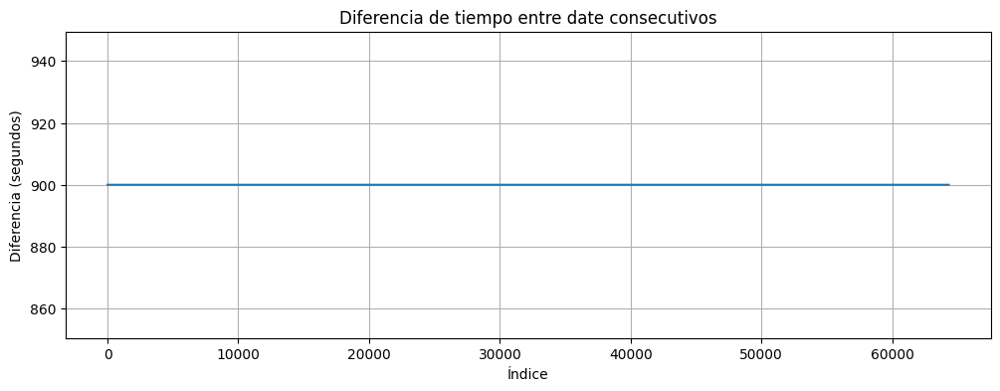

In [ ]:
df_train['date'] = pd.to_datetime(df_train['date'])
df_train = df_train.sort_values('date')

diffs = df_train['date'].diff().dt.total_seconds()

plt.figure(figsize=(12, 4))
plt.plot(diffs.values)
plt.title("Diferencia de tiempo entre date consecutivos")
plt.xlabel("Índice")
plt.ylabel("Diferencia (segundos)")
plt.grid(True)
plt.show()

> Se observa como la serie temporal se encuentra espaciada uniformemente con respecto el tiempo.

A continuación, se muestran los histogramas de las 6 variables, y se comparan aquellos histogramas de las variables con una alta correlación.

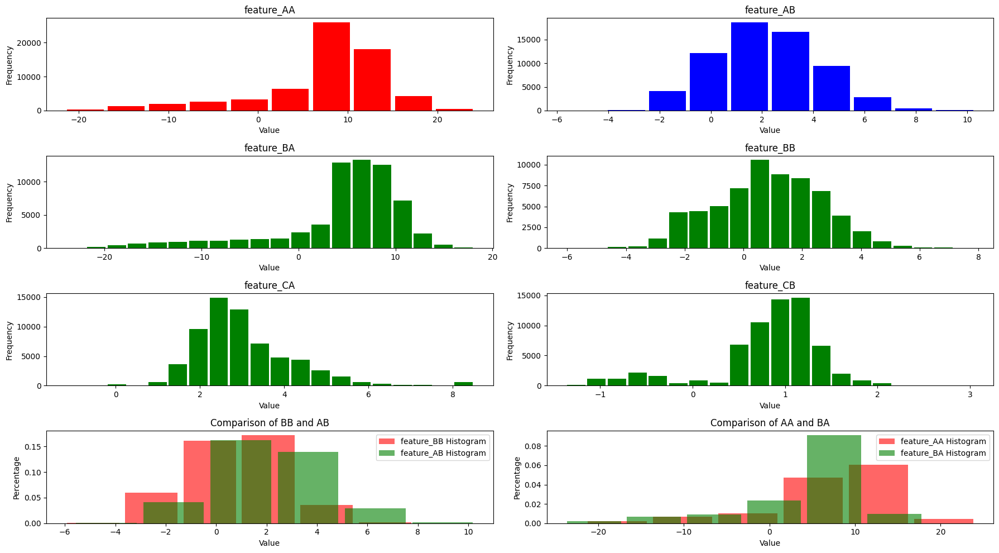

In [ ]:
fig, axs = plt.subplots(4, 2, figsize=(18, 10))

# Histograms
axs[0, 0].hist(df_train['feature_AA'], bins=10, color='red', rwidth=0.9)
axs[0, 0].set_title('feature_AA')
axs[0, 0].set_xlabel('Value')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].grid(False)

axs[0, 1].hist(df_train['feature_AB'], bins=10, color='blue', rwidth=0.9)
axs[0, 1].set_title('feature_AB')
axs[0, 1].set_xlabel('Value')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].grid(False)

axs[1, 0].hist(df_train['feature_BA'], bins=20, color='green', rwidth=0.9)
axs[1, 0].set_title('feature_BA')
axs[1, 0].set_xlabel('Value')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].grid(False)

axs[1, 1].hist(df_train['feature_BB'], bins=20, color='green', rwidth=0.9)
axs[1, 1].set_title('feature_BB')
axs[1, 1].set_xlabel('Value')
axs[1, 1].set_ylabel('Frequency')
axs[1, 1].grid(False)

axs[2, 0].hist(df_train['feature_CA'], bins=20, color='green', rwidth=0.9)
axs[2, 0].set_title('feature_CA')
axs[2, 0].set_xlabel('Value')
axs[2, 0].set_ylabel('Frequency')
axs[2, 0].grid(False)

axs[2, 1].hist(df_train['feature_CB'], bins=20, color='green', rwidth=0.9)
axs[2, 1].set_title('feature_CB')
axs[2, 1].set_xlabel('Value')
axs[2, 1].set_ylabel('Frequency')
axs[2, 1].grid(False)


axs[3, 0].hist(df_train['feature_BB'], bins=6, color='red', alpha=0.6, rwidth=0.9, density=True, label='feature_BB Histogram')
axs[3, 0].hist(df_train['feature_AB'], bins=6, color='green', alpha=0.6, rwidth=0.9, density=True, label='feature_AB Histogram')

axs[3, 0].set_title('Comparison of BB and AB')
axs[3, 0].set_xlabel('Value')
axs[3, 0].set_ylabel('Percentage')
axs[3, 0].legend(loc='best')
axs[3, 0].grid(False)


axs[3, 1].hist(df_train['feature_AA'], bins=6, color='red', alpha=0.6, rwidth=0.9, density=True, label='feature_AA Histogram')
axs[3, 1].hist(df_train['feature_BA'], bins=6, color='green', alpha=0.6, rwidth=0.9, density=True, label='feature_BA Histogram')

axs[3, 1].set_title('Comparison of AA and BA')
axs[3, 1].set_xlabel('Value')
axs[3, 1].set_ylabel('Percentage')
axs[3, 1].legend(loc='best')
axs[3, 1].grid(False)

plt.tight_layout()
plt.show()


En la siguiente celda se visualiza parcialmente las variables con respecto el tiempo.

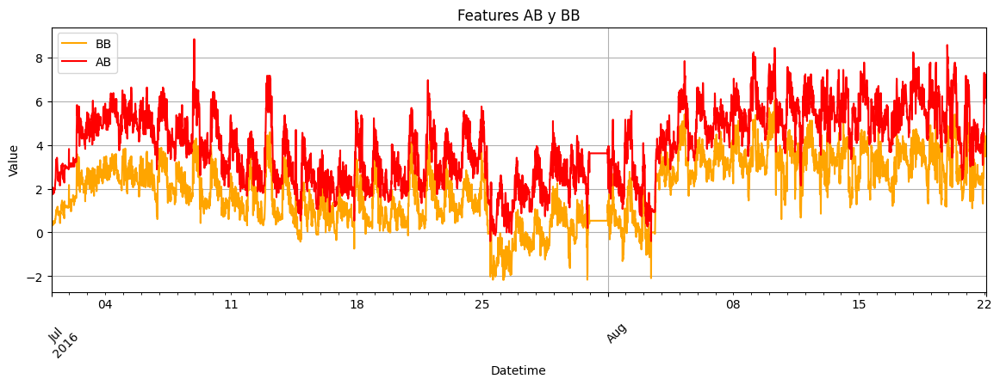

In [ ]:
df_train[:5000].plot(x='date', y='feature_BB', label='BB', color='orange', ax=plt.gca(), figsize=(14,4))
df_train[:5000].plot(x='date', y='feature_AB', label='AB', color='red', ax=plt.gca())

plt.legend()
plt.xlabel('Datetime')
plt.ylabel('Value')
plt.title('Features AB y BB')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

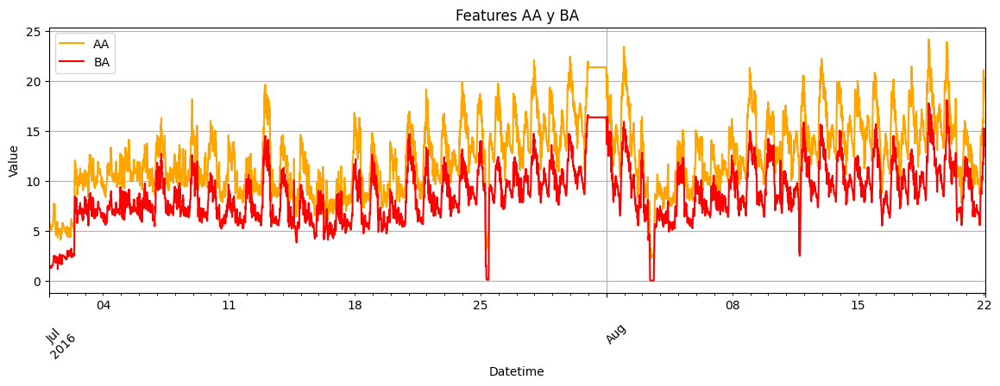

In [ ]:
df_train[:5000].plot(x='date', y='feature_AA', label='AA', color='orange', ax=plt.gca(), figsize=(14,4))
df_train[:5000].plot(x='date', y='feature_BA', label='BA', color='red', ax=plt.gca())

plt.legend()
plt.xlabel('Datetime')
plt.ylabel('Value')
plt.title('Features AA y BA')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

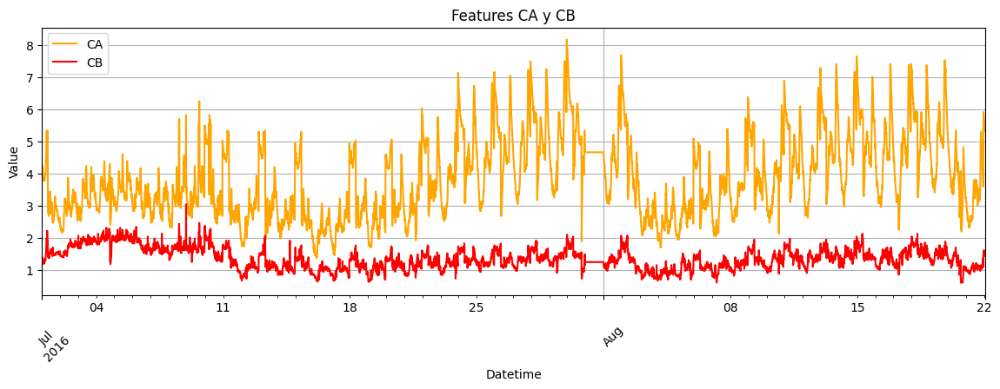

In [ ]:
df_train[:5000].plot(x='date', y='feature_CA', label='CA', color='orange', ax=plt.gca(), figsize=(14,4))
df_train[:5000].plot(x='date', y='feature_CB', label='CB', color='red', ax=plt.gca())

plt.legend()
plt.xlabel('Datetime')
plt.ylabel('Value')
plt.title('Features CA y CB')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

Las características [AB, BB] y [AA, BA] tienen un progreso común.

### **Análisis Estadístico de Temperatura**

Se realiza un análisis estadístico de la variable a predecir "Temperature"

count    64320.000000
mean        13.610430
std          8.827735
min         -4.221000
25%          6.753000
50%         11.959000
75%         18.712000
max         46.007000
Name: Temperature, dtype: float64 
 Skew:  0.8692401372554255 
 Kurtosis 0.49142246585074867


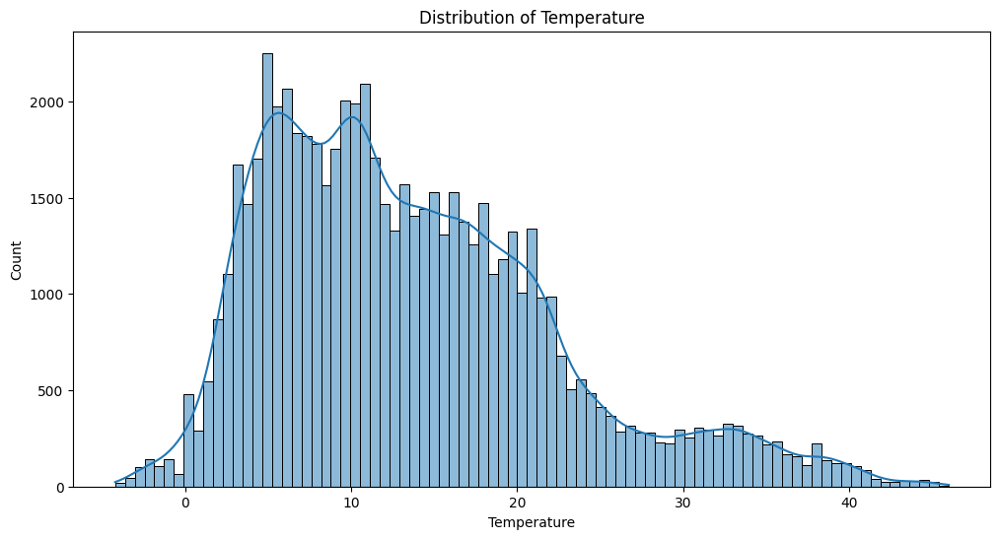

In [ ]:
import scipy.stats as stats
import seaborn as sns

features_init = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']


print(df_train['Temperature'].describe(), '\n', 'Skew: ', stats.skew(df_train['Temperature']), '\n', 'Kurtosis', stats.kurtosis(df_train['Temperature']))

plt.figure(figsize=(12, 6))
sns.histplot(df_train['Temperature'], kde=True)
plt.title('Distribution of Temperature')
plt.show()

**Conclusión**: La distribución de la temperatura presenta una asimetría positiva y no sigue una distribución normal gaussiana.

### **Estacionariedad y Trends**

**Estacionariedad**

En primer lugar se estudia la estacionariedad de las variables mediante el **Test estadístico de Dickey-Fuller Aumentado** (ADF)

In [ ]:
from statsmodels.tsa.stattools import adfuller

features = ["feature_AA", "feature_AB", "feature_BA", "feature_BB", "feature_CA", "feature_CB", "Temperature"]

for feature in features:
    print(f"### Análisis de {feature} ###")

    result = adfuller(df_train[feature])

    print(f"\tADF Statistic: {result[0]}")
    print(f"\tp-value: {result[1]}")

    if result[1] < 0.05:
        print("\t - La serie temporal es estacionaria.")
    else:
        print("\t - La serie NO es estacionaria")

### Análisis de feature_AA ###
	ADF Statistic: -26.278310007109276
	p-value: 0.0
	 - La serie temporal es estacionaria.
### Análisis de feature_AB ###
	ADF Statistic: -11.460024366265767
	p-value: 5.583994216380348e-21
	 - La serie temporal es estacionaria.
### Análisis de feature_BA ###
	ADF Statistic: -27.20965233383924
	p-value: 0.0
	 - La serie temporal es estacionaria.
### Análisis de feature_BB ###
	ADF Statistic: -10.962818100131523
	p-value: 8.244048842667236e-20
	 - La serie temporal es estacionaria.
### Análisis de feature_CA ###
	ADF Statistic: -15.608438464670892
	p-value: 1.7924124607160576e-28
	 - La serie temporal es estacionaria.
### Análisis de feature_CB ###
	ADF Statistic: -6.893840527607131
	p-value: 1.3344414012822878e-09
	 - La serie temporal es estacionaria.
### Análisis de Temperature ###
	ADF Statistic: -4.040257538726727
	p-value: 0.001213777964266948
	 - La serie temporal es estacionaria.


Las series temporales de todas las características son estacionarias, sus propiedades estadísticas permanencen **consantes**. Modelos como ARIMA requieren de series temporales estacionarias.

**Trends**

El siguiente paso es asegurarse si las series temporales tienen tendencia alrededor de una constante (modo c, media constante), o ct (media con tendencia lineal). En el caso de presentar alguna tendencia, sería conveniente eliminarla de la serie temporal para modelos como ARIMA. Esto se realiza mediante el test **KPSS** (Kwiatkowski-Phillips-Schmidt-Shin)

In [ ]:
from statsmodels.tsa.stattools import kpss

features = ["feature_AA", "feature_AB", "feature_BA", "feature_BB", "feature_CA", "feature_CB"]

for feature in features:
    print(f"### Análisis de {feature} ###")

    result = kpss(df_train[feature], regression='ct')  # c para nivel, ct para tendencia

    print(f"Estadístico KPSS: {result[0]}")
    print(f"P-valor: {result[1]}")

    if result[1] < 0.05:
        print("La serie tiene tendencia (puede provocar que la serie sea no estacionaria).")
    else:
        print("La serie no tiene tendencia (es estacionaria).")

### Análisis de feature_AA ###
Estadístico KPSS: 3.025594506256921
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_AB ###
Estadístico KPSS: 3.862944581545168
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_BA ###
Estadístico KPSS: 2.9400441195443303
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_BB ###
Estadístico KPSS: 3.3134166041429327
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_CA ###
Estadístico KPSS: 0.8511987411290376
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_CB ###
Estadístico KPSS: 0.9446485172077457
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).


C:\Users\jorge\AppData\Local\Temp\ipykernel_12924\1057556318.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(df_train[feature], regression='ct')  # c para nivel, ct para tendencia
C:\Users\jorge\AppData\Local\Temp\ipykernel_12924\1057556318.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(df_train[feature], regression='ct')  # c para nivel, ct para tendencia
C:\Users\jorge\AppData\Local\Temp\ipykernel_12924\1057556318.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(df_train[feature], regression='ct')  # c para nivel, ct para tendencia
C:\Users\jorge\AppData\Local\Temp\ipy

In [ ]:
from statsmodels.tsa.stattools import kpss

features = ["feature_AA", "feature_AB", "feature_BA", "feature_BB", "feature_CA", "feature_CB"]

for feature in features:
    print(f"### Análisis de {feature} ###")

    result = kpss(df_train[feature], regression='c')  # c para nivel, ct para tendencia

    print(f"Estadístico KPSS: {result[0]}")
    print(f"P-valor: {result[1]}")

    if result[1] < 0.05:
        print("La serie tiene tendencia (puede provocar que la serie sea no estacionaria).")
    else:
        print("La serie no tiene tendencia (es estacionaria).")

### Análisis de feature_AA ###
Estadístico KPSS: 7.693748603158485
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_AB ###
Estadístico KPSS: 3.8546327183748277
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_BA ###
Estadístico KPSS: 9.788788032528018
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_BB ###
Estadístico KPSS: 3.3950861175444738
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_CA ###
Estadístico KPSS: 2.3529679458317356
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).
### Análisis de feature_CB ###
Estadístico KPSS: 1.0367110840226461
P-valor: 0.01
La serie tiene tendencia (puede provocar que la serie sea no estacionaria).


C:\Users\jorge\AppData\Local\Temp\ipykernel_12924\539928909.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(df_train[feature], regression='c')  # c para nivel, ct para tendencia
C:\Users\jorge\AppData\Local\Temp\ipykernel_12924\539928909.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(df_train[feature], regression='c')  # c para nivel, ct para tendencia
C:\Users\jorge\AppData\Local\Temp\ipykernel_12924\539928909.py:8: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(df_train[feature], regression='c')  # c para nivel, ct para tendencia
C:\Users\jorge\AppData\Local\Temp\ipykernel

Dependiendo de los modelos que se empleen, es importante preprocesar las series temporales para eliminar la tendencia o conservarla. Por el estudio, parece ser que la **serie temporal incluye una ligera tendencia**. En algunas ocasiones, la tendencia y la estacionalidad pueden hacer que el modelo sea no estacionario, por lo que a veces es necesario eliminar ambas componentes de la serie temporal.

> **Conclusión**: En el Test ADF, los resultados indican que la serie es estacionaria.

A continuación se estudia el nivel de **estacionalidad** (día, mes, año, etc) con una **gráfica de correlación ACF* (Autocorrelation Function)*. El eje X representa los lags. El eje Y muestra el coeficiente de correlación. Valores +-1 representan una relación mas fuerte con su pasado.

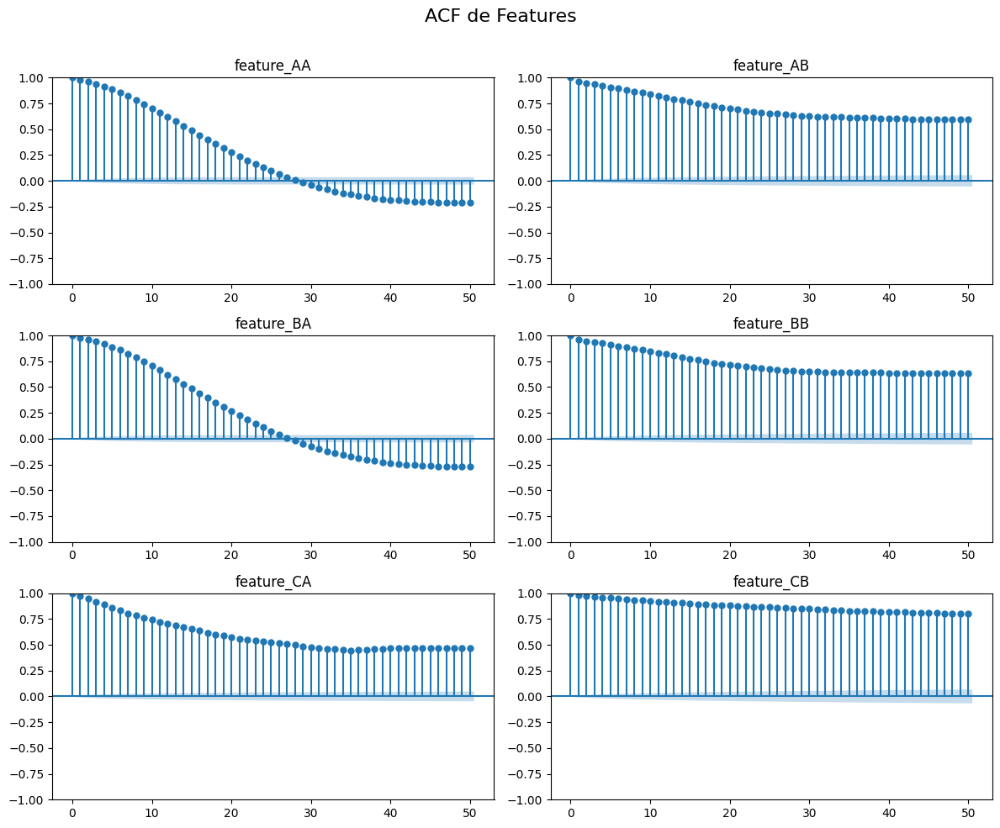

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

features = ["feature_AA", "feature_AB", "feature_BA", "feature_BB", "feature_CA", "feature_CB"]

fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle("ACF de Features", fontsize=16)

for i, feature in enumerate(features):
    row, col = divmod(i, 2)
    plot_acf(df_train[feature], lags=50, ax=axes[row, col])
    axes[row, col].set_title(feature)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

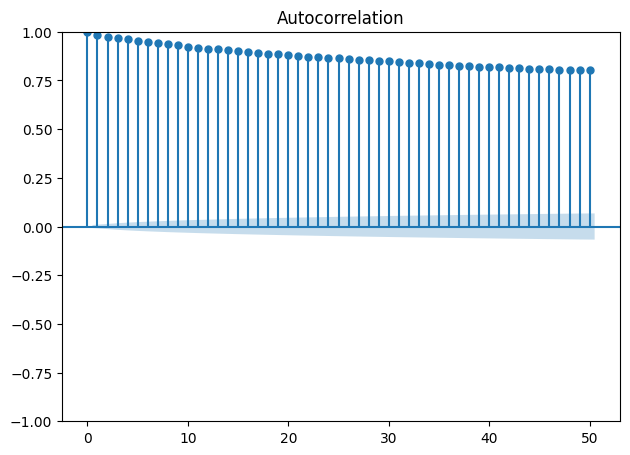

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

features = ["Temperature"]

plot_acf(df_train[feature], lags=50)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

> En la siguiente celda se evalúan 100 lags.

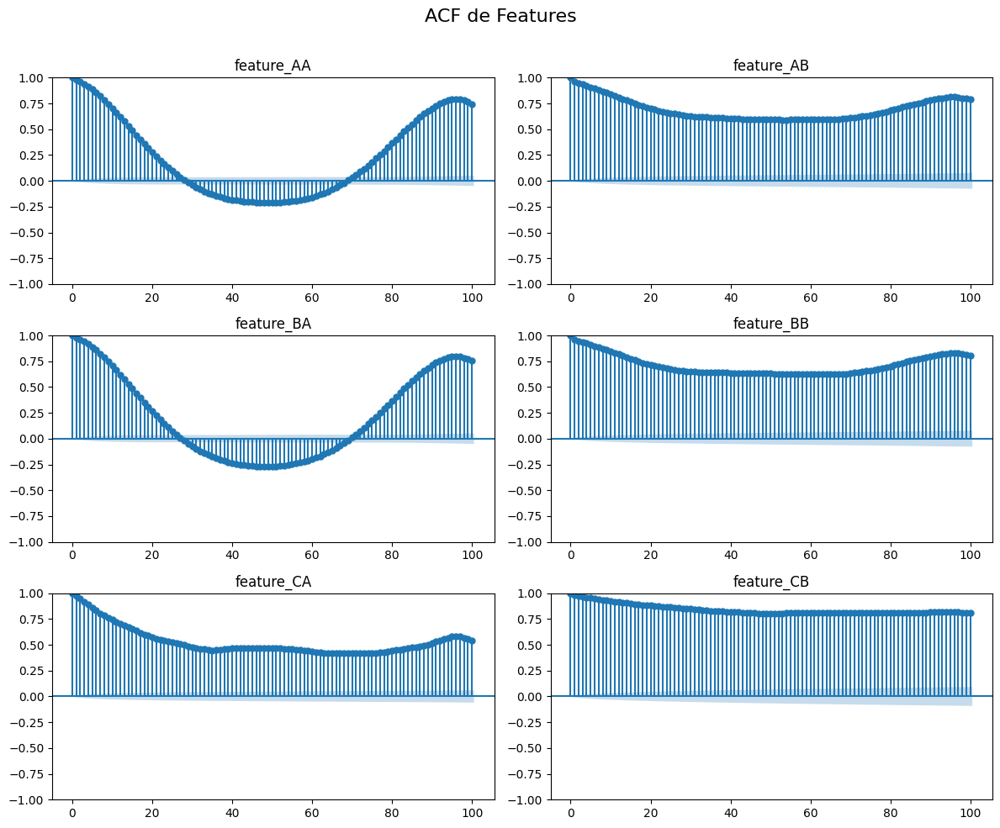

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

features = ["feature_AA", "feature_AB", "feature_BA", "feature_BB", "feature_CA", "feature_CB"]

fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle("ACF de Features", fontsize=16)

for i, feature in enumerate(features):
    row, col = divmod(i, 2)
    plot_acf(df_train[feature], lags=100, ax=axes[row, col])
    axes[row, col].set_title(feature)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

- feature_AA y feature_BA: Patrón de autocorrelación claramente oscilante con picos pronunciados cada ~100 lags. ```Indican fuerte estacionalidad periódica.```

- feature_AB, feature_BB, feature_CA: Tienen un patrón más suave pero todavía muestran picos alrededor de los 100 lags. Se sugiere cierta estacionalidad, aunque menos marcada. El nivel de autocorrelación se mantiene a 0.5 a lo largo de muchos lags. ```estacionalidad débil```.

- feature_CB: Presenta una autocorrelación que decayendo lentamente. ```Tendencia o componente no estacionaria más fuerte```

- Temperature: incluye no estacionalidad. Se debe aplicar diferenciación en modelos como ARIMA.

> **Conclusión**: No hay una estacionalidad común exacta para todas las series, pero hay un patrón recurrente cercano a 100 lags (25 horas) en varias. Esto sugiere un ciclo "repetitivo".

**PACF**

Las gráficas de autocorrelación incluyen correlaciones indirectas o transistorias entre timestamps. PACF (*partial autocorrelation function*) calcula las correlaciones directas.

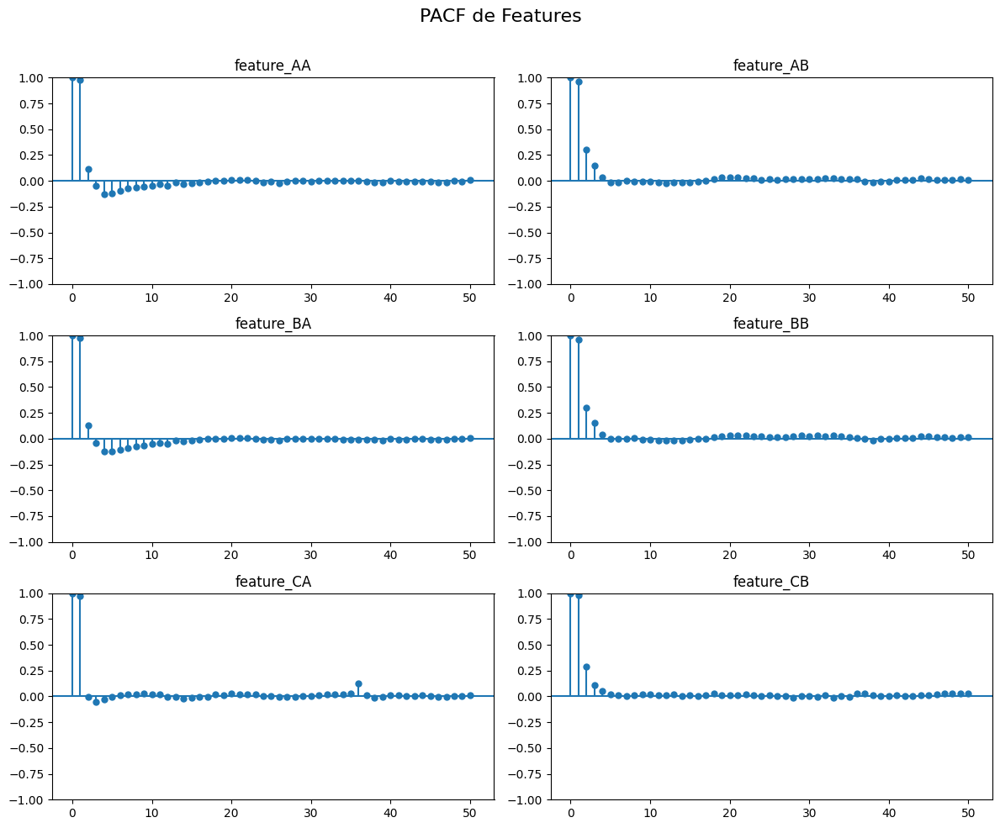

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf

features = ["feature_AA", "feature_AB", "feature_BA", "feature_BB", "feature_CA", "feature_CB"]

fig, axes = plt.subplots(3, 2, figsize=(12, 10))
fig.suptitle("PACF de Features", fontsize=16)

for i, feature in enumerate(features):
    row, col = divmod(i, 2)
    plot_pacf(df_train[feature], lags=50, ax=axes[row, col], method='ywm')
    axes[row, col].set_title(feature)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

> **Observación**: existe un cambio a partir del lag 4.

En la siguiente celda se analizan automáticamente los **lags más importantes** para determinar el orden adecuado de la **parte no estacional** del modelo SARIMA `(p, d, q)`:

- `p` - **AutoRegresivo (AR)**: Usa valores pasados (lags) de la serie para predecir. Se determina principalmente con el **gráfico PACF**.
- `d` - **Diferenciación**: Indica cuántas veces se debe diferenciar la serie para hacerla **estacionaria**. Se determina mediante el **test ADF** y análisis visual.
- `q` - **Media Móvil (MA)**: Usa errores pasados del modelo para predecir. Se identifica con el **gráfico ACF**.

Además, se puede modelar la **componente estacional** del modelo SARIMA mediante los parámetros `(P, D, Q, s)`:

- `P` - **AR estacional**: Como `p`, pero considerando rezagos estacionales (por ejemplo, 12 si es mensual). Se analiza con el **PACF estacional**.
- `D` - **Diferenciación estacional**: Número de diferenciaciones necesarias para eliminar la **estacionalidad** (por ejemplo, con `lag = 12`).
- `Q` - **MA estacional**: Como `q`, pero usando errores estacionales. Se analiza con el **ACF estacional**.
- `s` - **Periodo estacional**: Frecuencia del ciclo estacional (por ejemplo, `s = 12` para datos mensuales, `s = 24` para datos horarios diarios, etc.).

> Estos parámetros permiten capturar tanto la dinámica a corto plazo como los patrones repetitivos a largo plazo de una serie temporal.

In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import adfuller, acf, pacf

def estimate_sarimax_order(series, max_lag=20, alpha=0.05):
    series = series.dropna()
    n = len(series)
    threshold = 1.96 / np.sqrt(n)

    # 'p' con PACF ---
    pacf_vals = pacf(series, nlags=max_lag, method='ols')
    p_candidates = [i for i, val in enumerate(pacf_vals[1:], start=1) if abs(val) > threshold]
    p = max(p_candidates) if p_candidates else 0
    print(f"Lags PACF significativos (p): {p_candidates} → p = {p}")

    # 'q' con ACF ---
    acf_vals = acf(series, nlags=max_lag)
    q_candidates = [i for i, val in enumerate(acf_vals[1:], start=1) if abs(val) > threshold]
    q = max(q_candidates) if q_candidates else 0
    print(f"Lags ACF significativos (q): {q_candidates} → q = {q}")

    return (p, q)

train, test = read_data()
order = estimate_sarimax_order(train["Temperature"])
print(f"Orden SARIMA estimado: {order}")

Lags PACF significativos (p): [1, 2, 3, 4, 7, 11, 18, 20] → p = 20
Lags ACF significativos (q): [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20] → q = 20
Orden SARIMA estimado: (20, 20)


**Nota**: Elegir `p` y `q` con lag 20 puede sobreajustar el modelo. Es crucial elegir un lag significativo, en torno a 4 o 5.

## 1️⃣ **Primer Experimento**. Modelo ARIMA **univariable con Temperature**
---
El primer experimento que se prueba es ARIMA (AutoRegressive Integrated Moving Average).

El modelo **ARIMA** (AutoRegressive Integrated Moving Average) es una técnica estadística clásica modelar y pronosticar series temporales.

### ¿Qué significa ARIMA?

**Fuentes**:
    1. https://www.youtube.com/watch?v=ZE_WGBe0_VU

- **AR (AutoRegressive)**: El modelo usa los valores pasados (lags) de la propia serie como predictores.
- **I (Integrated)**: Representa el número de veces que se diferencia la serie para hacerla estacionaria (es decir, eliminar la **tendencia**).
- **MA (Moving Average)**: Modela la relación entre la observación actual y los errores (residuos) de predicciones pasadas.

El modelo se representa como:   `ARIMA(p, d, q)`

Donde:
- `p`: número de retardos (lags) autoregresivos,
- `d`: número de diferencias necesarias para hacer la serie estacionaria (**quita la tendencia**),
- `q`: número de términos de media móvil.

- **Tendencia**: el componente `I` (Integrated) se encarga de eliminar la **tendencia** mediante diferenciación.

Estos modelos predicen valores futuros en base a las relaciones de los valores pasados. **ARIMA es univariable**.





En el test ADF, la variable Temperature resulta estacionaria. Sin embargo, en ACF aparenta no estacionaria porque la correlación decrece lentamente

### Demo
> A modo práctico, se prueba una Auto Regresión de orden 1 para evaluar el resultado esperado. Fuente: https://www.kaggle.com/code/iamleonie/time-series-interpreting-acf-and-pacf#AR(1)-Process

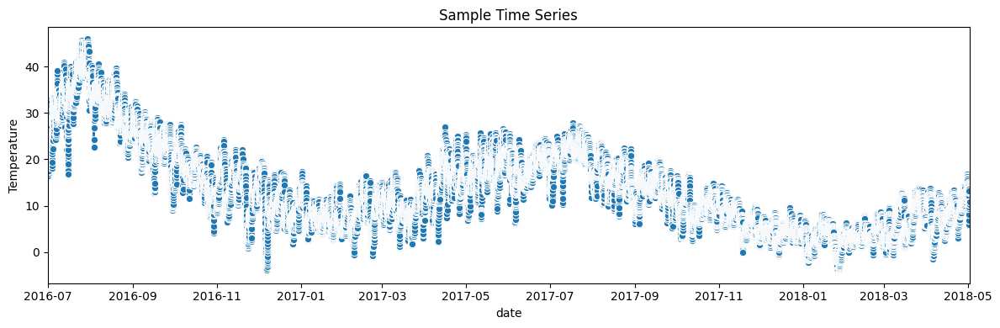

In [ ]:
from statsmodels.tsa.stattools import adfuller
import seaborn as sns

def check_stationarity(series):

    result = adfuller(series.values)

    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m")
    else:
        print("\x1b[31mNon-stationary\x1b[0m")


f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))

sns.lineplot(x=df_train["date"], y=df_train["Temperature"], marker='o')
ax.set_xlim([df_train.date.iloc[0], df_train.date.iloc[-1]])
ax.set_title('Sample Time Series')
plt.tight_layout()
plt.show()

In [ ]:
check_stationarity(df_train['Temperature'])

ADF Statistic: -4.040258
p-value: 0.001214
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567
Stationary


                            AutoReg Model Results                             
Dep. Variable:            Temperature   No. Observations:                51456
Model:                     AutoReg(1)   Log Likelihood              -35515.152
Method:               Conditional MLE   S.D. of innovations              0.483
Date:                Wed, 14 May 2025   AIC                          71036.304
Time:                        16:34:58   BIC                          71062.850
Sample:                             1   HQIC                         71044.608
                                51456                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0248      0.004      5.571      0.000       0.016       0.034
Temperature.L1     0.9984      0.000   4005.575      0.000       0.998       0.999
                                    

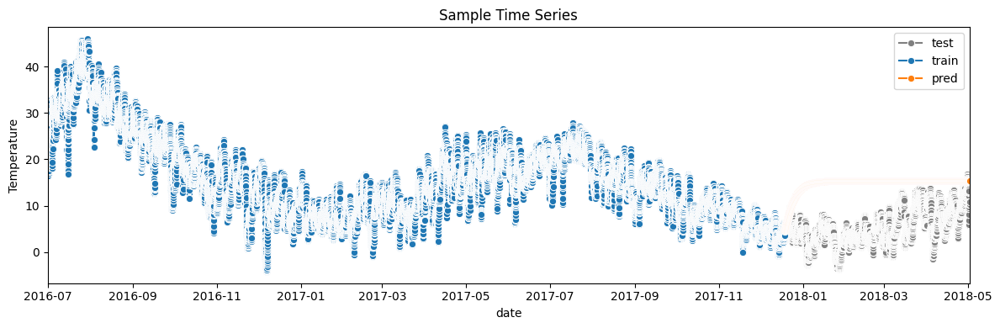

In [ ]:
from statsmodels.tsa.ar_model import AutoReg
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


train_len = int(0.8 * len(df_train))
train = df_train['Temperature'][:train_len]
test = df_train['Temperature'][train_len:]

ar_model = AutoReg(train, lags=1).fit()
print(ar_model.summary())

pred = ar_model.predict(start=train_len, end=len(df_train)-1, dynamic=False)

residuals = ar_model.resid

n_simulations = 1000
simulated_paths = []

for i in range(n_simulations):

    simulated = pred.copy()
    noise = np.random.choice(residuals, size=len(test), replace=True)
    simulated += noise
    simulated_paths.append(simulated)

simulated_paths = np.array(simulated_paths)

quantiles = [0.025, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45,
             0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.975]

submission_dict = {
    q: np.quantile(simulated_paths, q, axis=0) for q in quantiles
}

submission_df = pd.DataFrame(submission_dict)
submission_df["timestamp"] = df_train.date[train_len:]
submission_df = submission_df.set_index("timestamp")

solution_df = pd.DataFrame({"Temperature": test.values}, index=df_train.date[train_len:])

score = us.crps(submission_df, solution_df)
print(f"\n --> CRPS Score: {score:.4f}")

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
sns.lineplot(x=df_train.date[train_len:], y=test, marker='o', label='test', color='grey')
sns.lineplot(x=df_train.date[:train_len], y=train, marker='o', label='train')
sns.lineplot(x=df_train.date[train_len:], y=pred, marker='o', label='pred')
ax.set_xlim([df_train.date.iloc[0], df_train.date.iloc[-1]])
ax.set_title('Sample Time Series')
plt.tight_layout()
plt.show()

> Se prueba también una AR(2)

                            AutoReg Model Results                             
Dep. Variable:            Temperature   No. Observations:                51456
Model:                     AutoReg(2)   Log Likelihood              -35323.009
Method:               Conditional MLE   S.D. of innovations              0.481
Date:                Wed, 14 May 2025   AIC                          70654.018
Time:                        16:42:45   BIC                          70689.411
Sample:                             2   HQIC                         70665.090
                                51456                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0270      0.004      6.082      0.000       0.018       0.036
Temperature.L1     1.0845      0.004    246.914      0.000       1.076       1.093
Temperature.L2    -0.0862      0.004

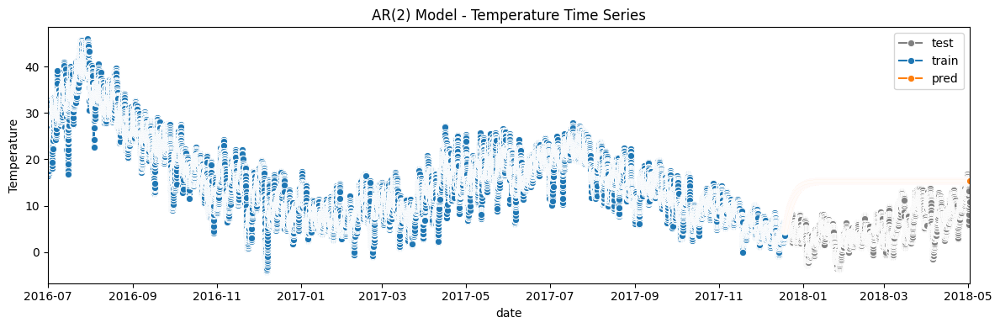


 --> CRPS Score: 9.1075


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg

train_len = int(0.8 * len(df_train))

train = df_train['Temperature'][:train_len]
test = df_train['Temperature'][train_len:]


ar_model = AutoReg(train, lags=2).fit()


print(ar_model.summary())


pred = ar_model.predict(start=train_len, end=len(df_train)-1, dynamic=False)


f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))
sns.lineplot(x=df_train['date'][train_len:], y=test, marker='o', label='test', color='grey')
sns.lineplot(x=df_train['date'][:train_len], y=train, marker='o', label='train')
sns.lineplot(x=df_train['date'][train_len:], y=pred, marker='o', label='pred')
ax.set_xlim([df_train['date'].iloc[0], df_train['date'].iloc[-1]])
ax.set_title('AR(2) Model - Temperature Time Series')
plt.tight_layout()
plt.show()

n_simulations = 1000
simulated_paths = []
residuals = ar_model.resid


for i in range(n_simulations):
    simulated = pred.copy()
    noise = np.random.choice(residuals, size=len(test), replace=True)
    simulated += noise  # Añade ruido de bootstrap
    simulated_paths.append(simulated)

simulated_paths = np.array(simulated_paths)

quantiles = [0.025, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45,
             0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.975]

submission_dict = {
    q: np.quantile(simulated_paths, q, axis=0) for q in quantiles
}

submission_df = pd.DataFrame(submission_dict)
submission_df["timestamp"] = df_train['date'][train_len:]
submission_df = submission_df.set_index("timestamp")


solution_df = pd.DataFrame({"Temperature": test.values}, index=df_train['date'][train_len:])


score = us.crps(submission_df, solution_df)
print(f"\n --> CRPS Score: {score:.4f}")


### Pruebas ARIMA y SARIMAX

Para evaluar la incertidumbre de las predicciones, se hace uso de la **Simulación de Caminos con Bootstrapping de Residuos**.

> ¿Qué es la Simulación de Caminos con Bootstrapping de Residuos?

Una vez que se entrena el modelo ARIMA sobre la serie temporal, se pueden obtener predicciones puntuales para el conjunto de test. Sin embargo, estas predicciones no dicen nada sobre la **incertidumbre**.

Para estimar esa incertidumbre, en el Primer y Segundo Experimento se usa **bootstrapping de residuos**.

Después de ajustar el modelo ARIMA, se obtiene una secuencia de **residuos**: la diferencia entre los valores reales y los valores predichos por el modelo en el conjunto de entrenamiento. Estos residuos representan el tipo de error que comete el modelo al hacer predicciones.

La idea es que, si estos errores se comportan de forma similar en el futuro, se pueden simular posibles trayectorias futuras del modelo simplemente **añadiendo errores similares (muestreados aleatoriamente)** a las predicciones.

> **Primera prueba ARIMA con Temperature**

                               SARIMAX Results                                
Dep. Variable:            Temperature   No. Observations:                51456
Model:                ARIMA(30, 1, 0)   Log Likelihood              -35262.877
Date:                Wed, 14 May 2025   AIC                          70587.753
Time:                        15:58:43   BIC                          70862.056
Sample:                             0   HQIC                         70673.563
                              - 51456                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0879      0.002     40.061      0.000       0.084       0.092
ar.L2         -0.0401      0.002    -16.457      0.000      -0.045      -0.035
ar.L3         -0.0102      0.003     -3.748      0.0

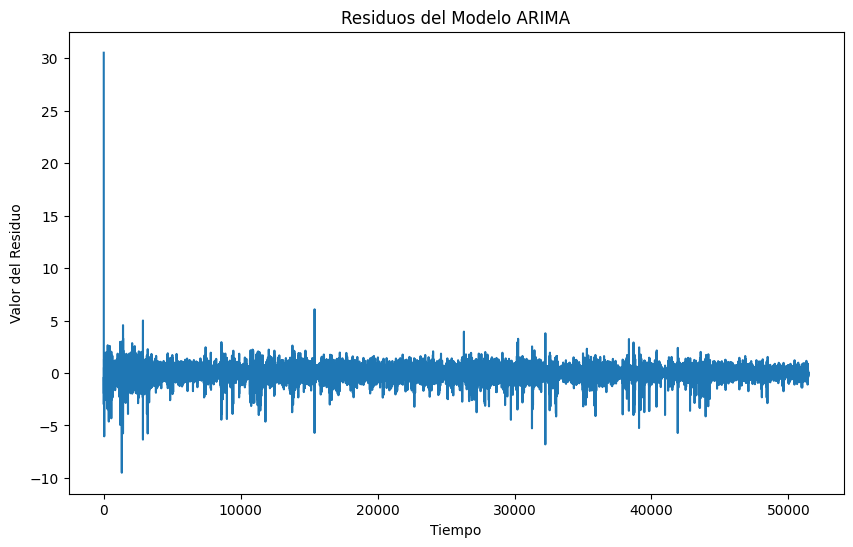


 --> CRPS Score: 2.4467


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

feature_to_model = "Temperature"
data_to_model = df_train[feature_to_model]

train_size = int(len(data_to_model) * 0.8)
train_data = data_to_model[:train_size]
test_data = data_to_model[train_size:]
n_test = len(test_data)


order = (30, 1, 0)
model = ARIMA(train_data, order=order)
model_fit = model.fit()

print(model_fit.summary())

### PLOT DE RESIDUOS. Se analiza si los residuos (diff entre prediccion y valor real) presentasen patrones
residuals = model_fit.resid
plt.figure(figsize=(10, 6))
plt.plot(residuals)
plt.title("Residuos del Modelo ARIMA")
plt.xlabel("Tiempo")
plt.ylabel("Valor del Residuo")
plt.show()

residuals = model_fit.resid.dropna().values

n_simulations = 1000
simulated_paths = []

forecast_mean = model_fit.forecast(steps=n_test)

for i in range(n_simulations):
    simulated = forecast_mean.copy()
    noise = np.random.choice(residuals, size=n_test, replace=True)
    simulated += noise  # Añade ruido
    simulated_paths.append(simulated)

simulated_paths = np.array(simulated_paths)  # shape: (n_simulations, n_test)

# cuantiless
quantiles = [0.025, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45,
             0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.975]

submission_dict = {
    q: np.quantile(simulated_paths, q, axis=0) for q in quantiles
}

submission_df = pd.DataFrame(submission_dict)
submission_df["timestamp"] = test_data.index
submission_df = submission_df.set_index("timestamp")

solution_df = pd.DataFrame({"Temperature": test_data.values}, index=test_data.index)

# CRPS
score = us.crps(submission_df, solution_df)
print(f"\n --> CRPS Score: {score:.4f}")

Los modelos como ARIMA son ineficientes en series temporales multivariables. En este caso concreto, resulta difícil predecir la temperatura en base a su valores pasados.

SARIMA se ajusta mejor a la dimensión del problema porque permite modelar la estacionalidad de una serie temporal. La temperatura suele presentar patrones repetitivos en ciertos intervalos, aunque incorpora una tendencia progresiva ascendente o descendente a medida que avanza la serie temporal en meses.

                               SARIMAX Results                                
Dep. Variable:            Temperature   No. Observations:                51456
Model:               SARIMAX(5, 1, 0)   Log Likelihood              -35302.966
Date:                Wed, 14 May 2025   AIC                          70617.932
Time:                        16:17:48   BIC                          70671.023
Sample:                             0   HQIC                         70634.541
                              - 51456                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0884      0.002     40.640      0.000       0.084       0.093
ar.L2         -0.0397      0.002    -16.610      0.000      -0.044      -0.035
ar.L3         -0.0098      0.003     -3.635      0.0

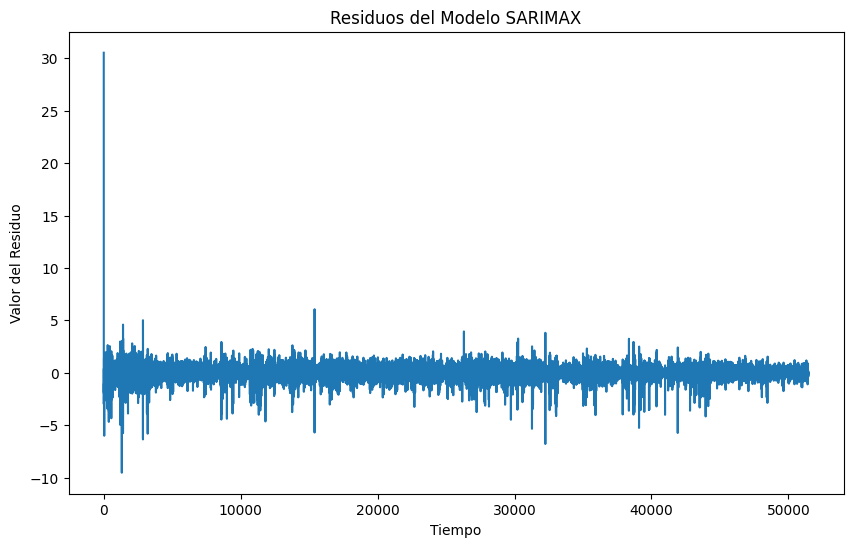


 --> CRPS Score: 2.4494


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

feature_to_model = "Temperature"
data_to_model = df_train[feature_to_model]

train_size = int(len(data_to_model) * 0.8)
train_data = data_to_model[:train_size]
test_data = data_to_model[train_size:]
n_test = len(test_data)


order = (5, 1, 0)
model = SARIMAX(train_data, order=order, trend="n")
model_fit = model.fit()

print(model_fit.summary())

### PLOT DE RESIDUOS. Se analiza si los residuos (diff entre prediccion y valor real) presentasen patrones
residuals = model_fit.resid
plt.figure(figsize=(10, 6))
plt.plot(residuals)
plt.title("Residuos del Modelo SARIMAX")
plt.xlabel("Tiempo")
plt.ylabel("Valor del Residuo")
plt.show()

residuals = model_fit.resid.dropna().values

n_simulations = 1000
simulated_paths = []

forecast_mean = model_fit.forecast(steps=n_test)

for i in range(n_simulations):
    simulated = forecast_mean.copy()
    noise = np.random.choice(residuals, size=n_test, replace=True)
    simulated += noise  # Añade ruido
    simulated_paths.append(simulated)

simulated_paths = np.array(simulated_paths)  # shape: (n_simulations, n_test)

# cuantiless
quantiles = [0.025, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45,
             0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.975]

submission_dict = {
    q: np.quantile(simulated_paths, q, axis=0) for q in quantiles
}

submission_df = pd.DataFrame(submission_dict)
submission_df["timestamp"] = test_data.index
submission_df = submission_df.set_index("timestamp")

solution_df = pd.DataFrame({"Temperature": test_data.values}, index=test_data.index)

# CRPS
score = crps(submission_df, solution_df)
print(f"\n --> CRPS Score: {score:.4f}")

Ambos modelos ARIMA y SARIMAX devuelven resultados alejados a los de la clasificación. En el siguiente apartado "2º Experimento" se cuenta con un tipo de **modelo multivariable**.

En el siguiente código se visualiza como captura SARIMAX la temperatura en los datos de entrenamiento.

In [ ]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from statsforecast import StatsForecast

import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go

import warnings
from tqdm import TqdmExperimentalWarning

warnings.filterwarnings("ignore", category=TqdmExperimentalWarning)

train, test = read_data()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def normalize_data(df, features, target=None):
    df = df.copy()
    scaler = MinMaxScaler()

    df[features] = scaler.fit_transform(df[features])

    if target:
        target_scaler = MinMaxScaler()
        df[[target]] = target_scaler.fit_transform(df[[target]])
        return df, scaler, target_scaler  # Devolvemos ambos scalers
    else:
        return df, scaler, None


def zscore_normalize_data(df, features, target=None):
    df = df.copy()

    # Normalizar features
    feature_mean = df[features].mean()
    feature_std = df[features].std()
    df[features] = (df[features] - feature_mean) / feature_std

    # Normalizar target si se indica
    if target:
        target_mean = df[target].mean()
        target_std = df[target].std()
        df[target] = (df[target] - target_mean) / target_std

        return df, (feature_mean, feature_std), (target_mean, target_std)
    else:
        return df, (feature_mean, feature_std), None

In [ ]:
train.set_index('date', inplace=True)
test.set_index('date', inplace=True)

In [ ]:
train.drop(columns = 'id', inplace = True)
test.drop(columns = 'id', inplace = True)

In [ ]:
features_columns = [col for col in train.columns if 'feature' in col]
X_train_df = train[features_columns]
X_train_df.head()

X_test_df = test[features_columns]
X_test_df.head()

,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB
date,,,,,,
2018-05-02 00:00:00,14.133,2.076,9.346,-0.036,4.538,1.279
2018-05-02 00:15:00,12.123,1.541,7.818,-0.746,4.538,1.249
2018-05-02 00:30:00,12.525,1.741,8.209,-0.284,4.477,1.279
2018-05-02 00:45:00,12.324,1.942,7.747,0.249,4.630,1.371
2018-05-02 01:00:00,14.602,1.407,9.630,-0.320,4.477,1.310


In [ ]:
model = sm.tsa.SARIMAX(endog = train['Temperature'], exog=X_train_df, order=(1, 0, 1), seasonal_order=(1, 0, 1, 4))
results = model.fit()

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 15min will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency 15min will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [ ]:
### Predicciones sobre el conjunto de entrenamiento
train['forecast'] = results.predict(start=train.index[0], end=train.index[-1], dynamic=False, exog=X_train_df)

### Predicciones sobre el conjunto de test
forecast = results.predict(start=test.index[0], end=test.index[-1], exog=X_test_df)

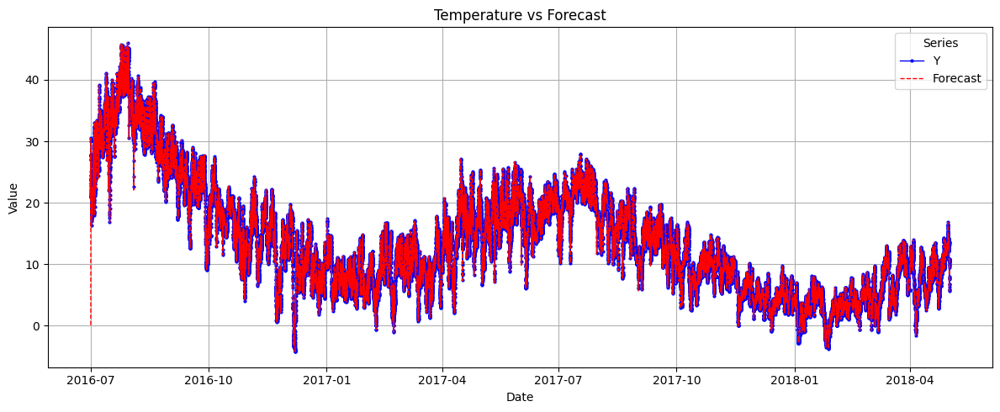

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Serie real (Temperature)
plt.plot(train.index, train['Temperature'], label='Y', color='blue', linewidth=1, marker='o', markersize=2)

# Forecast
plt.plot(train.index, train['forecast'], label='Forecast', color='red', linestyle='--', linewidth=1)

plt.title('Temperature vs Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(title='Series')
plt.grid(True)
plt.tight_layout()

# Mostrar
plt.show()


## 2️⃣ **Segundo Experimento**. Modelo **VAR**
---
Este tipo de modelos son ideales para series temporales multivariables dependientes entre ellas. Estos modelos tratan todas las features como endógenas, por tanto, no se debe diferenciar entre la feature predicha y las predictoras.

El requisito que tiene que seguir una serie temporal para aplicar este tipo de modelo es:

- Estacionariedad: la constante y varianza de los valores de las *features* debe ser constante en el tiempo. *Este requisito se cumple en el test ADF realizado anteriormente*.


En modelos multivariables, es crucial eliminar aquellas características con una correlación por encima de 0.8, eliminando información redundante.
Como las variables [AA, BA] y [BB, AB] están correlacionadas, se prescinde de BA y AB.

> La evaluación de la incertidumbre en intervalos también se realizará con **Bootstrapping de residuos.**

In [ ]:
df_train_var = df_train.copy()

In [ ]:
df_train_var.drop(columns=["feature_BA", "feature_AB"], inplace=True)

In [ ]:
from statsmodels.tsa.stattools import adfuller

features = ["feature_AA", "feature_BB", "feature_CA", "feature_CB", "Temperature"]

for feature in features:
    print(f"### Análisis de {feature} ###")

    result = adfuller(df_train_var[feature].iloc[0:10000])

    print(f"\tADF Statistic: {result[0]}")
    print(f"\tp-value: {result[1]}")

    if result[1] < 0.05:
        print("\t - La serie temporal es estacionaria.")
    else:
        print("\t - La serie NO es estacionaria")

### Análisis de feature_AA ###
	ADF Statistic: -26.278310007109276
	p-value: 0.0
	 - La serie temporal es estacionaria.
### Análisis de feature_BB ###
	ADF Statistic: -10.962818100131523
	p-value: 8.244048842667236e-20
	 - La serie temporal es estacionaria.
### Análisis de feature_CA ###
	ADF Statistic: -15.608438464670892
	p-value: 1.7924124607160576e-28
	 - La serie temporal es estacionaria.
### Análisis de feature_CB ###
	ADF Statistic: -6.893840527607131
	p-value: 1.3344414012822878e-09
	 - La serie temporal es estacionaria.
### Análisis de Temperature ###
	ADF Statistic: -4.040257538726727
	p-value: 0.001213777964266948
	 - La serie temporal es estacionaria.


La serie temporal completa presenta estacionariedad. Más adelante se considerará la estacionariedad localmente (por ventanas).

#### **Orden de VAR**

En los modelos **VAR (Vector Autoregression)**, determinar el orden óptimo (número de lags) es fundamental para lograr precisión y eficiencia. Este orden define cuántos puntos temporales previos se utilizan para predecir el valor actual de la serie.

Para elegir el mejor orden, se utilizan comúnmente **criterios** como:
- **AIC** (Akaike Information Criterion)
- **BIC** (Bayesian Information Criterion)
- **HQIC** (Hannan-Quinn Information Criterion)

Estos criterios buscan un equilibrio entre:
- **La complejidad del modelo** (cantidad de lags)
- **La calidad del ajuste**

In [ ]:
from statsmodels.tsa.api import VAR

model = VAR(df_train_var[['feature_AA','feature_BB', 'feature_CA', 'feature_CB', 'Temperature']])

lag_order_results = model.select_order(maxlags=100)
print(lag_order_results.summary())

  VAR Order Selection (* highlights the minimums)  
        AIC         BIC         FPE         HQIC   
---------------------------------------------------
0         8.434       8.435       4601.       8.434
1        -9.421      -9.417   8.102e-05      -9.420
2        -9.683      -9.675   6.234e-05      -9.681
3        -9.743      -9.732   5.870e-05      -9.740
4        -9.768      -9.753   5.727e-05      -9.763
5        -9.784      -9.765   5.636e-05      -9.778
6        -9.797      -9.775   5.562e-05      -9.790
7        -9.811      -9.786   5.484e-05      -9.803
8        -9.823      -9.794   5.419e-05      -9.814
9        -9.832      -9.799   5.372e-05      -9.822
10       -9.837      -9.801   5.342e-05      -9.826
11       -9.841      -9.802   5.321e-05      -9.829
12       -9.847      -9.804   5.289e-05      -9.834
13       -9.851      -9.805   5.269e-05      -9.837
14       -9.855      -9.804   5.251e-05      -9.839
15       -9.858      -9.805   5.231e-05      -9.842
16       -9.

Aunque el lag mas idoneo sea 100, computacionalmente es costoso. Se recomienda un lag en torno a 30 porque no hay mucha diferencia en torno a AIC, BIC y HQIC.

In [ ]:
df_train_var.drop(columns=["id", "date"], inplace=True)

In [ ]:
from statsmodels.tsa.api import VAR

model = VAR(df_train_var)
model_fitted = model.fit(10, ic='aic', trend='ct')

In [ ]:
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 14, May, 2025
Time:                     21:23:47
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -9.80191
Nobs:                     64310.0    HQIC:                  -9.82723
Log likelihood:          -139640.    FPE:                5.33525e-05
AIC:                     -9.83859    Det(Omega_mle):     5.31374e-05
--------------------------------------------------------------------
Results for equation feature_AA
                     coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------
const                   0.345333         0.025568           13.507           0.000
trend                  -0.000002         0.000000           -4.342           0.000
L1.feature_AA           0.779420         0.0040

La estadística de Durbin-Watson es una medida estadística que se usa para detectar autocorrelación en los residuos de un modelo de regresión. Es decir, si los errores siguen un patrón en el tiempo.

- Se mide si hay dependencia temporal entre los residuos. Su valor varía de 0 a 4:

    1. `≈` 2: No hay autocorrelación (lo deseado)

    2. `<` 2: Hay autocorrelación positiva (mal)

    3. `>` 2: Hay autocorrelación negativa (también problemático)

In [ ]:
from statsmodels.stats.stattools import durbin_watson

dw_stats = durbin_watson(model_fitted.resid)

for col, stat in zip(df_train_var.columns, dw_stats):
    print(f'{col}: {stat}')

feature_AA: 2.0069345127617484
feature_BB: 2.0008609247670277
feature_CA: 2.0013244066986156
feature_CB: 2.0008070652659664
Temperature: 2.0000438461608816


**Conclusión**: No hay evidencia de autocorrelación en los errores. Parece que el modelo captura correctamente la dinámica temporal de los datos.

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 16, May, 2025
Time:                     13:49:49
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -9.89107
Nobs:                     51436.0    HQIC:                  -9.95077
Log likelihood:          -107805.    FPE:                4.64124e-05
AIC:                     -9.97794    Det(Omega_mle):     4.59594e-05
--------------------------------------------------------------------
Results for equation feature_AA
                     coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------
const                   0.182012         0.019058            9.550           0.000
L1.feature_AA           0.750948         0.004520          166.149           0.000
L1.feature_BB           0.030921         0.0126

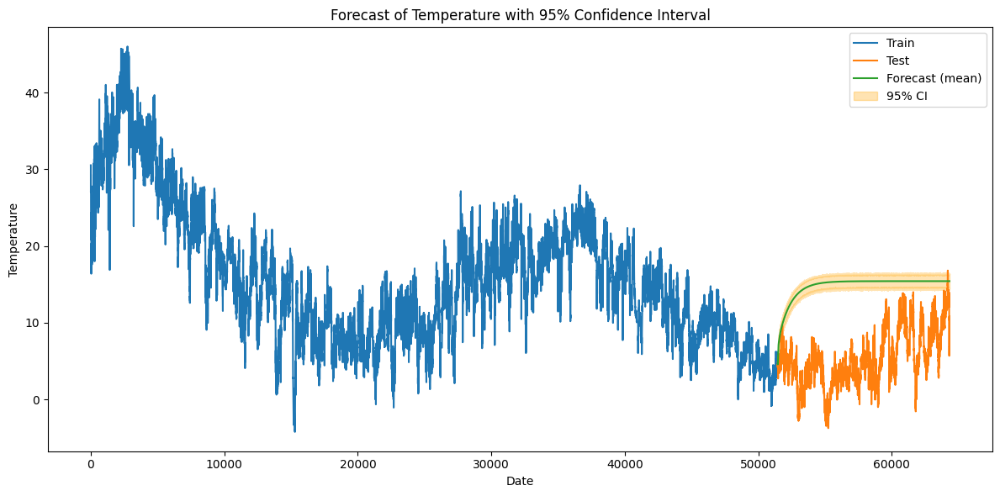

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.api import VAR
from statsmodels.stats.stattools import durbin_watson


train_len = int(0.8 * len(df_train_var))
train_df = df_train_var.iloc[:train_len]
test_df = df_train_var.iloc[train_len:]

model = VAR(train_df)
model_fitted = model.fit(20)  # 10 lags y criterio AIC
print(model_fitted.summary())

### Forecasting
forecast_steps = len(test_df)
forecast = model_fitted.forecast(y=train_df.values, steps=forecast_steps)

forecast_df = pd.DataFrame(forecast, index=test_df.index, columns=train_df.columns)

pred_temperature = forecast_df['Temperature']


residuals = model_fitted.resid['Temperature'].values

n_simulations = 1000
simulated_paths = []

for _ in range(n_simulations):
    simulated = pred_temperature.copy()
    noise = np.random.choice(residuals, size=len(pred_temperature), replace=True)
    simulated += noise
    simulated_paths.append(simulated)

simulated_paths = np.array(simulated_paths)


# ------------------------------------------------------
# ------------------------ CRPS ------------------------
# ------------------------------------------------------

true_temperature = test_df['Temperature'].values
solution_df = pd.DataFrame({"Temperature": test_df["Temperature"].values}, index=test_df.index)

# cuantiless
quantiles = [0.025, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45,
             0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 0.975]

submission_dict = {
    q: np.quantile(simulated_paths, q, axis=0) for q in quantiles
}

submission_df = pd.DataFrame(submission_dict)
submission_df["timestamp"] = test_df.index
submission_df = submission_df.set_index("timestamp")

score = us.crps(submission_df, solution_df)


print(f"\n --> CRPS Score: {score:.4f}")


plt.figure(figsize=(12, 6))
sns.lineplot(x=train_df.index, y=train_df['Temperature'], label='Train')
sns.lineplot(x=test_df.index, y=true_temperature, label='Test')
sns.lineplot(x=test_df.index, y=pred_temperature, label='Forecast (mean)')
plt.fill_between(
    test_df.index,
    np.percentile(simulated_paths, 2.5, axis=0),
    np.percentile(simulated_paths, 97.5, axis=0),
    alpha=0.3, color='orange', label='95% CI'
)
plt.title('Forecast of Temperature with 95% Confidence Interval')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.tight_layout()
plt.show()


## 3️⃣ **Tercer Experimento**. Feature Engineering con datos tabulares y LightGBM
---

La idea de este experimento es enriquecer los datos con nuevas features. No se va a usar un modelo clásico para procesar datos históricos secuenciales.



In [ ]:
train = pd.read_csv("./data/train.csv", sep=",")
test = pd.read_csv("./data/test.csv", sep=",")
train_public  = pd.read_csv("./data/train_and_Public.csv", sep=",")

train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])
train_public['date'] = pd.to_datetime(train_public['date'])

train['is_train'] = 1
test['is_train'] = 0
train_public['is_train'] = 1

train = pd.concat([train_public, test], ignore_index=True)
train.head()

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,is_train
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000,1
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999,1
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000,1
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000,1
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001,1


In [ ]:
initial_features = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']

count    67008.000000
mean        13.471402
std          8.692666
min         -4.221000
25%          6.894000
50%         11.678000
75%         18.431000
max         46.007000
Name: Temperature, dtype: float64 
 Skew:  0.9152360823105995 
 Kurtosis 0.6263973007267363


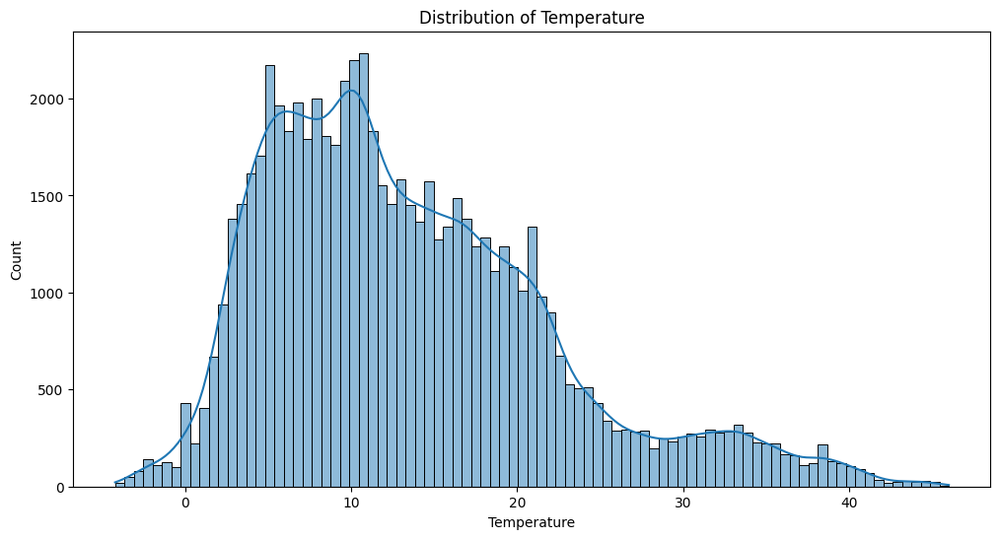

In [ ]:
import scipy.stats as stats
print(train_public['Temperature'].describe(), '\n', 'Skew: ', stats.skew(train_public['Temperature']), '\n', 'Kurtosis', stats.kurtosis(train_public['Temperature']))

plt.figure(figsize=(12, 6))
sns.histplot(train['Temperature'], kde=True)
plt.title('Distribution of Temperature')
plt.show()

### **Feature Engineering**

Se extraen nuevas features para enriquecer los datos.

#### **Test de Granger**

El **Test de Granger** evalúa si una serie temporal **X "causa" (en el sentido estadístico) a otra serie Y**, es decir, si **los valores pasados de X contienen información útil para predecir Y**.

- Ajusta un modelo autoregresivo para Y
- Compara este modelo con otro que también incluye retardos (lags) de X
- Si el modelo con X mejora significativamente la predicción de Y (según un test F), se considera que **X Granger-causa a Y**

Se realiza la prueba para varios lags (ej. lag 1 a lag 50).
- Para cada lag, se calcula un **p-valor**:
  - Si el p-valor es **< 0.05**, se **rechaza la hipótesis nula**, y se concluye que **X ayuda a predecir Y** en ese lag.
  - Si el p-valor es **> 0.05**, no hay evidencia de causalidad

> **Puntos por debajo de la línea roja indican causalidad significativa**


Granger Causality Test: feature_AA -> Temperature


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\statsmodels\tsa\stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality Test: feature_AB -> Temperature


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\statsmodels\tsa\stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality Test: feature_BA -> Temperature


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\statsmodels\tsa\stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality Test: feature_BB -> Temperature


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\statsmodels\tsa\stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality Test: feature_CA -> Temperature


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\statsmodels\tsa\stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(



Granger Causality Test: feature_CB -> Temperature


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\statsmodels\tsa\stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


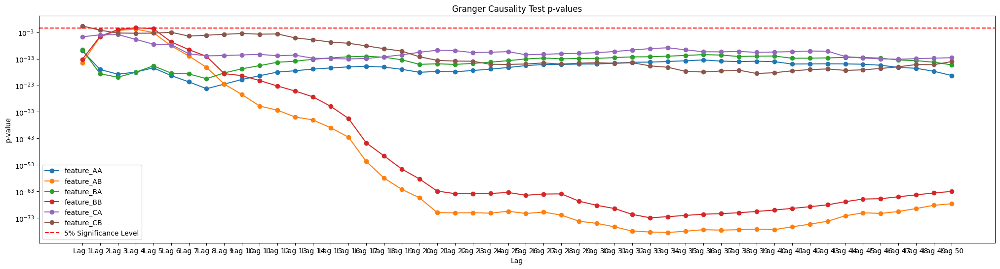

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss, acf, grangercausalitytests

def granger_causality(data, features, target, max_lag=5):
    results = {}
    for feature in features:
        print(f"\nGranger Causality Test: {feature} -> {target}")
        granger_test = grangercausalitytests(data[[feature, target]].dropna(), maxlag=max_lag, verbose=False)

        # p para cada lag
        p_values = [granger_test[i+1][0]['ssr_ftest'][1] for i in range(max_lag)]
        results[feature] = p_values

    return pd.DataFrame(results, index=[f'Lag {i+1}' for i in range(max_lag)])

def plot_granger_results(granger_results):
    plt.figure(figsize=(25, 6))
    for feature in granger_results.columns:
        plt.plot(granger_results.index, granger_results[feature], marker='o', label=feature)

    plt.axhline(y=0.05, color='r', linestyle='--', label='5% Significance Level')
    plt.title('Granger Causality Test p-values')
    plt.xlabel('Lag')
    plt.ylabel('p-value')
    plt.legend()
    plt.yscale('log')
    plt.show()

def analyze_granger_causality(data, features, target, max_lag=5):
    granger_results = granger_causality(data, features, target, max_lag)
    plot_granger_results(granger_results)
    return granger_results


granger_results = analyze_granger_causality(train, initial_features, 'Temperature', max_lag=50)

**Conclusión**: Las variables AB y BB muestran causalidad de Granger significativa con la temperatura en varios lags, en línea con el análisis de correlación cruzada. Los lags de hasta 4 pasos atrás (es decir, la última hora) contienen información útil para predecir la temperatura en los próximos 15 minutos.



Se eligen lags pasados como nuevas features para cada feature inicial. *lag_96 es un día, lag_21 son 5 horas.*

In [ ]:
selected_lags = {
    'feature_AA': [1, 3, 5, 8, 96],
    'feature_AB': [1, 3, 5, 21, 96],
    'feature_BA': [1, 3, 5, 8, 96],
    'feature_BB': [1, 3, 5, 21, 96],
    'feature_CA': [1, 3, 5, 36, 96],
    'feature_CB': [1, 3, 5, 39, 96]
}

def create_lagged_features(df, features, lags):
    for feature in features:
        for lag in lags[feature]:
            df[f'{feature}_lag{lag}'] = df[feature].shift(lag)
    return df

train = create_lagged_features(train, selected_lags.keys(), selected_lags)
train = train.bfill()

train.head()

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,is_train,...,feature_CA_lag1,feature_CA_lag3,feature_CA_lag5,feature_CA_lag36,feature_CA_lag96,feature_CB_lag1,feature_CB_lag3,feature_CB_lag5,feature_CB_lag39,feature_CB_lag96
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000,1,...,4.203,4.203,4.203,4.203,4.203,1.340,1.340,1.34,1.34,1.34
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999,1,...,4.203,4.203,4.203,4.203,4.203,1.340,1.340,1.34,1.34,1.34
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000,1,...,4.264,4.203,4.203,4.203,4.203,1.401,1.340,1.34,1.34,1.34
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000,1,...,4.234,4.203,4.203,4.203,4.203,1.310,1.340,1.34,1.34,1.34
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001,1,...,4.234,4.264,4.203,4.203,4.203,1.310,1.401,1.34,1.34,1.34


In [ ]:
features = [col for col in train.columns if 'feature' in col]

In [ ]:
def sma(source, length):
    return source.rolling(window=length, min_periods=1).mean().astype('float32')

def ema(source, length):
    return source.ewm(span=length, adjust=False).mean().astype('float32')

def dema(source, length):
    return 2 * ema(source, length) - ema(ema(source, length), length).astype('float32')

def rma(source, length):
    return source.ewm(alpha=1/length, adjust=False).mean().astype('float32')

def selector(source, length, ma_type, column='Temperature'):
    if ma_type == 'sma':
        return sma(source[column], length)
    elif ma_type == 'ema':
        return ema(source[column], length)
    elif ma_type == 'dema':
        return dema(source[column], length)
    elif ma_type == 'rma':
        return rma(source[column], length)
    else:
        raise ValueError('Invalid moving average type')

In [ ]:
def calculate_rolling_stats(data, column, window, ma_type='sma'):
    stats_df = pd.DataFrame(index=data.index)

    # Basic statistics
    stats_df[f'{column}_MA'] = selector(data, length=window, ma_type=ma_type, column=column)
    stats_df[f'{column}_Std'] = data[column].rolling(window=window).std()
    stats_df[f'{column}_Min'] = data[column].rolling(window=window).min()
    stats_df[f'{column}_Max'] = data[column].rolling(window=window).max()
    stats_df[f'{column}_Var'] = data[column].rolling(window=window).var()
    stats_df[f'{column}_IQR'] = data[column].rolling(window=window).quantile(0.75) - data[column].rolling(window=window).quantile(0.25)
    stats_df[f'{column}_Range'] = data[column].rolling(window=window).max() - data[column].rolling(window=window).min()

    # Trend statistics
    stats_df[f'{column}_Detrended'] = stats_df[f'{column}_MA'] - data[column]
    stats_df[f'{column}_Pct_Change'] = data[column].pct_change()

    # Variability indicators
    stats_df[f'{column}_CV'] = stats_df[f'{column}_Std'] / stats_df[f'{column}_MA']
    stats_df[f'{column}_Skew'] = data[column].rolling(window=window).skew()
    stats_df[f'{column}_Kurt'] = data[column].rolling(window=window).kurt()

    # Cyclical indicators
    stats_df[f'{column}_AutoCorr'] = data[column].rolling(window=window).apply(lambda x: x.autocorr(lag=1))
    stats_df[f'{column}_AutoCorr_Day'] = data[column].rolling(window=window).apply(lambda x: x.autocorr(lag=96))

    return stats_df

def calculate_rolling_autocorrelation(data, column, window, lag):
    def rolling_acf(x, lag):
        if len(x) < lag + 1:
            return np.nan
        return acf(x, nlags=lag)[-1]

    return data[column].rolling(window=window).apply(lambda x: rolling_acf(x, lag))

def comprehensive_feature_engineering(data, column, window, lag, ma_type='sma'):
    stats_df = calculate_rolling_stats(data, column, window, ma_type)
    stats_df[f'{column}_{lag}_RollingAutocorr'] = calculate_rolling_autocorrelation(data, column, window, lag)
    return pd.concat([data, stats_df], axis=1)

def engineer_features_for_all_columns(data, columns, window, lag, ma_type='sma'):
    for column in columns:
        data = comprehensive_feature_engineering(data, column, window, lag, ma_type)
    return data

In [ ]:
window = 672
seasonal_period = 96
ma_type = 'ema'

use_log = False
plot_decomposition = True

In [ ]:
train = engineer_features_for_all_columns(train, initial_features, window=window, lag=1, ma_type=ma_type)

train = train.interpolate(method='linear').ffill().bfill()

#### **Seasonal-Trend decomposition using LOESS (STL)**

Se aplican 2 tests:

- ADF (Augmented Dickey-Fuller): si p < 0.05 → estacionaria.
- KPSS: si p > 0.05 → estacionaria

Si la serie es no estacionaria, se aplica diferenciación de orden 1 para eliminar tendencias.

*Se aplica una ventana de 1 semana día para calcular tendencias semanales*
*Se aplica un periodo estacional de 1 día*

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from scipy.stats import probplot


def initial_preprocessing(data, column, deflation_data=None, use_log=True):
    if deflation_data is not None:
        common_index = data.index.union(deflation_data.index)
        data = data.reindex(common_index)
        deflation_data = deflation_data.reindex(common_index)
        data[f'Deflated_{column}'] = data[column] / deflation_data[column]
    else:
        data[f'Deflated_{column}'] = data[column]

    data[f'Deflated_{column}'] = data[f'Deflated_{column}'].replace([np.inf, -np.inf], np.nan)

    if use_log:
        min_value = data[f'Deflated_{column}'].min()
        if min_value <= 0:
            data[f'Log_{column}'] = np.log(data[f'Deflated_{column}'] - min_value + 1)
        else:
            data[f'Log_{column}'] = np.log(data[f'Deflated_{column}'])
        transformed_column = f'Log_{column}'
    else:
        transformed_column = f'Deflated_{column}'

    data[f'Scaled_{transformed_column}'] = (data[transformed_column] - data[transformed_column].mean()) / data[transformed_column].std()

    # Handle missing values
    data[f'Scaled_{transformed_column}'] = data[f'Scaled_{transformed_column}'].interpolate(method='linear').ffill().bfill()

    return data, f'Scaled_{transformed_column}'


def stationarity_analysis(data, column):
    series = data[column].dropna()

    adf_result = adfuller(series)
    adf_stat, adf_p = adf_result[0], adf_result[1]

    kpss_result = kpss(series, regression='c', nlags='auto')
    kpss_stat, kpss_p = kpss_result[0], kpss_result[1]

    print(f'ADF Statistic: {adf_stat}, p-value: {adf_p}')
    print(f'KPSS Statistic: {kpss_stat}, p-value: {kpss_p}')

    if adf_p < 0.05 and kpss_p >= 0.05:
        print("Serie Estacionaria.")
        return True
    elif adf_p >= 0.05 and kpss_p < 0.05:
        print("No estacionaria.")
        return False
    else:
        print("Conflicto")
        return False


def difference_series(data, column, order=1):
    return data[column].diff(order).dropna()


def seasonal_decomposition(data, column, window=672, seasonal=96, ma_type='sma'):
    trend = selector(data, length=window, ma_type=ma_type, column=column)
    trend = trend.reindex(data.index)
    detrended = data[column] - trend
    stl = STL(detrended.dropna(), period=seasonal, robust=True)
    result = stl.fit()
    seasonal = result.seasonal
    residual = result.resid
    seasonal = seasonal.reindex(data.index).fillna(0)
    residual = residual.reindex(data.index).fillna(0)
    decomposition = pd.DataFrame({
        f'{column}_Original': data[column],
        f'{column}_Trend': trend,
        f'{column}_Seasonal': seasonal,
        f'{column}_Residual': residual
    })

    return decomposition



def main_analysis(data, column, deflation_data=None, use_log=True, window=13, seasonal_period=12, ma_type='sma'):
    data, scaled_column = initial_preprocessing(data, column, deflation_data, use_log)

    # stationarity tests
    is_stationary = stationarity_analysis(data, scaled_column)

    # differencing
    if not is_stationary:
        print("\nPerforming first-order differencing due to non-stationarity.")
        data[f'{column}_Differenced'] = difference_series(data, scaled_column)
        is_stationary = stationarity_analysis(data, f'{column}_Differenced')
        if is_stationary:
            scaled_column = f'{column}_Differenced'
        else:
            print("Data remains non-stationary after first-order differencing. Consider further analysis.")

    # seasonal decomposition
    seasonal_decomp = seasonal_decomposition(data, scaled_column, window, seasonal=seasonal_period, ma_type=ma_type)


    return seasonal_decomp


seasonal_decompositions = {}

for feature in initial_features:
    seasonal_decomp = main_analysis(train, feature, use_log=False, window=672, seasonal_period=96, ma_type="ema")
    if seasonal_decomp is not None:
        seasonal_decompositions[feature] = seasonal_decomp


seasonal_decompositions_df = pd.concat(seasonal_decompositions.values(), axis=1)

train = pd.concat([train, seasonal_decompositions_df], axis=1)
train.head()

C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -26.281987203336335, p-value: 0.0
KPSS Statistic: 7.211076006134137, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -64.97905848902283, p-value: 0.0
KPSS Statistic: 0.0020263276076530157, p-value: 0.1
Serie Estacionaria.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -11.996209512441292, p-value: 3.4293094739672665e-22
KPSS Statistic: 4.058702251467604, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -50.253698665827166, p-value: 0.0
KPSS Statistic: 0.0007680623440520029, p-value: 0.1
Serie Estacionaria.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -26.814054279471918, p-value: 0.0
KPSS Statistic: 9.879915645551378, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -64.83480628033635, p-value: 0.0
KPSS Statistic: 0.0014344783919403525, p-value: 0.1
Serie Estacionaria.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -11.668707414784413, p-value: 1.8571037276814038e-21
KPSS Statistic: 3.058331765156156, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -48.89300005377449, p-value: 0.0
KPSS Statistic: 0.0008746618398612108, p-value: 0.1
Serie Estacionaria.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -16.582828847413765, p-value: 1.8277171693444587e-29
KPSS Statistic: 3.6200927101386893, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -50.21966164357755, p-value: 0.0
KPSS Statistic: 0.0036680419993833048, p-value: 0.1
Serie Estacionaria.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -7.153012886669249, p-value: 3.1057912400471804e-10
KPSS Statistic: 2.67665221738426, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.


C:\Users\jorge\AppData\Local\Temp\ipykernel_12832\2122817562.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_result = kpss(series, regression='c', nlags='auto')


ADF Statistic: -52.70029444106819, p-value: 0.0
KPSS Statistic: 0.009759760194652791, p-value: 0.1
Serie Estacionaria.


,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,is_train,...,feature_BB_Differenced_Seasonal,feature_BB_Differenced_Residual,feature_CA_Differenced_Original,feature_CA_Differenced_Trend,feature_CA_Differenced_Seasonal,feature_CA_Differenced_Residual,feature_CB_Differenced_Original,feature_CB_Differenced_Trend,feature_CB_Differenced_Seasonal,feature_CB_Differenced_Residual
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000,1,...,0.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN,0.000000,0.000000
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999,1,...,0.056896,-0.067770,0.051964,0.051964,0.010870,0.029139,0.102357,0.102357,0.045874,0.041345
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000,1,...,-0.005034,-0.005278,-0.025556,0.051733,-0.025915,-0.011377,-0.152696,0.101599,-0.140618,-0.026481
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000,1,...,0.022162,0.006348,0.000000,0.051580,-0.036038,0.024443,0.000000,0.101297,-0.011527,-0.002598
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001,1,...,-0.024074,0.033067,-0.078372,0.051194,-0.026155,-0.063438,0.102357,0.101300,0.059924,0.028282


#### **Transformada de Fourier Rápida** - FFT

Este bloque extrae componentes periódicos dominantes de la serie temporal de temperatura (Temperature) utilizando la Transformada Rápida de Fourier (FFT)

In [ ]:
from scipy.fft import fft

def create_fourier_features(df, date_column, target_column, num_components=10):
    df[date_column] = pd.to_datetime(df[date_column])

    df = df.sort_values(date_column)

    time_diff = (df[date_column] - df[date_column].min()).dt.total_seconds() / (24 * 60 * 60)

    fft_result = fft(df[target_column].values)

    power_spectrum = np.abs(fft_result)**2

    top_indices = np.argsort(power_spectrum)[::-1][:num_components]

    for i, idx in enumerate(top_indices):
        if idx == 0:
            continue
        period = len(df) / idx
        df[f'feature_fourier_sin_{i+1}'] = np.sin(2 * np.pi * time_diff / period)
        df[f'feature_fourier_cos_{i+1}'] = np.cos(2 * np.pi * time_diff / period)

    return df

train = create_fourier_features(train, 'date', 'Temperature', num_components=10)
train.head()

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,is_train,...,feature_fourier_sin_6,feature_fourier_cos_6,feature_fourier_sin_7,feature_fourier_cos_7,feature_fourier_sin_8,feature_fourier_cos_8,feature_fourier_sin_9,feature_fourier_cos_9,feature_fourier_sin_10,feature_fourier_cos_10
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000,1,...,0.000000,1.0,0.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000,1.000000
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999,1,...,0.000003,1.0,0.065400,0.997859,0.000005,1.0,0.065399,0.997859,0.065400,0.997859
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000,1,...,0.000005,1.0,0.130521,0.991446,0.000009,1.0,0.130517,0.991446,0.130519,0.991446
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000,1,...,0.000008,1.0,0.195082,0.980787,0.000014,1.0,0.195077,0.980788,0.195080,0.980787
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001,1,...,0.000011,1.0,0.258809,0.965929,0.000018,1.0,0.258802,0.965931,0.258805,0.965930


#### **Análisis de Anomalías**
Se busca clasificar cada timestamp de cada feature en normal o anomalía.

Se aplican dos métodos de detección de anomalías: Isolation Forest y Local Outlier Factor (LOF)

Detected 713 anomalies using Isolation Forest


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


Detected 594 anomalies using Local Outlier Factor


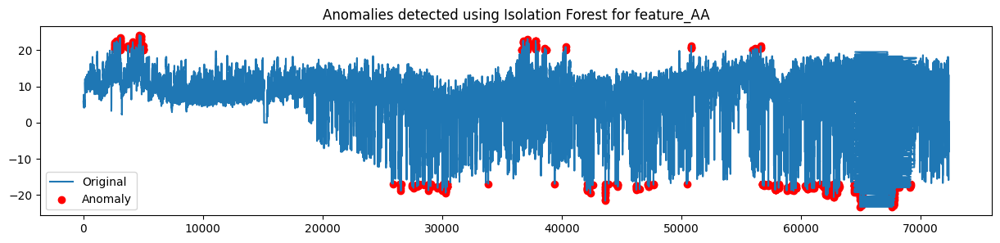

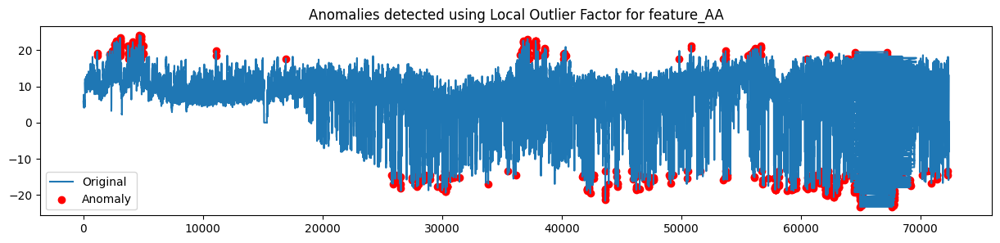

Detected 686 anomalies using Isolation Forest


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


Detected 209 anomalies using Local Outlier Factor


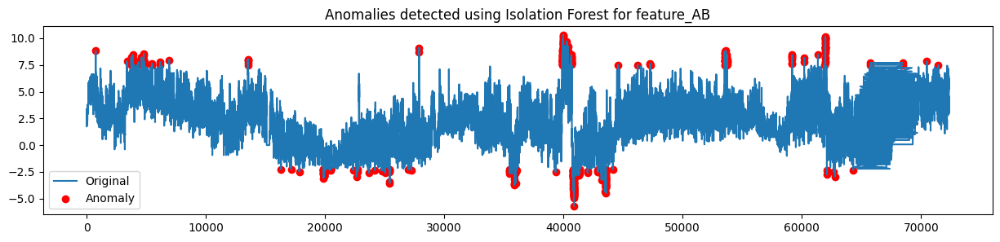

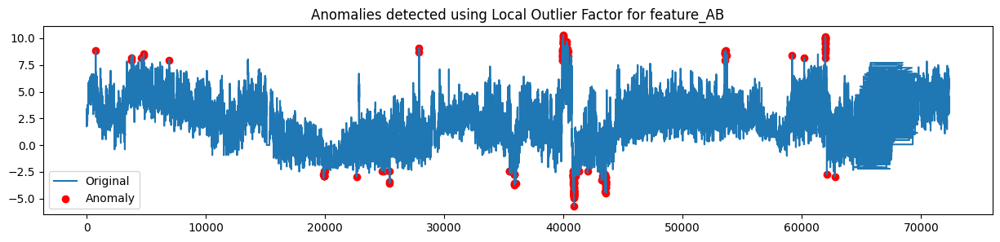

Detected 717 anomalies using Isolation Forest


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


Detected 638 anomalies using Local Outlier Factor


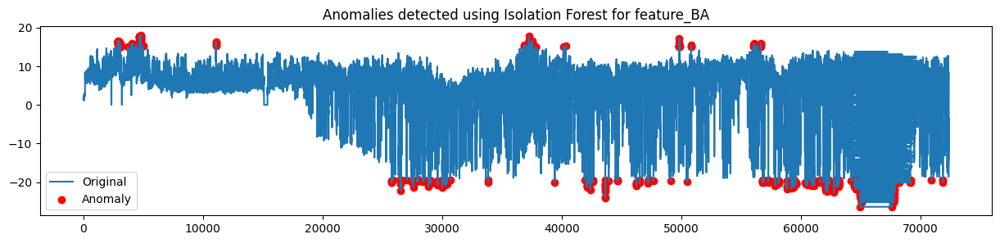

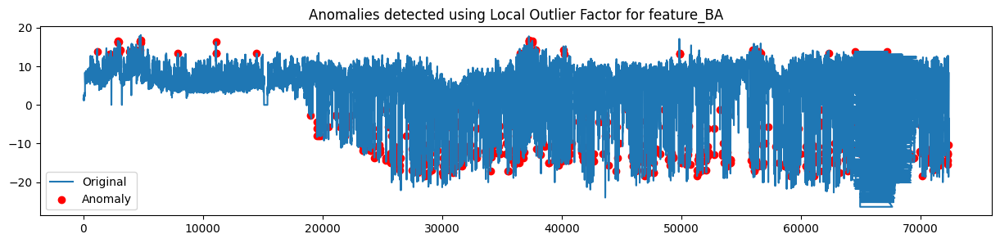

Detected 699 anomalies using Isolation Forest


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


Detected 374 anomalies using Local Outlier Factor


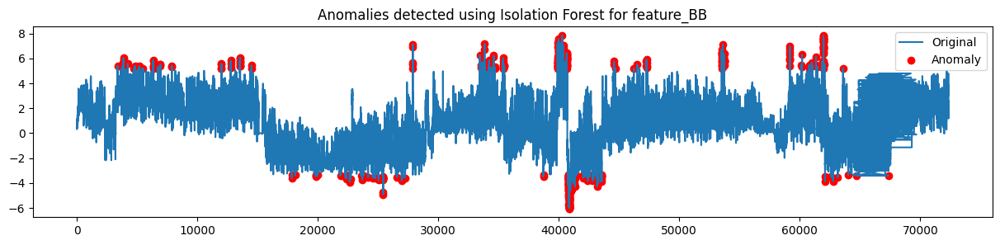

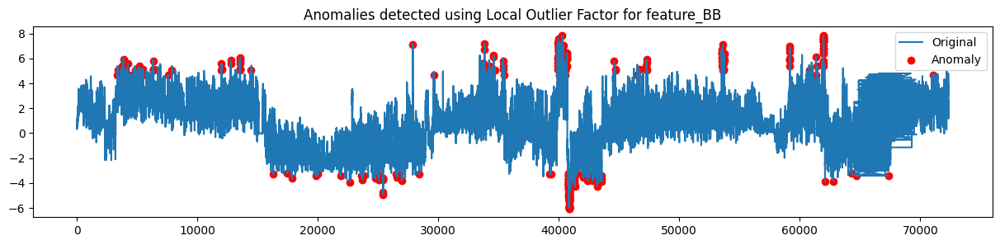

Detected 617 anomalies using Isolation Forest


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


Detected 235 anomalies using Local Outlier Factor


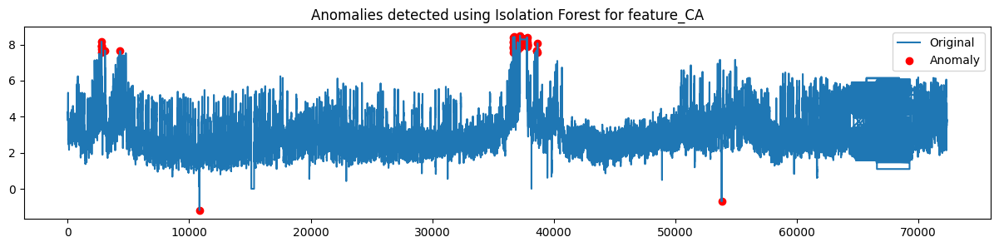

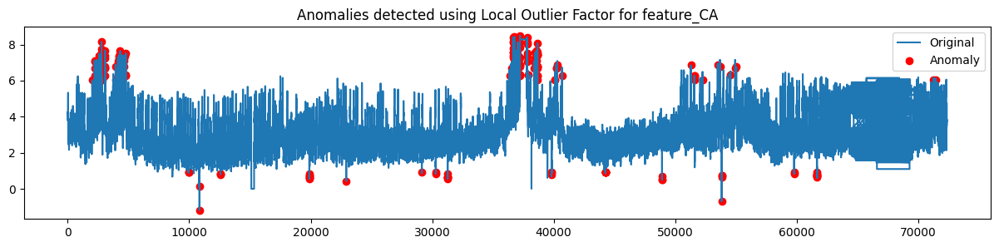

Detected 634 anomalies using Isolation Forest


j:\anaconda3\envs\TimeSeries311\Lib\site-packages\sklearn\neighbors\_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


Detected 75 anomalies using Local Outlier Factor


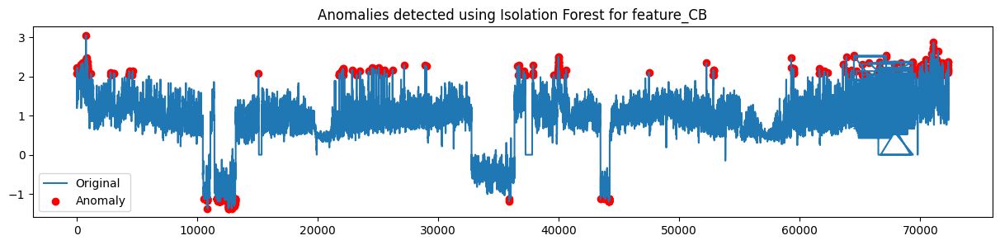

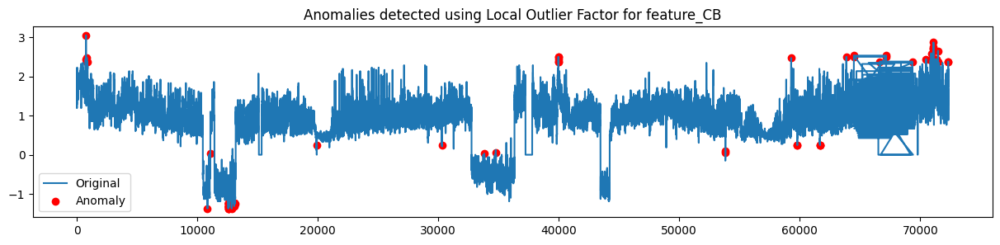

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,is_train,...,feature_AB_IF_Anomaly,feature_AB_LOF_Anomaly,feature_BA_IF_Anomaly,feature_BA_LOF_Anomaly,feature_BB_IF_Anomaly,feature_BB_LOF_Anomaly,feature_CA_IF_Anomaly,feature_CA_LOF_Anomaly,feature_CB_IF_Anomaly,feature_CB_LOF_Anomaly
0,0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000,1,...,False,False,False,False,False,False,False,False,False,False
1,1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999,1,...,False,False,False,False,False,False,False,False,False,False
2,2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000,1,...,False,False,False,False,False,False,False,False,False,False
3,3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000,1,...,False,False,False,False,False,False,False,False,False,False
4,4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001,1,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor


def detect_anomalies_isolation_forest(data, column, contamination=0.01):
    clf = IsolationForest(contamination=contamination, random_state=42)
    anomalies = clf.fit_predict(data[[column]])
    print(f"Detected {sum(anomalies == -1)} anomalies using Isolation Forest")
    return anomalies == -1

def detect_anomalies_lof(data, column, n_neighbors=20, contamination=0.01):
    clf = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
    anomalies = clf.fit_predict(data[[column]])
    print(f"Detected {sum(anomalies == -1)} anomalies using Local Outlier Factor")
    return anomalies == -1

def plot_anomalies(data, column, anomalies, method):
    plt.figure(figsize=(15, 3))
    plt.plot(data.index, data[column], label='Original')
    plt.scatter(data.index[anomalies], data.loc[anomalies, column], color='red', label='Anomaly')
    plt.title(f'Anomalies detected using {method} for {column}')
    plt.legend()
    plt.show()

def analyze_anomalies(data, column, plot=True):
    if_anomalies = detect_anomalies_isolation_forest(data, column)
    lof_anomalies = detect_anomalies_lof(data, column)

    if plot:
        plot_anomalies(data, column, if_anomalies, 'Isolation Forest')
        plot_anomalies(data, column, lof_anomalies, 'Local Outlier Factor')

    return pd.DataFrame({
        f'{column}_IF_Anomaly': if_anomalies,
        f'{column}_LOF_Anomaly': lof_anomalies
    }, index=data.index)

def analyze_all_features_anomalies(data, features):
    anomaly_results = {}
    for feature in features:
        anomaly_results[feature] = analyze_anomalies(data, feature, plot=True)

    combined_results = pd.concat(anomaly_results.values(), axis=1)

    return combined_results


anomaly_df = analyze_all_features_anomalies(train, initial_features)
train = pd.concat([train, anomaly_df], axis=1)
train.head()

#### **Mutual Information. Preprocesado final**

Se analiza la mutual information entre las nuevas features y la variable predicha "Temperature". El objetivo es analizar qué variables son las más importantes/aportan más información a la temperatura.

La información mutua (Mutual Information, MI) mide cuánta información obtiene una variable sobre otra. Es ampliamente usada para selección de variables, ya que puede captar relaciones no lineales entre una variable predictora y la variable objetivo.


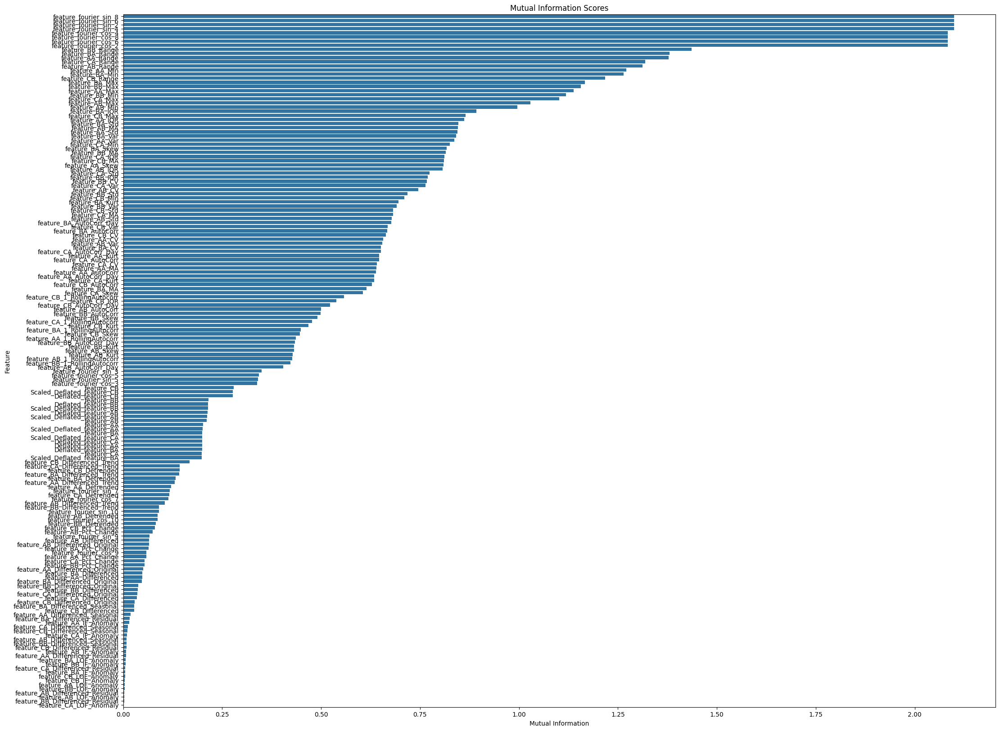

,Feature,Mutual Information
150,feature_fourier_sin_8,2.099296
146,feature_fourier_sin_6,2.099062
138,feature_fourier_sin_2,2.099012
142,feature_fourier_sin_4,2.098924
143,feature_fourier_cos_4,2.084006


In [ ]:
from sklearn.feature_selection import mutual_info_regression

def prepare_for_mi(df, features):
    df_prepared = df[features].copy()

    for col in df_prepared.columns:
        if df_prepared[col].dtype == 'object' or df_prepared[col].dtype.name == 'category':
            df_prepared[col] = pd.Categorical(df_prepared[col]).codes
        elif df_prepared[col].dtype == 'bool':
            df_prepared[col] = df_prepared[col].astype(int)

    return df_prepared

def mutual_information_scores(data, features, target):
    # Prepare data
    data_prepared = prepare_for_mi(data, features)

    mi_scores = mutual_info_regression(data_prepared, data[target])
    mi_df = pd.DataFrame({'Feature': features, 'Mutual Information': mi_scores})
    mi_df = mi_df.sort_values('Mutual Information', ascending=False)

    plt.figure(figsize=(25, 20))
    sns.barplot(x='Mutual Information', y='Feature', data=mi_df)
    plt.title('Mutual Information Scores')
    plt.show()

    return mi_df


features = [col for col in train.columns if 'feature' in col]

train = train.replace([np.inf, -np.inf], np.nan)
train = train.ffill().bfill()

# mutual information scores
mi_df = mutual_information_scores(train, features, 'Temperature')

mi_df.head()

### **Modelo LightGBD**

In [ ]:
test = train[train['is_train'] == 0]
train = train[train['is_train'] == 1]

test['Temperature'] = np.nan
test = test.drop('is_train', axis=1)
train = train.drop('is_train', axis=1)
test

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,feature_AA_MA,...,feature_AB_IF_Anomaly,feature_AB_LOF_Anomaly,feature_BA_IF_Anomaly,feature_BA_LOF_Anomaly,feature_BB_IF_Anomaly,feature_BB_LOF_Anomaly,feature_CA_IF_Anomaly,feature_CA_LOF_Anomaly,feature_CB_IF_Anomaly,feature_CB_LOF_Anomaly
67008,64320,2018-05-02 00:00:00,14.133,2.076,9.346,-0.036,4.538,1.279,NaN,7.406843,...,False,False,False,False,False,False,False,False,False,False
67009,64321,2018-05-02 00:15:00,12.123,1.541,7.818,-0.746,4.538,1.249,NaN,7.420858,...,False,False,False,False,False,False,False,False,False,False
67010,64322,2018-05-02 00:30:00,12.525,1.741,8.209,-0.284,4.477,1.279,NaN,7.436027,...,False,False,False,False,False,False,False,False,False,False
67011,64323,2018-05-02 00:45:00,12.324,1.942,7.747,0.249,4.630,1.371,NaN,7.450553,...,False,False,False,False,False,False,False,False,False,False
67012,64324,2018-05-02 01:00:00,14.602,1.407,9.630,-0.320,4.477,1.310,NaN,7.471805,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72363,69675,2018-06-26 18:45:00,9.310,3.550,5.437,1.670,3.868,1.462,NaN,5.793924,...,False,False,False,False,False,False,False,False,False,False
72364,69676,2018-06-26 19:00:00,10.114,3.550,6.183,1.564,3.716,1.462,NaN,5.806762,...,False,False,False,False,False,False,False,False,False,False
72365,69677,2018-06-26 19:15:00,10.784,3.349,7.000,1.635,3.746,1.432,NaN,5.821554,...,False,False,False,False,False,False,False,False,False,False
72366,69678,2018-06-26 19:30:00,11.655,3.617,7.533,1.706,4.173,1.523,NaN,5.838889,...,False,False,False,False,False,False,False,False,False,False


Starting prediction process...
Validating data...

Checking train data:
Shape: (67008, 171)

Missing values:
feature_AA                0
feature_AB                0
feature_BA                0
feature_BB                0
feature_CA                0
                         ..
feature_BB_LOF_Anomaly    0
feature_CA_IF_Anomaly     0
feature_CA_LOF_Anomaly    0
feature_CB_IF_Anomaly     0
feature_CB_LOF_Anomaly    0
Length: 168, dtype: int64

Data types:
feature_AA                float64
feature_AB                float64
feature_BA                float64
feature_BB                float64
feature_CA                float64
                           ...   
feature_BB_LOF_Anomaly       bool
feature_CA_IF_Anomaly        bool
feature_CA_LOF_Anomaly       bool
feature_CB_IF_Anomaly        bool
feature_CB_LOF_Anomaly       bool
Length: 168, dtype: object

Checking test data:
Shape: (5360, 171)

Missing values:
feature_AA                0
feature_AB                0
feature_BA                0
fe

Predicting quantiles: 100%|██████████| 21/21 [00:00<00:00, 2626.68it/s]


Submission saved.
Optimizing hyperparameters...
Fitting the model...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37257
[LightGBM] [Info] Number of data points in the train set: 42884, number of used features: 168
[LightGBM] [Info] Start training from score 15.174528
Calibrating the model...

Feature importances:
     Value                          Feature
0        0              Deflated_feature_AA
1        0              Deflated_feature_AB
2        0              Deflated_feature_BA
3        0              Deflated_feature_BB
4        0              Deflated_feature_CA
..     ...                              ...
163  23786  feature_BB_Differenced_Seasonal
164  23917  feature_AB_Differenced_Seasonal
165  24506  feature_CB_Differenced_Residual
166  25149  feature_CA_Differenced_Residual
167  25486  feature_CB_Differenced_Seasonal

[168 rows 

Predicting quantiles: 100%|██████████| 21/21 [00:00<00:00, 2626.83it/s]


Making predictions...


Predicting quantiles: 100%|██████████| 21/21 [00:00<00:00, 3502.20it/s]



Validation CRPS Score: 3.1443811551929652


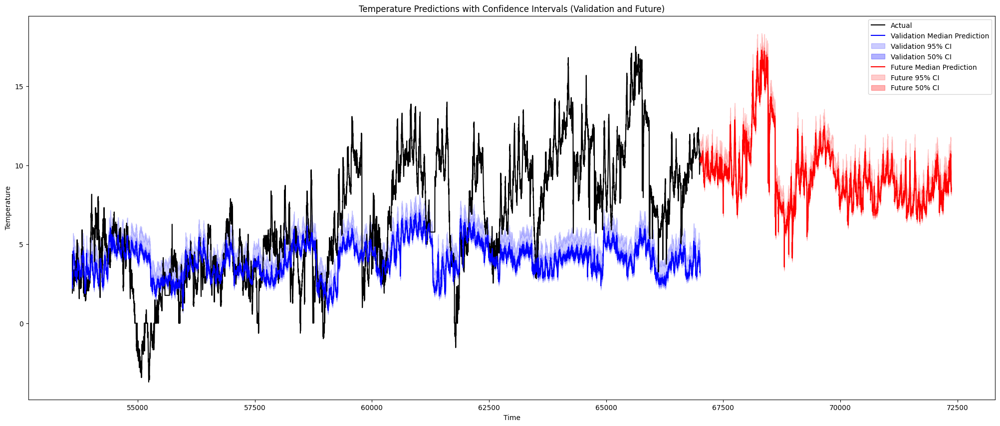

In [ ]:
import lightgbm as lgb
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import train_test_split
from tqdm import tqdm

class CustomConformalPredictor(BaseEstimator, RegressorMixin):
    def __init__(self, params=None, study_name="temperature_prediction_study"):
        self.params = params or {}
        self.quantiles = [0.025, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50,
                          0.55, 0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95, 0.975]
        self.model = None
        self.calibration_scores = None
        self.study_name = study_name

    def fit(self, X, y):
        print("Optimizing hyperparameters...")
        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

        best_params = {
                        'n_estimators': 4572,
                        'learning_rate': 0.015668481265365637,
                        'num_leaves': 295,
                        'max_depth': 84,
                        'min_child_samples': 10,
                        'subsample': 0.5567552981171613,
                        'objective': 'regression',
                        'metric': 'mse'
        }

        print("Fitting the model...")
        self.model = lgb.LGBMRegressor(**best_params)
        self.model.fit(X_train, y_train)

        print("Calibrating the model...")
        calib_preds = self.model.predict(X_val)
        self.calibration_scores = np.abs(calib_preds - y_val)

        importances = self.model.feature_importances_
        feature_imp = pd.DataFrame(sorted(zip(importances, X.columns)), columns=['Value','Feature'])
        print("\nFeature importances:")
        print(feature_imp)

        return self

    def predict(self, X):
        print("Making predictions...")
        point_predictions = self.model.predict(X)

        quantile_predictions = []
        for q in tqdm(self.quantiles, desc="Predicting quantiles"):
            quantile = np.percentile(self.calibration_scores, q * 100)
            quantile_predictions.append(point_predictions + quantile)

        return np.array(quantile_predictions).T


def predict_temperature_quantiles(train_data, test_data, features, target='Temperature', params=None):

    # Data validation
    print("Validating data...")
    for df, name in [(train_data, "train"), (test_data, "test")]:
        print(f"\nChecking {name} data:")
        print(f"Shape: {df.shape}")
        print("\nMissing values:")
        print(df[features].isnull().sum())
        print("\nData types:")
        print(df[features].dtypes)

    predictor = CustomConformalPredictor(params)
    predictor.fit(train_data[features], train_data[target])
    return predictor.predict(test_data[features])

def validate_and_visualize(train_data, test_data, features, target='Temperature', params=None):
    predictor = CustomConformalPredictor(params)
    X_train, X_val, y_train, y_val = train_test_split(train_data[features], train_data[target], test_size=0.2, shuffle=False)

    predictor.fit(X_train, y_train)

    # predictions validation set
    val_predictions = predictor.predict(X_val)

    # predictions test set
    test_predictions = predictor.predict(test_data[features])

    return val_predictions, test_predictions, X_val, y_val



try:
    predictor = CustomConformalPredictor()

    # --- Test predictions
    quantile_predictions = predict_temperature_quantiles(train, test, features)
    submission = pd.DataFrame(quantile_predictions,
                              columns=[0.025, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50,
                                       0.55, 0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95, 0.975])


    # --- with validation
    val_predictions, test_predictions, X_val, y_val = validate_and_visualize(train, test, features)


    val_submission = pd.DataFrame(val_predictions,
                                  columns=[0.025, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50,
                                           0.55, 0.60, 0.65, 0.70, 0.75, 0.80, 0.85, 0.90, 0.95, 0.975])
    val_submission.index = X_val.index

    # CRPS
    solution = pd.DataFrame({'Temperature': y_val})
    crps_score = us.crps(val_submission, solution)
    print(f"\nValidation CRPS Score: {crps_score}")

    # Plot
    plt.figure(figsize=(25, 10))

    plt.plot(X_val.index, y_val, label='Actual', color='black')
    plt.plot(val_submission.index, val_submission[0.5], label='Validation Median Prediction', color='blue')
    plt.fill_between(val_submission.index, val_submission[0.025], val_submission[0.975], color='blue', alpha=0.2, label='Validation 95% CI')
    plt.fill_between(val_submission.index, val_submission[0.25], val_submission[0.75], color='blue', alpha=0.3, label='Validation 50% CI')

    # Plot future predictions
    plt.plot(submission.index, submission[0.5], label='Future Median Prediction', color='red')
    plt.fill_between(submission.index, submission[0.025], submission[0.975], color='red', alpha=0.2, label='Future 95% CI')
    plt.fill_between(submission.index, submission[0.25], submission[0.75], color='red', alpha=0.3, label='Future 50% CI')

    plt.xlabel('Time')
    plt.ylabel('Temperature')
    plt.title('Temperature Predictions with Confidence Intervals (Validation and Future)')
    plt.legend()
    plt.show()

except Exception as e:
    print(f"An error occurred: {str(e)}")

## 4️⃣ **Cuarto Experimento.** Redes Neuronales Recurrentes
---
En este cuarto experimento, se usan las Redes Neuronales Recurrentes LSTM con una arquitectura simple.

In [73]:
# Data manipulation
import pandas as pd
import numpy as np
from numpy import array
from numpy import newaxis

# Data Split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize

# Neuronal Network API
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import *
from tensorflow.keras.regularizers import l2
from keras.models import load_model

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as mcolors

import os
import collections

import tensorflow as tf
import numpy as np


%matplotlib inline
print(plt.style.available)
plt.style.use('seaborn-v0_8')

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'petroff10', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


In [74]:
# conectar con drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Lectura**

In [88]:
def read_data():
  train = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/train.csv", sep=",")
  test = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/test.csv", sep=",")
  train_public  = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/train_and_Public.csv", sep=",")

  train['date'] = pd.to_datetime(train['date'])
  test['date'] = pd.to_datetime(test['date'])

  train.head()

  return train, test

In [89]:
from sklearn.preprocessing import MinMaxScaler

def normalize_data(df, features, target=None):
    df = df.copy()
    scaler = MinMaxScaler()

    df[features] = scaler.fit_transform(df[features])

    if target:
        target_scaler = MinMaxScaler()
        df[[target]] = target_scaler.fit_transform(df[[target]])
        return df, scaler, target_scaler  # Devolvemos ambos scalers
    else:
        return df, scaler, None


def zscore_normalize_data(df, features, target=None):
    df = df.copy()

    # Normalizar features
    feature_mean = df[features].mean()
    feature_std = df[features].std()
    df[features] = (df[features] - feature_mean) / feature_std

    # Normalizar target si se indica
    if target:
        target_mean = df[target].mean()
        target_std = df[target].std()
        df[target] = (df[target] - target_mean) / target_std

        return df, (feature_mean, feature_std), (target_mean, target_std)
    else:
        return df, (feature_mean, feature_std), None

### **Generación de datasets**
La siguiente celda de código genera las secuencias de entrenamiento y validación en base a:

- **df**: `pd.DataFrame`  
  DataFrame de entrada que contiene las series temporales con las columnas de características y la variable objetivo.

- **sequence_len**: `int`, por defecto `5`  
  Longitud de la secuencia pasada como entrada al modelo (número de pasos históricos utilizados para predecir el futuro).

- **n_steps_out**: `int`, por defecto `1`  
  Número de pasos futuros que el modelo intentará predecir.

- **future_steps**: `int`, por defecto `1`  
  Número de pasos hacia adelante en el tiempo que se deben saltar antes de comenzar la predicción.

- **stride**: `int`, por defecto `1`  
  Espaciado entre el inicio de cada secuencia de entrada en los datos. Controla la superposición entre muestras.

- **val_stride**: `int` o `None`, por defecto `None`  
  Espaciado entre secuencias en el conjunto de validación. Si es `None`, se usará el mismo valor que `stride`.

- **batch_size**: `int`, por defecto `32`  
  Tamaño del lote para los generadores de datos (ideal para entrenamiento en redes neuronales).

- **val_split**: `float`, por defecto `0.2`  
  Proporción de los datos reservados para validación (porcentaje entre 0 y 1).

- **feature_cols**: `list[str]` o `None`, por defecto `None`  
  Lista de nombres de columnas que se usarán como características. Si es `None`, se utilizarán todas excepto la columna objetivo.

- **target_col**: `str`, por defecto `"Temperature"`  
  Nombre de la columna que se desea predecir (columna objetivo).

In [77]:
import numpy as np
import tensorflow as tf

def prepare_datasets(
    df,
    sequence_len=5,
    n_steps_out=1,
    future_steps=1,
    stride=1,
    val_stride=1,
    batch_size=32,
    val_split=0.2,
    feature_cols=None,
    target_col="Temperature"
):
    if feature_cols is None:
        feature_cols = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']

    # === Preprocesamiento ===
    df_numeric = df.drop(columns=["id", "date"]).copy()
    data_all = df_numeric.values.astype(np.float32)

    target_index = df_numeric.columns.get_loc(target_col)
    feature_indices = [df_numeric.columns.get_loc(col) for col in feature_cols]

    # === Dividir los datos por tiempo (val_split al final) ===
    split_point = int(len(data_all) * (1 - val_split))
    data_train = data_all[:split_point]
    data_val = data_all[split_point:]

    # === Función para generar índices válidos ===
    def get_valid_indices(data_len, sequence_len, future_steps, n_steps_out, stride):
        indices = []
        for i in range(0, data_len - sequence_len - future_steps - n_steps_out + 1, stride):
            x_start = i
            x_end = i + sequence_len
            y_start = x_end + future_steps
            y_end = y_start + n_steps_out
            indices.append((x_start, x_end, y_start, y_end))
        return indices

    # === Índices separados para cada bloque ===
    train_indices = get_valid_indices(len(data_train), sequence_len, future_steps, n_steps_out, stride)
    val_indices = get_valid_indices(len(data_val), sequence_len, future_steps, n_steps_out, val_stride)

    # === Generador de secuencias ===
    def sequence_generator(data, indices, input_indices, target_index):
        for x_start, x_end, y_start, y_end in indices:
            x_seq = data[x_start:x_end][:, input_indices]
            y_seq = data[y_start:y_end, target_index]
            y_seq = np.expand_dims(y_seq, axis=-1)
            yield x_seq, y_seq

    # === Firma de salida para tf.data.Dataset ===
    output_signature = (
        tf.TensorSpec(shape=(sequence_len, len(feature_cols)), dtype=tf.float32),
        tf.TensorSpec(shape=(n_steps_out, 1), dtype=tf.float32),
    )

    # === Crear datasets ===
    train_dataset = tf.data.Dataset.from_generator(
        lambda: sequence_generator(data_train, train_indices, feature_indices, target_index),
        output_signature=output_signature
    ).shuffle(1000).batch(batch_size).repeat()

    val_dataset = tf.data.Dataset.from_generator(
        lambda: sequence_generator(data_val, val_indices, feature_indices, target_index),
        output_signature=output_signature
    ).batch(batch_size)

    return train_dataset, val_dataset, train_indices, val_indices, len(feature_cols)


### **Initial LSTM Experiments**
Se ejecutan una serie de experimentos iniciales con modelos LSTM, probando diferentes configuraciones de hiperparámetros (`stride, sequence_len`)

#### **1st Model**

In [121]:
sequence_len = 48
n_steps_out = 1
future_steps = 1
stride = 1
batch_size = 64
val_split = 0.2
val_stride=1

train, test = read_data()
feature_cols = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']
target_col = "Temperature"

train, zscore_stats, target_zscore_stats = zscore_normalize_data(train, feature_cols, target_col)

train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(
    train,
    sequence_len,
    n_steps_out,
    future_steps,
    stride,
    val_stride,
    batch_size,
    val_split
)

In [122]:
import tensorflow as tf
from tensorflow.keras import layers, models


n_features = features_size

n_steps_out = 1
target_col = "Temperature"


model = tf.keras.Sequential([
    layers.Input(shape=(sequence_len, n_features)),

    layers.LSTM(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),

    layers.Dense(32, activation='relu'),
    layers.Dense(n_steps_out)
])


model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss="mse",
    metrics=["mae"]
)

model.summary()


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_19 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

In [123]:
from tensorflow.keras.callbacks import EarlyStopping

# Callback de EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Entrenamiento
model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=1,
    steps_per_epoch=len(train_indices) // batch_size,
    validation_steps=len(val_indices) // batch_size,
    callbacks=[early_stopping]
)

803/803 ━━━━━━━━━━━━━━━━━━━━ 104s 120ms/step - loss: 0.3549 - mae: 0.4396 - val_loss: 0.1485 - val_mae: 0.2991


##### **Evaluación**

In [124]:
def zscore_denormalize(data, mean, std):
    return data * std + mean

In [125]:
target_mean, target_std = target_zscore_stats

In [126]:
all_y_true = []
all_y_pred = []

for x_batch, y_batch in val_dataset:
    y_pred = model.predict(x_batch, verbose=0)  # shape: (batch_size, 1)

    all_y_true.append(y_batch.numpy())          # (batch_size, 1, 1)
    all_y_pred.append(y_pred)                   # (batch_size, 1)


y_true = np.concatenate(all_y_true, axis=0)     # shape: (N, 1, 1)
y_pred = np.concatenate(all_y_pred, axis=0)     # shape: (N, 1)


y_true_flat = y_true.squeeze()  # de (N,1,1) a (N,)
y_pred_flat = y_pred.squeeze()  # de (N,1) a (N,)

y_pred_flat = zscore_denormalize(y_pred_flat, target_mean, target_std)
y_true_flat = zscore_denormalize(y_true_flat, target_mean, target_std)

In [127]:
print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

Target real (rango): -3.7280000473349464 16.812999842038835
Predicciones (rango): -0.028316857942856544 9.518645403257095


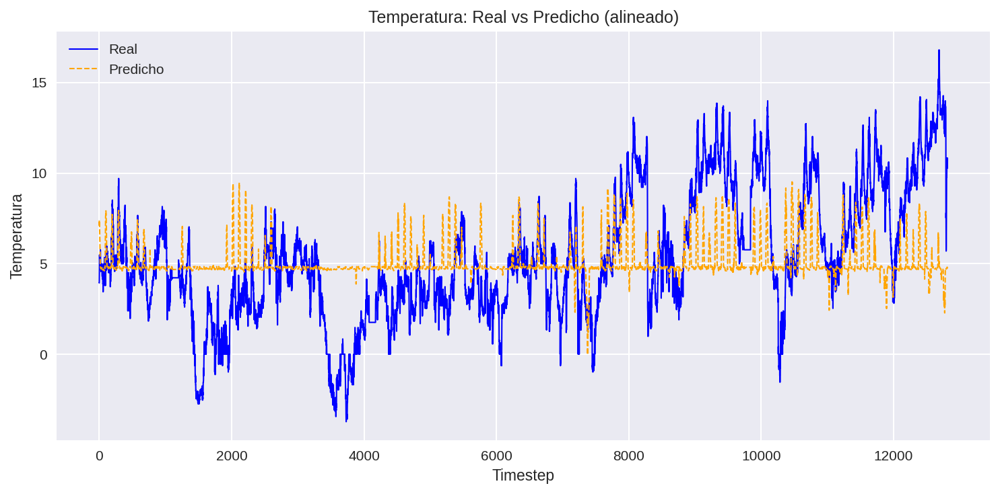

In [131]:
import numpy as np
import matplotlib.pyplot as plt

timesteps = np.arange(len(y_true_flat))
future_shift = sequence_len + future_steps  # desfase (no usado en la gráfica directamente)

plt.figure(figsize=(10, 5))

plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)

plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

plt.title('Temperatura: Real vs Predicho (alineado)')
plt.xlabel('Timestep')
plt.ylabel('Temperatura')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()


#### **2nd Model**

In [132]:
sequence_len = 48
n_steps_out = 1
future_steps = 1
stride = 48
batch_size = 64
val_split = 0.2

train, test = read_data()
train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(train, sequence_len, n_steps_out, future_steps, stride, 48, batch_size, val_split)

In [133]:
import tensorflow as tf
from tensorflow.keras import layers, models


n_features = features_size

n_steps_out = 1
target_col = "Temperature"


model = tf.keras.Sequential([
    layers.Input(shape=(sequence_len, n_features)),

    layers.LSTM(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),

    layers.Dense(32, activation='relu'),
    layers.Dense(n_steps_out)
])


model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss="mse",
    metrics=["mae"]
)

model.summary()


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_20 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

In [134]:
from tensorflow.keras.callbacks import EarlyStopping

# Callback de EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Entrenamiento
model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=1,
    steps_per_epoch=len(train_indices) // batch_size,
    validation_steps=len(val_indices) // batch_size,
    callbacks=[early_stopping]
)

16/16 ━━━━━━━━━━━━━━━━━━━━ 13s 295ms/step - loss: 312.0648 - mae: 15.8361 - val_loss: 26.6071 - val_mae: 4.2932


##### **Evaluación**

In [135]:
all_y_true = []
all_y_pred = []

for x_batch, y_batch in val_dataset:
    y_pred = model.predict(x_batch, verbose=0)  # shape: (batch_size, 1)

    all_y_true.append(y_batch.numpy())          # (batch_size, 1, 1)
    all_y_pred.append(y_pred)                   # (batch_size, 1)


y_true = np.concatenate(all_y_true, axis=0)     # shape: (N, 1, 1)
y_pred = np.concatenate(all_y_pred, axis=0)     # shape: (N, 1)


y_true_flat = y_true.squeeze()  # de (N,1,1) a (N,)
y_pred_flat = y_pred.squeeze()  # de (N,1) a (N,)


In [136]:
print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

Target real (rango): -3.588 14.14
Predicciones (rango): -0.9714848 5.9163556


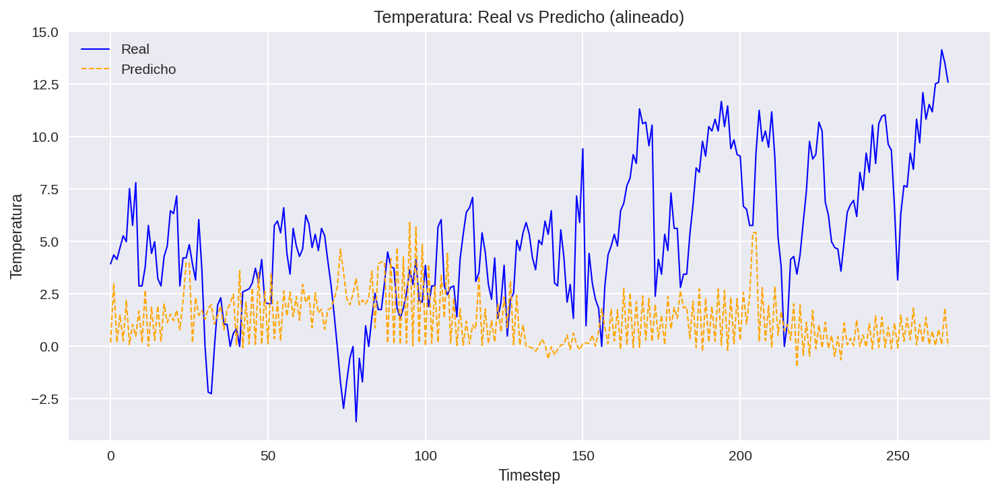

In [137]:
import numpy as np
import matplotlib.pyplot as plt

timesteps = np.arange(len(y_true_flat))
future_shift = sequence_len + future_steps  # desfase (no usado en la gráfica directamente)

plt.figure(figsize=(10, 5))

plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)

plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

plt.title('Temperatura: Real vs Predicho (alineado)')
plt.xlabel('Timestep')
plt.ylabel('Temperatura')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()


#### **3nd Model**

In [138]:
def normalize_data(df, features, target=None):
    df = df.copy()
    scaler = MinMaxScaler()

    df[features] = scaler.fit_transform(df[features])

    if target:
        target_scaler = MinMaxScaler()
        df[[target]] = target_scaler.fit_transform(df[[target]])
        return df, scaler, target_scaler  # Devolvemos ambos scalers
    else:
        return df, scaler, None


In [139]:
sequence_len = 48
n_steps_out = 1
future_steps = 1
stride = 48
batch_size = 64
val_split = 0.2

train, test = read_data()

# Normalize 0,1
initial_features = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']
train, scaler, _ = normalize_data(train, initial_features, target=None)

train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(train, sequence_len, n_steps_out, future_steps, stride, 48, batch_size, val_split, None)

In [140]:
import tensorflow as tf
from tensorflow.keras import layers, models


n_features = features_size

n_steps_out = 1
target_col = "Temperature"


model = tf.keras.Sequential([
    layers.Input(shape=(sequence_len, n_features)),

    layers.LSTM(128, activation='relu'),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),

    layers.Dense(32, activation='relu'),
    layers.Dense(n_steps_out)
])


model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss="mse",
    metrics=["mae"]
)

model.summary()


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_21 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

In [141]:
from tensorflow.keras.callbacks import EarlyStopping

# Callback de EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Entrenamiento
model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    steps_per_epoch=len(train_indices) // batch_size,
    validation_steps=len(val_indices) // batch_size,
    callbacks=[early_stopping]
)

Epoch 1/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - loss: 315.8795 - mae: 15.7091 - val_loss: 31.9560 - val_mae: 4.8684
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 296.5073 - mae: 15.1454 - val_loss: 29.7276 - val_mae: 4.6568
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 257.7208 - mae: 14.1487 - val_loss: 24.2848 - val_mae: 4.0784
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 242.1979 - mae: 13.6008 - val_loss: 22.6912 - val_mae: 3.8879
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 320ms/step - loss: 163.1645 - mae: 11.1184 - val_loss: 18.6348 - val_mae: 3.4035
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 127.0491 - mae: 9.7440 - val_loss: 17.8495 - val_mae: 3.4011
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 101.4885 - mae: 8.5336 - val_loss: 20.8330 - val_mae: 3.7664
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 76.3031 - mae: 7.2562 - val_loss: 25.5710 - val_mae: 4.1698
Epoch 9/10
16/16 ━━━━━━━━━━━

##### **Evaluación**

In [142]:
all_y_true = []
all_y_pred = []

for x_batch, y_batch in val_dataset:
    y_pred = model.predict(x_batch, verbose=0)  # shape: (batch_size, 1)

    all_y_true.append(y_batch.numpy())          # (batch_size, 1, 1)
    all_y_pred.append(y_pred)                   # (batch_size, 1)


y_true = np.concatenate(all_y_true, axis=0)     # shape: (N, 1, 1)
y_pred = np.concatenate(all_y_pred, axis=0)     # shape: (N, 1)


y_true_flat = y_true.squeeze()  # de (N,1,1) a (N,)
y_pred_flat = y_pred.squeeze()  # de (N,1) a (N,)

# y_pred_real = target_scaler.inverse_transform(y_pred_flat.reshape(-1, 1)).squeeze()
# y_true_real = target_scaler.inverse_transform(y_true_flat.reshape(-1, 1)).squeeze()

In [143]:
print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

Target real (rango): -3.588 14.14
Predicciones (rango): 0.23166893 8.570173


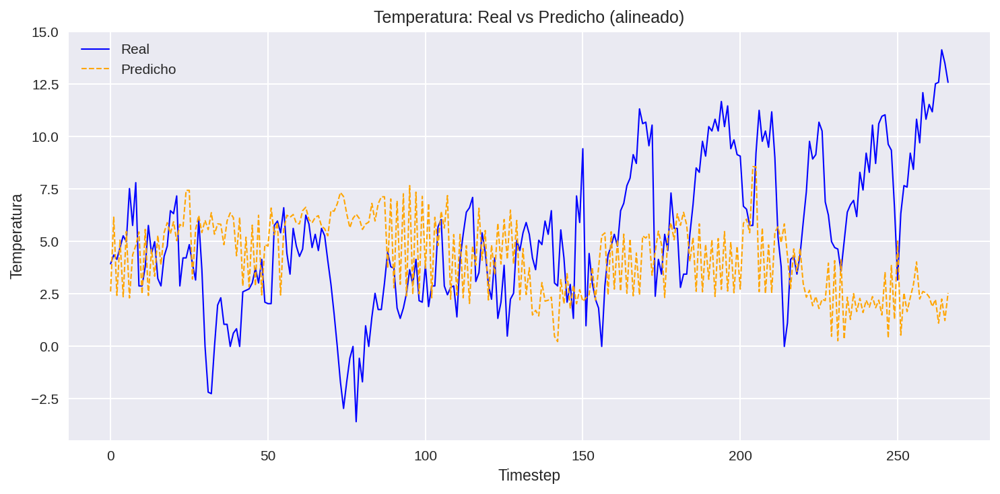

In [144]:
import numpy as np
import matplotlib.pyplot as plt

timesteps = np.arange(len(y_true_flat))
future_shift = sequence_len + future_steps  # desfase (no usado en la gráfica directamente)

plt.figure(figsize=(10, 5))

plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)

plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

plt.title('Temperatura: Real vs Predicho (alineado)')
plt.xlabel('Timestep')
plt.ylabel('Temperatura')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()


#### **4nd Model**

In [145]:
def normalize_data(df, features, target=None):
    df = df.copy()
    scaler = MinMaxScaler()

    df[features] = scaler.fit_transform(df[features])

    if target:
        target_scaler = MinMaxScaler()
        df[[target]] = target_scaler.fit_transform(df[[target]])
        return df, scaler, target_scaler  # Devolvemos ambos scalers
    else:
        return df, scaler, None


In [146]:
sequence_len = 48
n_steps_out = 1
future_steps = 1
stride = 48
batch_size = 64
val_split = 0.2

train, test = read_data()

# Normalize 0,1
initial_features = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']
train, scaler, _ = normalize_data(train, initial_features, target=None)

train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(train, sequence_len, n_steps_out, future_steps, stride, 48, batch_size, val_split, None)

In [147]:
import tensorflow as tf
from tensorflow.keras import layers, models


n_features = features_size

n_steps_out = 1
target_col = "Temperature"


model = tf.keras.Sequential([
    layers.Input(shape=(sequence_len, n_features)),

    layers.LSTM(128),
    layers.Dense(64),
    layers.Dropout(0.3),
    layers.BatchNormalization(),

    layers.Dense(32, activation='relu'),
    layers.Dense(n_steps_out)
])


model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss="mse",
    metrics=["mae"]
)

model.summary()


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_22 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

In [148]:
from tensorflow.keras.callbacks import EarlyStopping

# Callback de EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Entrenamiento
model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    steps_per_epoch=len(train_indices) // batch_size,
    validation_steps=len(val_indices) // batch_size,
    callbacks=[early_stopping]
)

Epoch 1/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 337.6390 - mae: 16.2236 - val_loss: 30.1964 - val_mae: 4.7183
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 236.8630 - mae: 13.2709 - val_loss: 11.7269 - val_mae: 2.7831
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - loss: 184.2111 - mae: 11.3429 - val_loss: 9.3833 - val_mae: 2.4895
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 165.2842 - mae: 10.0967 - val_loss: 31.5300 - val_mae: 4.6976
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 133.2511 - mae: 9.0044 - val_loss: 44.3485 - val_mae: 5.8722
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 155.6117 - mae: 9.9904 - val_loss: 60.7991 - val_mae: 6.9233
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 174ms/step - loss: 133.4888 - mae: 9.2015 - val_loss: 332.9382 - val_mae: 16.5461
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 330ms/step - loss: 136.7490 - mae: 9.0171 - val_loss: 517.5463 - val_mae: 22.5172


##### **Evaluación**

In [149]:
all_y_true = []
all_y_pred = []

for x_batch, y_batch in val_dataset:
    y_pred = model.predict(x_batch, verbose=0)  # shape: (batch_size, 1)

    all_y_true.append(y_batch.numpy())          # (batch_size, 1, 1)
    all_y_pred.append(y_pred)                   # (batch_size, 1)


y_true = np.concatenate(all_y_true, axis=0)     # shape: (N, 1, 1)
y_pred = np.concatenate(all_y_pred, axis=0)     # shape: (N, 1)


y_true_flat = y_true.squeeze()  # de (N,1,1) a (N,)
y_pred_flat = y_pred.squeeze()  # de (N,1) a (N,)

# y_pred_real = target_scaler.inverse_transform(y_pred_flat.reshape(-1, 1)).squeeze()
# y_true_real = target_scaler.inverse_transform(y_true_flat.reshape(-1, 1)).squeeze()

In [150]:
print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

Target real (rango): -3.588 14.14
Predicciones (rango): 1.8441923 9.095051


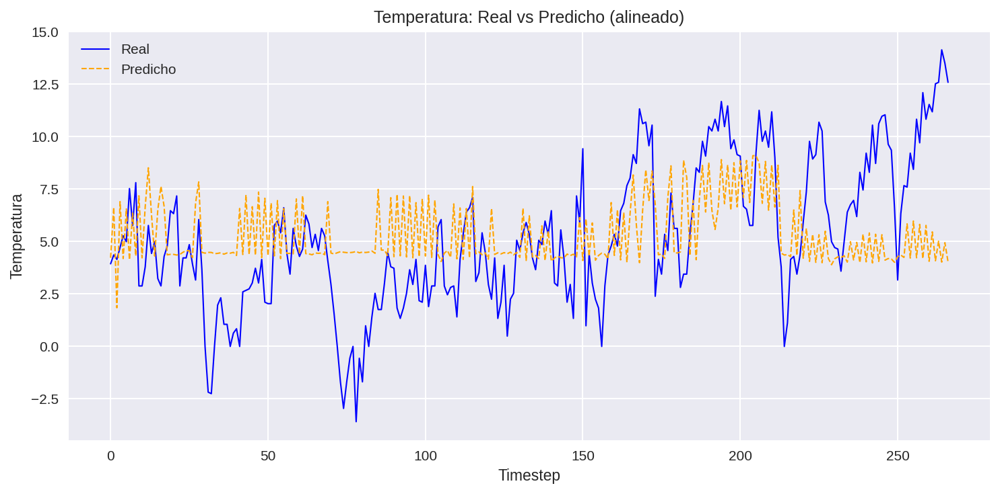

In [151]:
import numpy as np
import matplotlib.pyplot as plt

timesteps = np.arange(len(y_true_flat))
future_shift = sequence_len + future_steps  # desfase (no usado en la gráfica directamente)

plt.figure(figsize=(10, 5))

plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)

plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

plt.title('Temperatura: Real vs Predicho (alineado)')
plt.xlabel('Timestep')
plt.ylabel('Temperatura')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()


#### **5nd Model**

In [152]:
sequence_len = 48
n_steps_out = 1
future_steps = 1
stride = 48
batch_size = 64
val_split = 0.2

train, test = read_data()
train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(train, sequence_len, n_steps_out, future_steps, stride, 48, batch_size, val_split)

In [153]:
import tensorflow as tf
from tensorflow.keras import layers, models


n_features = features_size

n_steps_out = 1
target_col = "Temperature"


model = tf.keras.Sequential([
    layers.Input(shape=(sequence_len, n_features)),

    layers.LSTM(128),
    layers.Dense(64),
    layers.Dropout(0.3),
    layers.BatchNormalization(),

    layers.Dense(32, activation='relu'),
    layers.Dense(n_steps_out)
])

optimizer = tf.keras.optimizers.Adam(
    learning_rate=1e-3,     # También puedes probar 5e-4 o usar un scheduler
    beta_1=0.9,
    beta_2=0.999,
    epsilon=1e-7,           # Valor por defecto, estable
    amsgrad=False           # Prueba True si el entrenamiento es inestable
)

model.compile(
    optimizer=optimizer,
    loss="mse",
    metrics=["mae"]
)

model.summary()


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_23 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

In [154]:
from tensorflow.keras.callbacks import EarlyStopping

# Callback de EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# Entrenamiento
model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=20,
    steps_per_epoch=len(train_indices) // batch_size,
    validation_steps=len(val_indices) // batch_size,
    callbacks=[early_stopping]
)

Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 317.3953 - mae: 15.6799 - val_loss: 25.3933 - val_mae: 4.2628
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 345ms/step - loss: 238.1915 - mae: 13.6696 - val_loss: 18.8489 - val_mae: 3.5718
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 351ms/step - loss: 187.1162 - mae: 12.0219 - val_loss: 23.4862 - val_mae: 3.9877
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 295ms/step - loss: 148.6197 - mae: 10.7478 - val_loss: 64.2320 - val_mae: 6.4278
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 318ms/step - loss: 120.1598 - mae: 9.4813 - val_loss: 76.1907 - val_mae: 6.4297
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 87.4975 - mae: 7.8131 - val_loss: 113.6857 - val_mae: 8.0396
Epoch 7/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 306ms/step - loss: 62.9596 - mae: 6.1988 - val_loss: 145.3423 - val_mae: 9.3052


##### **Evaluación**

In [155]:
all_y_true = []
all_y_pred = []

for x_batch, y_batch in val_dataset:
    y_pred = model.predict(x_batch, verbose=0)  # shape: (batch_size, 1)

    all_y_true.append(y_batch.numpy())          # (batch_size, 1, 1)
    all_y_pred.append(y_pred)                   # (batch_size, 1)


y_true = np.concatenate(all_y_true, axis=0)     # shape: (N, 1, 1)
y_pred = np.concatenate(all_y_pred, axis=0)     # shape: (N, 1)


y_true_flat = y_true.squeeze()  # de (N,1,1) a (N,)
y_pred_flat = y_pred.squeeze()  # de (N,1) a (N,)


In [156]:
print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

Target real (rango): -3.588 14.14
Predicciones (rango): -0.047086492 6.5517774


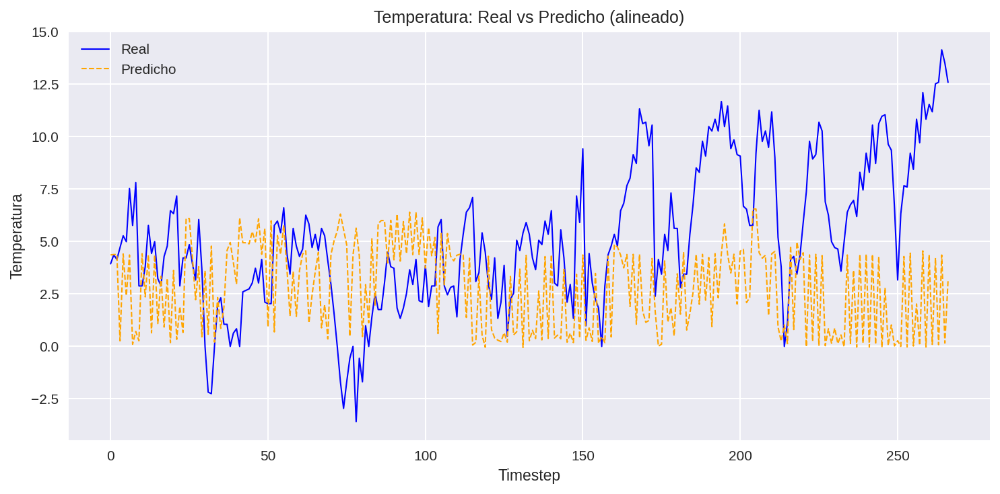

In [157]:
import numpy as np
import matplotlib.pyplot as plt

timesteps = np.arange(len(y_true_flat))
future_shift = sequence_len + future_steps  # desfase (no usado en la gráfica directamente)

plt.figure(figsize=(10, 5))

plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)

plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

plt.title('Temperatura: Real vs Predicho (alineado)')
plt.xlabel('Timestep')
plt.ylabel('Temperatura')
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.show()


### **Extra Model Arquitectures with no Norm**

En estas dos siguientes pruebas se crean diferentes arquitecturas de modelos.

In [158]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
import plotly.graph_objs as go

def build_lstm_model(model_type, sequence_len, n_features, n_steps_out):
    model = models.Sequential()
    model.add(layers.Input(shape=(sequence_len, n_features)))

    if model_type == "baseline":
        model.add(layers.LSTM(64))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "deep_lstm":
        model.add(layers.LSTM(128, return_sequences=True))
        model.add(layers.LSTM(64))
        model.add(layers.Dense(64, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "dropout_bn":
        model.add(layers.LSTM(128))
        model.add(layers.Dense(64))
        model.add(layers.Dropout(0.3))
        model.add(layers.BatchNormalization())
        model.add(layers.Dense(32, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "stacked_lstm":
        model.add(layers.LSTM(64, return_sequences=True))
        model.add(layers.LSTM(32))
        model.add(layers.Dense(32, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "bidirectional":
        model.add(layers.Bidirectional(layers.LSTM(64)))
        model.add(layers.Dense(64, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    else:
        raise ValueError(f"Modelo '{model_type}' no reconocido.")

    optimizer = optimizers.Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model


#########################################
#########################################
#########################################

def evaluate_and_plot_predictions(model, val_dataset, sequence_len, future_steps):
    all_y_true = []
    all_y_pred = []

    for x_batch, y_batch in val_dataset:
        y_pred = model.predict(x_batch, verbose=0)
        all_y_true.append(y_batch.numpy())
        all_y_pred.append(y_pred)

    y_true = np.concatenate(all_y_true, axis=0)
    y_pred = np.concatenate(all_y_pred, axis=0)

    y_true_flat = y_true.squeeze()
    y_pred_flat = y_pred.squeeze()

    print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
    print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

    timesteps = np.arange(len(y_true_flat))
    future_shift = sequence_len + future_steps  # por si quieres usarlo más adelante

    trace_real = go.Scatter(
        x=timesteps,
        y=y_true_flat,
        mode='lines',
        name='Real',
        line=dict(color='blue')
    )

    trace_pred = go.Scatter(
        x=timesteps,
        y=y_pred_flat,
        mode='lines',
        name='Predicho',
        line=dict(color='orange', dash='dash')
    )

    fig = go.Figure(data=[trace_real, trace_pred])
    fig.update_layout(
        title='Temperatura: Real vs Predicho (alineado)',
        xaxis_title='Timestep',
        yaxis_title='Temperatura',
        template='plotly_white'
    )
    fig.show()


def evaluate_and_plot_predictions(model, val_dataset, sequence_len, future_steps):
    all_y_true = []
    all_y_pred = []

    for x_batch, y_batch in val_dataset:
        y_pred = model.predict(x_batch, verbose=0)
        all_y_true.append(y_batch.numpy())
        all_y_pred.append(y_pred)

    y_true = np.concatenate(all_y_true, axis=0)
    y_pred = np.concatenate(all_y_pred, axis=0)

    y_true_flat = y_true.squeeze()
    y_pred_flat = y_pred.squeeze()

    print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
    print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

    timesteps = np.arange(len(y_true_flat))
    future_shift = sequence_len + future_steps  # por si lo necesitas más adelante

    # Crear gráfico con Matplotlib
    plt.figure(figsize=(10, 5))
    plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)
    plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

    plt.title('Temperatura: Real vs Predicho (alineado)')
    plt.xlabel('Timestep')
    plt.ylabel('Temperatura')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_24 (LSTM)                  │ (None, 64)             │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,241 (71.25 KB)

 Trainable params: 18,241 (71.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 306.4678 - mae: 15.3856 - val_loss: 14.9184 - val_mae: 2.9673
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 211.2713 - mae: 12.1063 - val_loss: 14.8333 - val_mae: 3.1542
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 139.5211 - mae: 9.0113 - val_loss: 27.8199 - val_mae: 4.5720
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 95.8672 - mae: 7.3859 - val_loss: 44.6612 - val_mae: 5.9170
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 90.7121 - mae: 7.2361 - val_loss: 61.8943 - val_mae: 7.1489
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 75.9826 - mae: 6.5998 - val_loss: 78.4850 - val_mae: 8.2382
Epoch 7/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 72.2782 - mae: 6.6648 - val_loss: 92.5118 - val_mae: 9.0500
Target real (rango): -3.588 14.14
Predicciones (rango): 2.7264738 7.016661


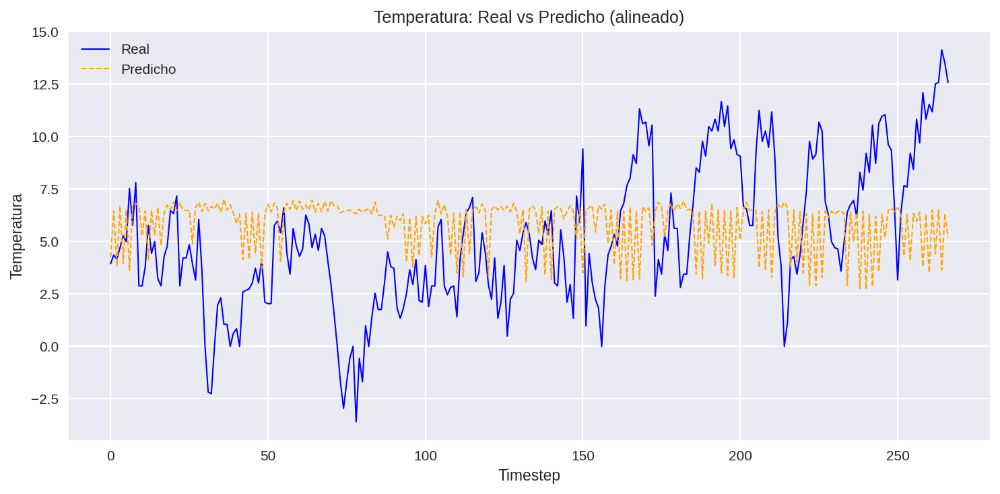

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_25 (LSTM)                  │ (None, 48, 128)        │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_26 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 122,753 (479.50 KB)

 Trainable params: 122,753 (479.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 284.4655 - mae: 14.6349 - val_loss: 12.1893 - val_mae: 2.7019
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 179.7587 - mae: 10.8608 - val_loss: 36.0927 - val_mae: 5.2386
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 180ms/step - loss: 87.3071 - mae: 6.9949 - val_loss: 131.0139 - val_mae: 11.0018
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 319ms/step - loss: 62.1201 - mae: 6.2966 - val_loss: 142.1102 - val_mae: 11.4992
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 78.1681 - mae: 6.9770 - val_loss: 123.4571 - val_mae: 10.6569
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 170ms/step - loss: 70.4829 - mae: 6.6307 - val_loss: 123.1999 - val_mae: 10.6442
Target real (rango): -3.588 14.14
Predicciones (rango): 2.8903983 3.6763587


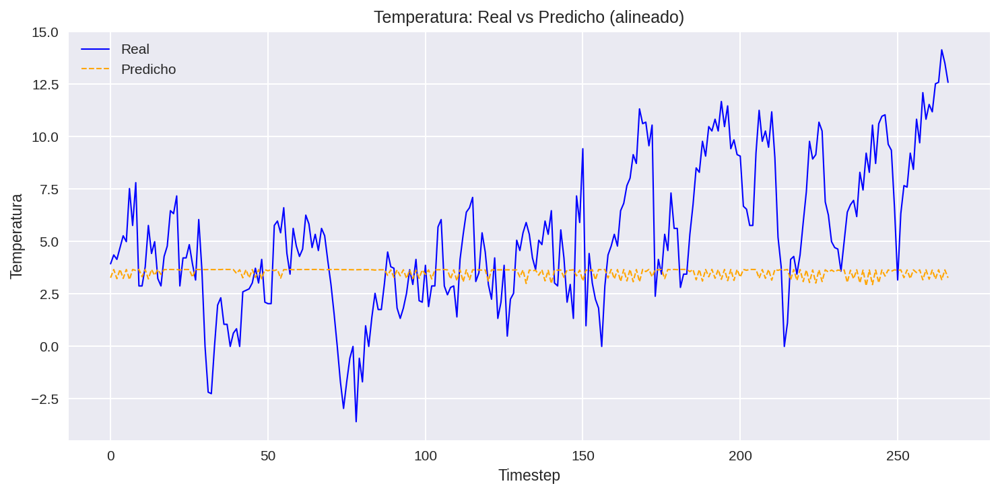

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_27 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 265.1712 - mae: 14.2268 - val_loss: 18.0126 - val_mae: 3.4032
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 191.5858 - mae: 12.1005 - val_loss: 16.1983 - val_mae: 3.2109
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 151.1468 - mae: 10.5548 - val_loss: 23.6335 - val_mae: 3.8119
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 108.4945 - mae: 8.9776 - val_loss: 59.6658 - val_mae: 5.6011
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 69.0464 - mae: 6.8864 - val_loss: 57.2848 - val_mae: 5.6418
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 48.8348 - mae: 5.7208 - val_loss: 72.5137 - val_mae: 6.6926
Epoch 7/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 325ms/step - loss: 35.7057 - mae: 4.7342 - val_loss: 70.4719 - val_mae: 6.2203
Target real (rango): -3.588 14.14
Predicciones (rango): 0.2537935 9.997668


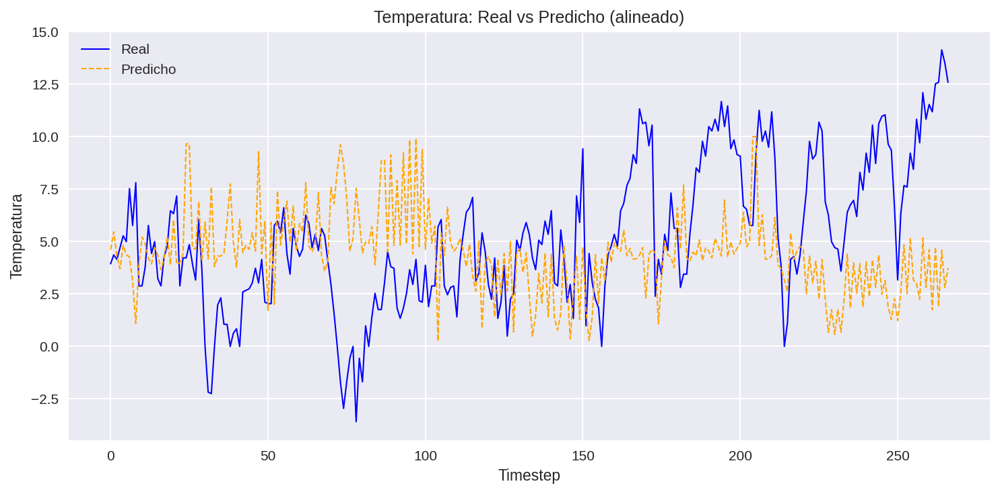

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_28 (LSTM)                  │ (None, 48, 64)         │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_29 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,681 (123.75 KB)

 Trainable params: 31,681 (123.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 302.9514 - mae: 15.1852 - val_loss: 19.1693 - val_mae: 3.4647
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 225.7653 - mae: 12.6257 - val_loss: 11.0533 - val_mae: 2.6460
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 146.2978 - mae: 9.3652 - val_loss: 24.4199 - val_mae: 4.2513
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 122.5935 - mae: 8.3438 - val_loss: 60.9830 - val_mae: 7.1430
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 80.4983 - mae: 6.7704 - val_loss: 100.7793 - val_mae: 9.5326
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 73.1000 - mae: 6.5996 - val_loss: 125.0130 - val_mae: 10.7289
Epoch 7/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 185ms/step - loss: 72.3025 - mae: 6.8061 - val_loss: 129.3224 - val_mae: 10.9277
Target real (rango): -3.588 14.14
Predicciones (rango): 3.5997565 5.4098463


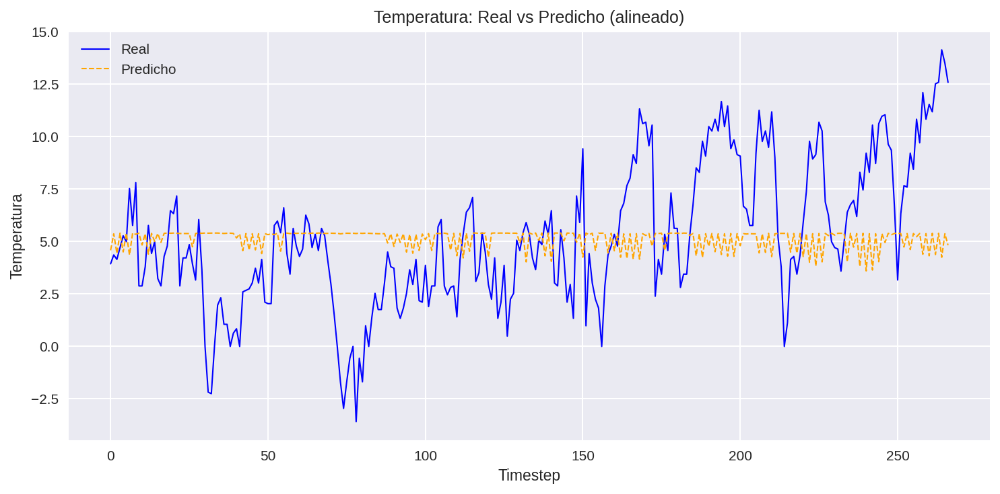

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_2 (Bidirectional) │ (None, 128)            │        36,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,673 (174.50 KB)

 Trainable params: 44,673 (174.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 270.1468 - mae: 14.1559 - val_loss: 19.9802 - val_mae: 3.6688
Epoch 2/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 169ms/step - loss: 109.6851 - mae: 8.1827 - val_loss: 132.5855 - val_mae: 10.0980
Epoch 3/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 65.7229 - mae: 6.8085 - val_loss: 119.2450 - val_mae: 9.8074
Epoch 4/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 59.0440 - mae: 6.3509 - val_loss: 141.4377 - val_mae: 10.9452
Epoch 5/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 47.3745 - mae: 5.5832 - val_loss: 148.2361 - val_mae: 11.2222
Epoch 6/20
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 45.8935 - mae: 5.3353 - val_loss: 147.5177 - val_mae: 11.0782
Target real (rango): -3.588 14.14
Predicciones (rango): 4.3427916 8.901779


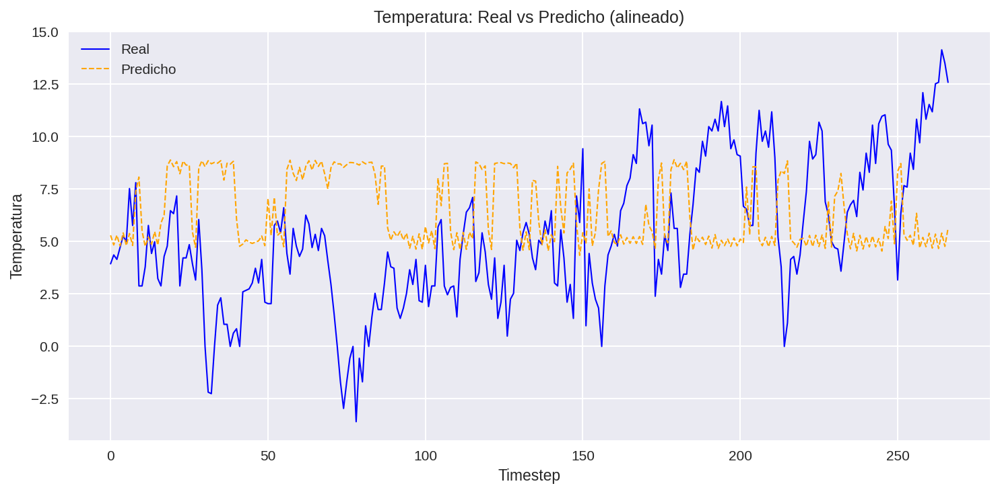

In [159]:
model_names = ["baseline", "deep_lstm", "dropout_bn", "stacked_lstm", "bidirectional"]

for model in model_names:
    sequence_len = 48
    n_steps_out = 1
    future_steps = 1
    stride = 48
    batch_size = 64
    val_split = 0.2

    train, test = read_data()
    train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(train, sequence_len, n_steps_out, future_steps, stride, 48, batch_size, val_split)

    ### Modelo
    model_type = model
    model = build_lstm_model(model_type, sequence_len=48, n_features=6, n_steps_out=1)
    model.summary()


    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=20,
        steps_per_epoch=len(train_indices) // batch_size,
        validation_steps=len(val_indices) // batch_size,
        callbacks=[early_stopping]
    )

    evaluate_and_plot_predictions(model, val_dataset, sequence_len=48, future_steps=1)

### **Extra Model Arquitectures with Norm**

In [162]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np
import plotly.graph_objs as go

def build_lstm_model(model_type, sequence_len, n_features, n_steps_out):
    model = models.Sequential()
    model.add(layers.Input(shape=(sequence_len, n_features)))

    if model_type == "baseline":
        model.add(layers.LSTM(64))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "deep_lstm":
        model.add(layers.LSTM(128, return_sequences=True))
        model.add(layers.LSTM(64))
        model.add(layers.Dense(64, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "dropout_bn":
        model.add(layers.LSTM(128))
        model.add(layers.Dense(64))
        model.add(layers.Dropout(0.3))
        model.add(layers.BatchNormalization())
        model.add(layers.Dense(32, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "stacked_lstm":
        model.add(layers.LSTM(64, return_sequences=True))
        model.add(layers.LSTM(32))
        model.add(layers.Dense(32, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    elif model_type == "bidirectional":
        model.add(layers.Bidirectional(layers.LSTM(64)))
        model.add(layers.Dense(64, activation='relu'))
        model.add(layers.Dense(n_steps_out))

    else:
        raise ValueError(f"Modelo '{model_type}' no reconocido.")

    optimizer = optimizers.Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model


#########################################
#########################################
#########################################

def evaluate_and_plot_predictions(model, val_dataset, sequence_len, future_steps, target_zscore_stats):
    all_y_true = []
    all_y_pred = []

    target_mean, target_std = target_zscore_stats

    for x_batch, y_batch in val_dataset:
        y_pred = model.predict(x_batch, verbose=0)
        all_y_true.append(y_batch.numpy())
        all_y_pred.append(y_pred)

    y_true = np.concatenate(all_y_true, axis=0)
    y_pred = np.concatenate(all_y_pred, axis=0)

    y_true_flat = y_true.squeeze()
    y_pred_flat = y_pred.squeeze()

    y_pred_flat = zscore_denormalize(y_pred_flat, target_mean, target_std)
    y_true_flat = zscore_denormalize(y_true_flat, target_mean, target_std)

    print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
    print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

    timesteps = np.arange(len(y_true_flat))
    future_shift = sequence_len + future_steps  # por si quieres usarlo más adelante

    trace_real = go.Scatter(
        x=timesteps,
        y=y_true_flat,
        mode='lines',
        name='Real',
        line=dict(color='blue')
    )

    trace_pred = go.Scatter(
        x=timesteps,
        y=y_pred_flat,
        mode='lines',
        name='Predicho',
        line=dict(color='orange', dash='dash')
    )

    fig = go.Figure(data=[trace_real, trace_pred])
    fig.update_layout(
        title='Temperatura: Real vs Predicho (alineado)',
        xaxis_title='Timestep',
        yaxis_title='Temperatura',
        template='plotly_white'
    )
    fig.show()



def evaluate_and_plot_predictions(model, val_dataset, sequence_len, future_steps, target_zscore_stats):
    all_y_true = []
    all_y_pred = []

    target_mean, target_std = target_zscore_stats

    for x_batch, y_batch in val_dataset:
        y_pred = model.predict(x_batch, verbose=0)
        all_y_true.append(y_batch.numpy())
        all_y_pred.append(y_pred)

    y_true = np.concatenate(all_y_true, axis=0)
    y_pred = np.concatenate(all_y_pred, axis=0)

    y_true_flat = y_true.squeeze()
    y_pred_flat = y_pred.squeeze()

    # Desnormalizar
    y_pred_flat = zscore_denormalize(y_pred_flat, target_mean, target_std)
    y_true_flat = zscore_denormalize(y_true_flat, target_mean, target_std)

    print("Target real (rango):", y_true_flat.min(), y_true_flat.max())
    print("Predicciones (rango):", y_pred_flat.min(), y_pred_flat.max())

    timesteps = np.arange(len(y_true_flat))
    future_shift = sequence_len + future_steps  # Por si lo necesitas luego

    # Gráfico con Matplotlib
    plt.figure(figsize=(10, 5))
    plt.plot(timesteps, y_true_flat, label='Real', color='blue', linewidth=1)
    plt.plot(timesteps, y_pred_flat, label='Predicho', color='orange', linestyle='--', linewidth=1)

    plt.title('Temperatura: Real vs Predicho (alineado)')
    plt.xlabel('Timestep')
    plt.ylabel('Temperatura')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



def zscore_denormalize(data, mean, std):
    return data * std + mean

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_32 (LSTM)                  │ (None, 64)             │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,241 (71.25 KB)

 Trainable params: 18,241 (71.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.3794 - mae: 0.4279 - val_loss: 0.1265 - val_mae: 0.2777
Epoch 2/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 49s 61ms/step - loss: 0.4948 - mae: 0.4510 - val_loss: 0.1387 - val_mae: 0.2884
Epoch 3/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.5326 - mae: 0.4577 - val_loss: 0.1447 - val_mae: 0.2940
Target real (rango): -3.7280000473349464 16.812999842038835
Predicciones (rango): 2.6966539596230614 9.288250086179458


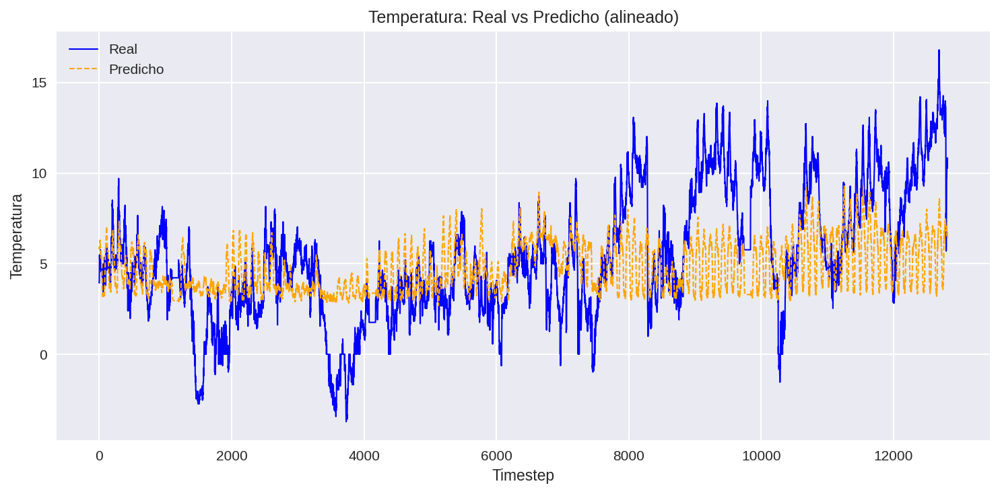

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_33 (LSTM)                  │ (None, 48, 128)        │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_34 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 122,753 (479.50 KB)

 Trainable params: 122,753 (479.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 158s 191ms/step - loss: 0.2486 - mae: 0.3605 - val_loss: 0.1369 - val_mae: 0.2906
Epoch 2/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 202s 252ms/step - loss: 0.5156 - mae: 0.4545 - val_loss: 0.1621 - val_mae: 0.3052
Epoch 3/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 152s 189ms/step - loss: 0.4904 - mae: 0.4513 - val_loss: 0.1419 - val_mae: 0.2908
Target real (rango): -3.7280000473349464 16.812999842038835
Predicciones (rango): 0.07757913815089346 15.828049061170303


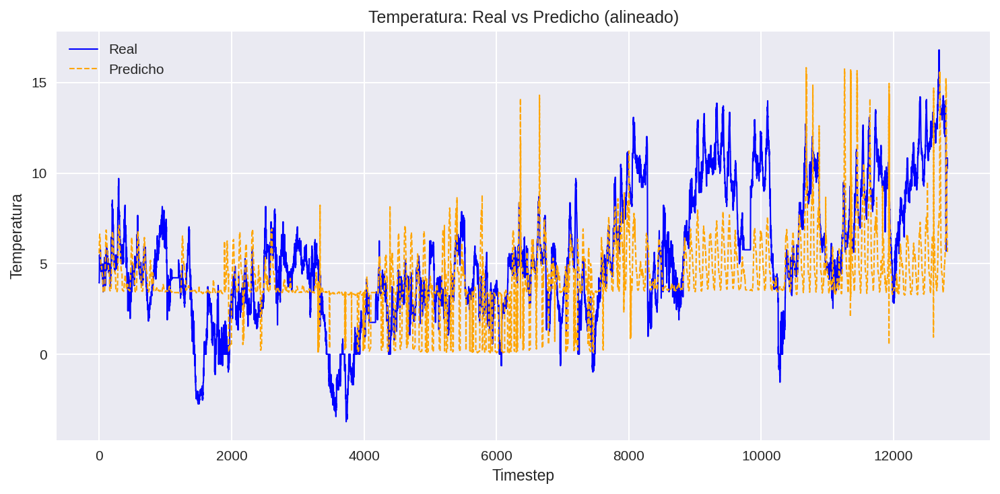

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_35 (LSTM)                  │ (None, 128)            │        69,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79,745 (311.50 KB)

 Trainable params: 79,617 (311.00 KB)

 Non-trainable params: 128 (512.00 B)

Epoch 1/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 105s 125ms/step - loss: 0.6502 - mae: 0.5694 - val_loss: 0.1781 - val_mae: 0.3413
Epoch 2/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 142s 177ms/step - loss: 0.6426 - mae: 0.5666 - val_loss: 0.1932 - val_mae: 0.3594
Epoch 3/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 102s 126ms/step - loss: 0.6972 - mae: 0.5892 - val_loss: 0.3645 - val_mae: 0.5204
Target real (rango): -3.7280000473349464 16.812999842038835
Predicciones (rango): -0.5979102875082862 12.384084341397964


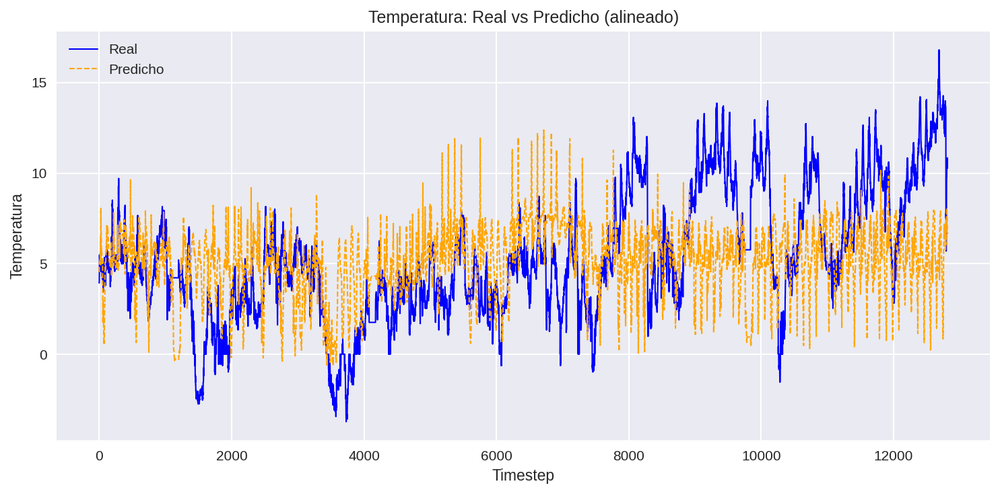

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_36 (LSTM)                  │ (None, 48, 64)         │        18,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_37 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,681 (123.75 KB)

 Trainable params: 31,681 (123.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 86s 101ms/step - loss: 0.3516 - mae: 0.4131 - val_loss: 0.2946 - val_mae: 0.4144
Epoch 2/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 80s 100ms/step - loss: 0.6380 - mae: 0.4955 - val_loss: 0.1456 - val_mae: 0.2958
Epoch 3/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 80s 99ms/step - loss: 0.6240 - mae: 0.5149 - val_loss: 0.1475 - val_mae: 0.2966
Target real (rango): -3.7280000473349464 16.812999842038835
Predicciones (rango): 3.8051162933022606 20.97350799786159


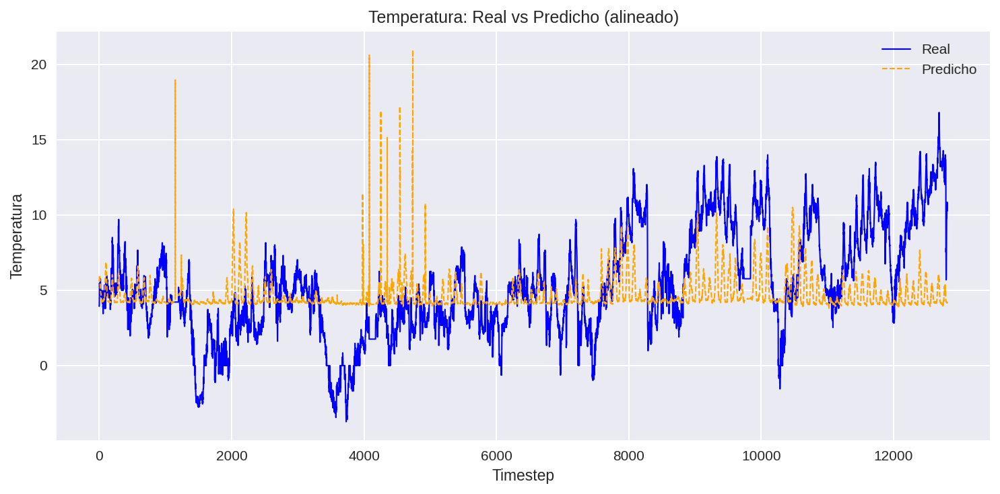

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_3 (Bidirectional) │ (None, 128)            │        36,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_70 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,673 (174.50 KB)

 Trainable params: 44,673 (174.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 90s 103ms/step - loss: 0.2746 - mae: 0.3756 - val_loss: 0.1481 - val_mae: 0.3112
Epoch 2/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 82s 102ms/step - loss: 0.5366 - mae: 0.4541 - val_loss: 0.1638 - val_mae: 0.3154
Epoch 3/3
803/803 ━━━━━━━━━━━━━━━━━━━━ 142s 176ms/step - loss: 0.4495 - mae: 0.4193 - val_loss: 0.1428 - val_mae: 0.2929
Target real (rango): -3.7280000473349464 16.812999842038835
Predicciones (rango): 1.6656233047158349 11.149433014264785


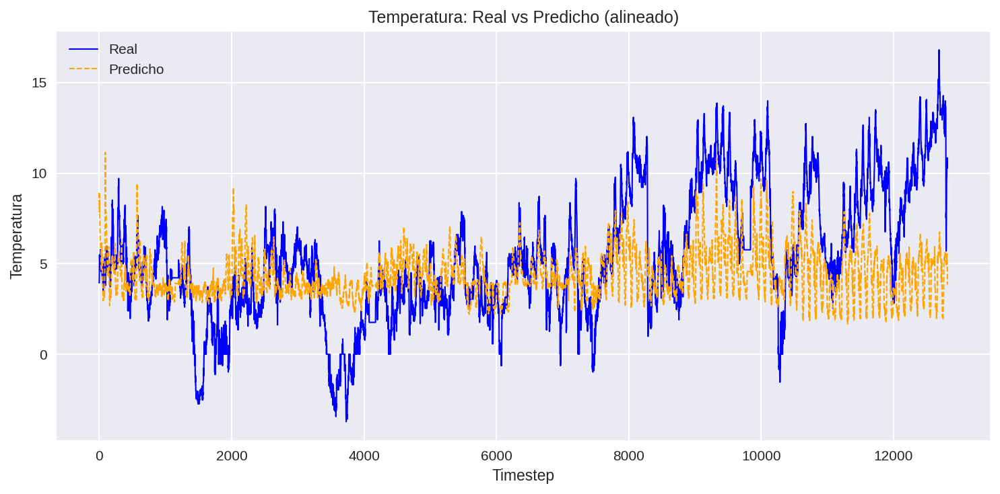

In [163]:
model_names = ["baseline", "deep_lstm", "dropout_bn", "stacked_lstm", "bidirectional"]

for model in model_names:
    sequence_len = 48
    n_steps_out = 1
    future_steps = 1
    stride = 1
    batch_size = 64
    val_split = 0.2
    val_stride = 1

    train, test = read_data()

    feature_cols = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']
    target_col = "Temperature"

    train, zscore_stats, target_zscore_stats = zscore_normalize_data(train, feature_cols, target_col)

    train_dataset, val_dataset, train_indices, val_indices, features_size = prepare_datasets(train, sequence_len, n_steps_out, future_steps, stride, 1, batch_size, val_split)

    ### Modelo
    model_type = model
    model = build_lstm_model(model_type, sequence_len=48, n_features=6, n_steps_out=1)
    model.summary()


    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    model.fit(
        train_dataset,
        validation_data=val_dataset,
        epochs=3,
        steps_per_epoch=len(train_indices) // batch_size,
        validation_steps=len(val_indices) // batch_size,
        callbacks=[early_stopping]
    )

    evaluate_and_plot_predictions(model, val_dataset, sequence_len=48, future_steps=1, target_zscore_stats=target_zscore_stats)

###   

---
**Conclusiones** de los modelos LSTM: la capacidad de aprendizaje de los modelos LSTM alimentados por las series temporales de *Features* en crudo es insuficiente para modelar correctamente la temperatura.

## 5️⃣ **Quinto Experimento**. Feature Engineering + CatBoost + Conformal Prediction
---

El algoritmo de *ML* elegido en esta prueba es CatBoost. CatBoost es una biblioteca de refuerzo de gradiente, útil en el manejo de datos categóricos. La idea es construir una serie de modelos `i`, siendo el `modelo[i+1]` más óptimo respecto al `modelo[i]`

In [1]:
%pip install catboost --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.3 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
import numpy as np
import pandas as pd

from catboost import CatBoostRegressor, Pool

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.stattools import adfuller, kpss, acf, grangercausalitytests
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from scipy.stats import probplot

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

plt.style.use('ggplot')
plt.rcParams.update(**{'figure.dpi':150})

%matplotlib inline

In [9]:
def read_data():
  train = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/train.csv", sep=",")
  test = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/test.csv", sep=",")
  train_public  = pd.read_csv("/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/train_and_Public.csv", sep=",")

  train['date'] = pd.to_datetime(train['date'])
  test['date'] = pd.to_datetime(test['date'])

  train.head()

  return train, test

In [10]:
train_df, test_df = read_data()

In [47]:
submission_df = pd.read_csv('/content/drive/MyDrive/Universidad/Master/Segundo semestre/Bloque_2/Series_temporales/data/sample_submission.csv')

### **Feature Engineering**

Se aplican las técnicas de *feature engineering* del Tercer Experimento.

In [11]:
features = [col for col in train_df.columns if 'feature' in col]

In [13]:
initial_features = ['feature_AA', 'feature_AB', 'feature_BA', 'feature_BB', 'feature_CA', 'feature_CB']

El siguiente código implementa funciones para la descomposición estacional de datos de series temporales.


```python
# **Funciones de Medias Móviles**
def sma(source, length)
def ema(source, length)
def dema(source, length)
def rma(source, length)
```
La función `selector` devuelve la serie temporal suavizada según la función de media móvil elegida

In [17]:
def sma(source, length):
    return source.rolling(window=length, min_periods=1).mean().astype('float32')

def ema(source, length):
    return source.ewm(span=length, adjust=False).mean().astype('float32')

def dema(source, length):
    return 2 * ema(source, length) - ema(ema(source, length), length).astype('float32')

def rma(source, length):
    return source.ewm(alpha=1/length, adjust=False).mean().astype('float32')

def selector(source, length, ma_type, column='Temperature'):
    if ma_type == 'sma':
        return sma(source[column], length)
    elif ma_type == 'ema':
        return ema(source[column], length)
    elif ma_type == 'dema':
        return dema(source[column], length)
    elif ma_type == 'rma':
        return rma(source[column], length)
    else:
        raise ValueError('Invalid moving average type')



### Realiza una normalización z-score ###
def initial_preprocessing(data, column, deflation_data=None, use_log=True):
    if deflation_data is not None:
        common_index = data.index.union(deflation_data.index)
        data = data.reindex(common_index)
        deflation_data = deflation_data.reindex(common_index)
        data[f'Deflated_{column}'] = data[column] / deflation_data[column]
    else:
        data[f'Deflated_{column}'] = data[column]

    data[f'Deflated_{column}'] = data[f'Deflated_{column}'].replace([np.inf, -np.inf], np.nan)

    if use_log:
        min_value = data[f'Deflated_{column}'].min()
        if min_value <= 0:
            data[f'Log_{column}'] = np.log(data[f'Deflated_{column}'] - min_value + 1)
        else:
            data[f'Log_{column}'] = np.log(data[f'Deflated_{column}'])
        transformed_column = f'Log_{column}'
    else:
        transformed_column = f'Deflated_{column}'

    data[f'Scaled_{transformed_column}'] = (data[transformed_column] - data[transformed_column].mean()) / data[transformed_column].std()

    # missing values
    data[f'Scaled_{transformed_column}'] = data[f'Scaled_{transformed_column}'].interpolate(method='linear').ffill().bfill()

    return data, f'Scaled_{transformed_column}'


def stationarity_analysis(data, column):
    series = data[column].dropna()

    adf_result = adfuller(series)
    adf_stat, adf_p = adf_result[0], adf_result[1]

    kpss_result = kpss(series, regression='c', nlags='auto')
    kpss_stat, kpss_p = kpss_result[0], kpss_result[1]

    print(f'ADF Statistic: {adf_stat}, p-value: {adf_p}')
    print(f'KPSS Statistic: {kpss_stat}, p-value: {kpss_p}')

    if adf_p < 0.05 and kpss_p >= 0.05:
        print("Serie Estacionaria.")
        return True
    elif adf_p >= 0.05 and kpss_p < 0.05:
        print("No estacionaria.")
        return False
    else:
        print("Conflicto")
        return False


def difference_series(data, column, order=1):
    return data[column].diff(order).dropna()


def seasonal_decomposition(data, column, window=672, seasonal=96, ma_type='sma'):
    trend = selector(data, length=window, ma_type=ma_type, column=column)
    trend = trend.reindex(data.index)
    detrended = data[column] - trend
    stl = STL(detrended.dropna(), period=seasonal, robust=True)
    result = stl.fit()
    seasonal = result.seasonal
    residual = result.resid
    seasonal = seasonal.reindex(data.index).fillna(0)
    residual = residual.reindex(data.index).fillna(0)
    decomposition = pd.DataFrame({
        f'{column}_Original': data[column],
        f'{column}_Trend': trend,
        f'{column}_Seasonal': seasonal,
        f'{column}_Residual': residual
    })

    return decomposition


def main_analysis(data, column, deflation_data=None, use_log=True, window=13, seasonal_period=12, ma_type='sma'):
    data, scaled_column = initial_preprocessing(data, column, deflation_data, use_log)

    # stationarity tests
    is_stationary = stationarity_analysis(data, scaled_column)

    # differencing
    if not is_stationary:
        print("\nPerforming first-order differencing due to non-stationarity.")
        data[f'{column}_Differenced'] = difference_series(data, scaled_column)
        is_stationary = stationarity_analysis(data, f'{column}_Differenced')
        if is_stationary:
            scaled_column = f'{column}_Differenced'
        else:
            print("Data remains non-stationary after first-order differencing. Consider further analysis.")

    # seasonal decomposition
    seasonal_decomp = seasonal_decomposition(data, scaled_column, window, seasonal=seasonal_period, ma_type=ma_type)


    return seasonal_decomp



#######################
### TRAIN
#######################
seasonal_decompositions = {}

for feature in initial_features:
    seasonal_decomp = main_analysis(train_df, feature, use_log=False, window=672, seasonal_period=96, ma_type="ema")
    if seasonal_decomp is not None:
        seasonal_decompositions[feature] = seasonal_decomp

seasonal_decompositions_df = pd.concat(seasonal_decompositions.values(), axis=1)
train_df = pd.concat([train_df, seasonal_decompositions_df], axis=1)
train_df.head()

ADF Statistic: -26.278310007109358, p-value: 0.0
KPSS Statistic: 7.693748603145859, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.
ADF Statistic: -57.95847475228712, p-value: 0.0
KPSS Statistic: 0.003571517050999912, p-value: 0.1
Serie Estacionaria.
ADF Statistic: -11.460024366265783, p-value: 5.583994216379788e-21
KPSS Statistic: 3.8546327183748437, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.
ADF Statistic: -49.97186190695186, p-value: 0.0
KPSS Statistic: 0.0008669884097127426, p-value: 0.1
Serie Estacionaria.
ADF Statistic: -27.209652333839312, p-value: 0.0
KPSS Statistic: 9.788788032514464, p-value: 0.01
Conflicto

Performing first-order differencing due to non-stationarity.
ADF Statistic: -58.57027923325645, p-value: 0.0
KPSS Statistic: 0.002450137256072725, p-value: 0.1
Serie Estacionaria.
ADF Statistic: -10.962818100131662, p-value: 8.24404884266083e-20
KPSS Statistic: 3.3950861175444125, p-value: 0.

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Deflated_feature_AA,Scaled_Deflated_feature_AA,...,feature_BB_Differenced_Seasonal,feature_BB_Differenced_Residual,feature_CA_Differenced_Original,feature_CA_Differenced_Trend,feature_CA_Differenced_Seasonal,feature_CA_Differenced_Residual,feature_CB_Differenced_Original,feature_CB_Differenced_Trend,feature_CB_Differenced_Seasonal,feature_CB_Differenced_Residual
0,64320,2018-05-02 00:00:00,14.133,2.076,9.346,-0.036,4.538,1.279,14.133,0.916713,...,0.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN,0.000000,0.000000
1,64321,2018-05-02 00:15:00,12.123,1.541,7.818,-0.746,4.538,1.249,12.123,0.687010,...,-0.397411,-0.066369,0.000000,0.000000,-0.029898,0.008221,-0.093877,-0.093877,-0.174985,0.058704
2,64322,2018-05-02 00:30:00,12.525,1.741,8.209,-0.284,4.477,1.279,12.525,0.732951,...,0.451542,-0.057898,-0.054618,-0.000162,-0.061157,-0.014896,0.093877,-0.093319,0.063793,0.007275
3,64323,2018-05-02 00:45:00,12.324,1.942,7.747,0.249,4.630,1.371,12.324,0.709980,...,0.433634,0.009928,0.136993,0.000245,0.072770,0.042462,0.287889,-0.092186,0.187485,0.076614
4,64324,2018-05-02 01:00:00,14.602,1.407,9.630,-0.320,4.477,1.310,14.602,0.970311,...,-0.197885,-0.166381,-0.136993,-0.000163,-0.099969,-0.058296,-0.190883,-0.092480,-0.051764,-0.162465


In [53]:
#######################
### TEST
#######################

def main_analysisa(data, column, deflation_data=None, use_log=True, window=13, seasonal_period=12, ma_type='sma'):
    data, scaled_column = initial_preprocessing(data, column, deflation_data, use_log)

    print("\nPerforming first-order differencing due to non-stationarity.")
    data[f'{column}_Differenced'] = difference_series(data, scaled_column)
    is_stationary = stationarity_analysis(data, f'{column}_Differenced')
    if is_stationary:
        scaled_column = f'{column}_Differenced'
    else:
        print("Data remains non-stationary after first-order differencing. Consider further analysis.")

    # seasonal decomposition
    seasonal_decomp = seasonal_decomposition(data, scaled_column, window, seasonal=seasonal_period, ma_type=ma_type)


    return seasonal_decomp


seasonal_decompositions = {}

for feature in initial_features:
    seasonal_decomp = main_analysisa(test_df, feature, use_log=False, window=672, seasonal_period=96, ma_type="ema")
    if seasonal_decomp is not None:
        seasonal_decompositions[feature] = seasonal_decomp

seasonal_decompositions_df = pd.concat(seasonal_decompositions.values(), axis=1)
test_df = pd.concat([test_df, seasonal_decompositions_df], axis=1)
test_df.head()


Performing first-order differencing due to non-stationarity.
ADF Statistic: -16.006179629256103, p-value: 6.43042768320423e-29
KPSS Statistic: 0.00396005983153666, p-value: 0.1
Serie Estacionaria.

Performing first-order differencing due to non-stationarity.
ADF Statistic: -16.674515126168025, p-value: 1.534859250570214e-29
KPSS Statistic: 0.004273460582511105, p-value: 0.1
Serie Estacionaria.

Performing first-order differencing due to non-stationarity.
ADF Statistic: -15.761240533508543, p-value: 1.1910000526771802e-28
KPSS Statistic: 0.0036807729513825796, p-value: 0.1
Serie Estacionaria.

Performing first-order differencing due to non-stationarity.
ADF Statistic: -16.986030434636646, p-value: 8.940108920190614e-30
KPSS Statistic: 0.005602124770246819, p-value: 0.1
Serie Estacionaria.

Performing first-order differencing due to non-stationarity.
ADF Statistic: -20.072740471210786, p-value: 0.0
KPSS Statistic: 0.006859116496860813, p-value: 0.1
Serie Estacionaria.

Performing first-

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Deflated_feature_AA,Scaled_Deflated_feature_AA,...,feature_BB_Differenced_Seasonal,feature_BB_Differenced_Residual,feature_CA_Differenced_Original,feature_CA_Differenced_Trend,feature_CA_Differenced_Seasonal,feature_CA_Differenced_Residual,feature_CB_Differenced_Original,feature_CB_Differenced_Trend,feature_CB_Differenced_Seasonal,feature_CB_Differenced_Residual
0,64320,2018-05-02 00:00:00,14.133,2.076,9.346,-0.036,4.538,1.279,14.133,0.916713,...,0.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN,0.000000,0.000000
1,64321,2018-05-02 00:15:00,12.123,1.541,7.818,-0.746,4.538,1.249,12.123,0.687010,...,-0.397411,-0.066369,0.000000,0.000000,-0.029898,0.008221,-0.093877,-0.093877,-0.174985,0.058704
2,64322,2018-05-02 00:30:00,12.525,1.741,8.209,-0.284,4.477,1.279,12.525,0.732951,...,0.451542,-0.057898,-0.054618,-0.000162,-0.061157,-0.014896,0.093877,-0.093319,0.063793,0.007275
3,64323,2018-05-02 00:45:00,12.324,1.942,7.747,0.249,4.630,1.371,12.324,0.709980,...,0.433634,0.009928,0.136993,0.000245,0.072770,0.042462,0.287889,-0.092186,0.187485,0.076614
4,64324,2018-05-02 01:00:00,14.602,1.407,9.630,-0.320,4.477,1.310,14.602,0.970311,...,-0.197885,-0.166381,-0.136993,-0.000163,-0.099969,-0.058296,-0.190883,-0.092480,-0.051764,-0.162465


Este bloque de código genera **features periódicas** (términos de Fourier) que capturan patrones de **estacionalidad diaria y semanal** en los datos temporales.


In [19]:
# Fourier terms for dayly seasonality
train_fourier_day = np.sin(2 * np.pi * np.arange(len(train_df)) / 96)
train_fourier_day += np.cos(2 * np.pi * np.arange(len(train_df)) / 96)
train_df['fourier_terms_day'] = train_fourier_day

test_fourier_day = np.sin(2 * np.pi * np.arange(len(test_df)) / 96)
test_fourier_day += np.cos(2 * np.pi * np.arange(len(test_df)) / 96)
test_df['fourier_terms_day'] = test_fourier_day

# Fourier terms for weekly seasonality
train_fourier_week = np.sin(2 * np.pi * np.arange(len(train_df)) / 96*7)
train_fourier_week += np.cos(2 * np.pi * np.arange(len(train_df)) / 96*7)
train_df['fourier_terms_week'] = train_fourier_week

test_fourier_week = np.sin(2 * np.pi * np.arange(len(test_df)) / 96*7)
test_fourier_week += np.cos(2 * np.pi * np.arange(len(test_df)) / 96*7)
test_df['fourier_terms_week'] = test_fourier_week

Este módulo implementa dos algoritmos de detección de anomalías no supervisada: **Isolation Forest** y **Local Outlier Factor (LOF)**. Es útil para identificar valores atípicos en series temporales u otras características numéricas.


In [20]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor


def detect_anomalies_isolation_forest(data, column, contamination=0.01):
    clf = IsolationForest(contamination=contamination, random_state=42)
    anomalies = clf.fit_predict(data[[column]])
    print(f"Detected {sum(anomalies == -1)} anomalies using Isolation Forest")
    return anomalies == -1

def detect_anomalies_lof(data, column, n_neighbors=20, contamination=0.01):
    clf = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
    anomalies = clf.fit_predict(data[[column]])
    print(f"Detected {sum(anomalies == -1)} anomalies using Local Outlier Factor")
    return anomalies == -1


def analyze_anomalies(data, column, plot=True):
    if_anomalies = detect_anomalies_isolation_forest(data, column)
    lof_anomalies = detect_anomalies_lof(data, column)

    return pd.DataFrame({
        f'{column}_IF_Anomaly': if_anomalies,
        f'{column}_LOF_Anomaly': lof_anomalies
    }, index=data.index)

def analyze_all_features_anomalies(data, features):
    anomaly_results = {}
    for feature in features:
        anomaly_results[feature] = analyze_anomalies(data, feature, plot=True)

    combined_results = pd.concat(anomaly_results.values(), axis=1)

    return combined_results


anomaly_df = analyze_all_features_anomalies(train_df, initial_features)
train_df = pd.concat([train_df, anomaly_df], axis=1)
train_df.head()

anomaly_df = analyze_all_features_anomalies(test_df, initial_features)
test_df = pd.concat([test_df, anomaly_df], axis=1)
test_df.head()

Detected 642 anomalies using Isolation Forest
Detected 634 anomalies using Local Outlier Factor
Detected 638 anomalies using Isolation Forest
Detected 209 anomalies using Local Outlier Factor
Detected 639 anomalies using Isolation Forest
Detected 636 anomalies using Local Outlier Factor
Detected 636 anomalies using Isolation Forest
Detected 382 anomalies using Local Outlier Factor
Detected 255 anomalies using Isolation Forest
Detected 225 anomalies using Local Outlier Factor
Detected 615 anomalies using Isolation Forest
Detected 92 anomalies using Local Outlier Factor
Detected 54 anomalies using Isolation Forest
Detected 53 anomalies using Local Outlier Factor
Detected 51 anomalies using Isolation Forest
Detected 42 anomalies using Local Outlier Factor
Detected 53 anomalies using Isolation Forest
Detected 50 anomalies using Local Outlier Factor
Detected 53 anomalies using Isolation Forest
Detected 53 anomalies using Local Outlier Factor
Detected 53 anomalies using Isolation Forest
Dete

,id,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Deflated_feature_AA,Scaled_Deflated_feature_AA,...,feature_AB_IF_Anomaly,feature_AB_LOF_Anomaly,feature_BA_IF_Anomaly,feature_BA_LOF_Anomaly,feature_BB_IF_Anomaly,feature_BB_LOF_Anomaly,feature_CA_IF_Anomaly,feature_CA_LOF_Anomaly,feature_CB_IF_Anomaly,feature_CB_LOF_Anomaly
0,64320,2018-05-02 00:00:00,14.133,2.076,9.346,-0.036,4.538,1.279,14.133,0.916713,...,False,False,False,False,False,False,False,False,False,False
1,64321,2018-05-02 00:15:00,12.123,1.541,7.818,-0.746,4.538,1.249,12.123,0.687010,...,False,False,False,False,False,False,False,False,False,False
2,64322,2018-05-02 00:30:00,12.525,1.741,8.209,-0.284,4.477,1.279,12.525,0.732951,...,False,False,False,False,False,True,False,False,False,False
3,64323,2018-05-02 00:45:00,12.324,1.942,7.747,0.249,4.630,1.371,12.324,0.709980,...,False,False,False,False,False,False,False,False,False,False
4,64324,2018-05-02 01:00:00,14.602,1.407,9.630,-0.320,4.477,1.310,14.602,0.970311,...,False,False,False,False,False,False,False,False,False,False


In [21]:
pear_corr = train_df.drop(['id'], axis=1).corr(method='pearson')
pear_corr.style.background_gradient(cmap='Greens', axis=0)

,date,feature_AA,feature_AB,feature_BA,feature_BB,feature_CA,feature_CB,Temperature,Deflated_feature_AA,Scaled_Deflated_feature_AA,feature_AA_Differenced,Deflated_feature_AB,Scaled_Deflated_feature_AB,feature_AB_Differenced,Deflated_feature_BA,Scaled_Deflated_feature_BA,feature_BA_Differenced,Deflated_feature_BB,Scaled_Deflated_feature_BB,feature_BB_Differenced,Deflated_feature_CA,Scaled_Deflated_feature_CA,feature_CA_Differenced,Deflated_feature_CB,Scaled_Deflated_feature_CB,feature_CB_Differenced,feature_AA_Differenced_Original,feature_AA_Differenced_Trend,feature_AA_Differenced_Seasonal,feature_AA_Differenced_Residual,feature_AB_Differenced_Original,feature_AB_Differenced_Trend,feature_AB_Differenced_Seasonal,feature_AB_Differenced_Residual,feature_BA_Differenced_Original,feature_BA_Differenced_Trend,feature_BA_Differenced_Seasonal,feature_BA_Differenced_Residual,feature_BB_Differenced_Original,feature_BB_Differenced_Trend,feature_BB_Differenced_Seasonal,feature_BB_Differenced_Residual,feature_CA_Differenced_Original,feature_CA_Differenced_Trend,feature_CA_Differenced_Seasonal,feature_CA_Differenced_Residual,feature_CB_Differenced_Original,feature_CB_Differenced_Trend,feature_CB_Differenced_Seasonal,feature_CB_Differenced_Residual,fourier_terms_day,fourier_terms_week,feature_AA_IF_Anomaly,feature_AA_LOF_Anomaly,feature_AB_IF_Anomaly,feature_AB_LOF_Anomaly,feature_BA_IF_Anomaly,feature_BA_LOF_Anomaly,feature_BB_IF_Anomaly,feature_BB_LOF_Anomaly,feature_CA_IF_Anomaly,feature_CA_LOF_Anomaly,feature_CB_IF_Anomaly,feature_CB_LOF_Anomaly
date,1.000000,-0.171862,-0.069078,-0.195561,-0.079652,0.119695,0.027805,-0.648064,-0.171862,-0.171862,0.000043,-0.069078,-0.069078,-0.000067,-0.195561,-0.195561,-0.000003,-0.079652,-0.079652,-0.000085,0.119695,0.119695,0.000276,0.027805,0.027805,0.000234,0.000043,0.026744,0.000431,0.005049,-0.000067,-0.115167,0.000122,0.002923,-0.000003,0.043261,0.000339,0.000908,-0.000085,0.073579,0.000070,-0.001532,0.000276,-0.125910,0.000109,0.004436,0.000234,-0.157133,0.000058,0.003671,-0.000850,-0.000142,0.027306,0.033582,0.033871,0.025821,0.029125,0.037276,0.043135,0.025743,-0.051944,-0.018093,-0.078159,-0.015328
feature_AA,-0.171862,1.000000,0.119506,0.986868,0.061591,0.290872,0.040617,0.064954,1.000000,1.000000,0.108080,0.119506,0.119506,0.036824,0.986868,0.986868,0.095624,0.061591,0.061591,0.027402,0.290872,0.290872,0.047403,0.040617,0.040617,0.029502,0.108080,0.900989,0.043757,0.085004,0.036824,0.028841,0.066371,-0.002395,0.095624,0.869924,0.026423,0.082153,0.027402,-0.043830,0.055507,-0.005342,0.047403,0.177401,0.060848,0.006518,0.029502,0.020003,0.053008,0.005243,0.497937,0.024152,-0.186282,-0.136890,-0.052463,-0.043815,-0.163333,-0.160324,-0.087185,-0.077608,-0.057838,0.063786,0.031609,0.004461
feature_AB,-0.069078,0.119506,1.000000,0.078182,0.929007,0.231256,0.344268,0.262743,0.119506,0.119506,-0.029574,1.000000,1.000000,0.139505,0.078182,0.078182,-0.035255,0.929007,0.929007,0.094174,0.231256,0.231256,0.020676,0.344268,0.344268,0.026109,-0.029574,-0.002477,-0.048796,-0.006725,0.139505,0.546833,0.062445,0.109356,-0.035255,-0.038236,-0.056643,-0.008228,0.094174,0.507232,0.044054,0.071021,0.020676,0.177365,0.018805,0.008511,0.026109,0.169096,0.034959,0.013425,0.186221,0.022852,0.083123,0.084155,0.020729,0.013232,0.085541,0.021518,0.051738,0.067903,-0.060885,0.030740,0.074484,0.033958
feature_BA,-0.195561,0.986868,0.078182,1.000000,0.046250,0.177148,-0.026984,0.051940,0.986868,0.986868,0.108745,0.078182,0.078182,0.034746,1.000000,1.000000,0.108441,0.046250,0.046250,0.029941,0.177148,0.177148,0.031228,-0.026984,-0.026984,0.020571,0.108745,0.899139,0.048260,0.083061,0.034746,-0.002315,0.066525,-0.004864,0.108441,0.889021,0.036650,0.090596,0.029941,-0.054160,0.058624,-0.004442,0.031228,0.104736,0.050280,-0.003892,0.020571,-0.008673,0.048783,-0.001689,0.517462,0.015167,-0.201771,-0.156273,-0.059101,-0.047969,-0.171578,-0.168444,-0.094529,-0.085036,-0.034972,0.041572,0.028210,0.002908
feature_BB,-0.079652,0.

#### **Reducción de dimensionalidad**

Aumentar las *Features* puede incrementar significativamente el entrenamiento del modelo. Por ejemplo, con los datos enriquecidos anteriormente, el entrenamiento de CatBoost dura 20 horas (con 5000 iteraciones), lo cuál no es recomendable.

Para ello, se eliminan algunas *Features* que, o bien aportan información redundante, o no son importantes en la predicción.

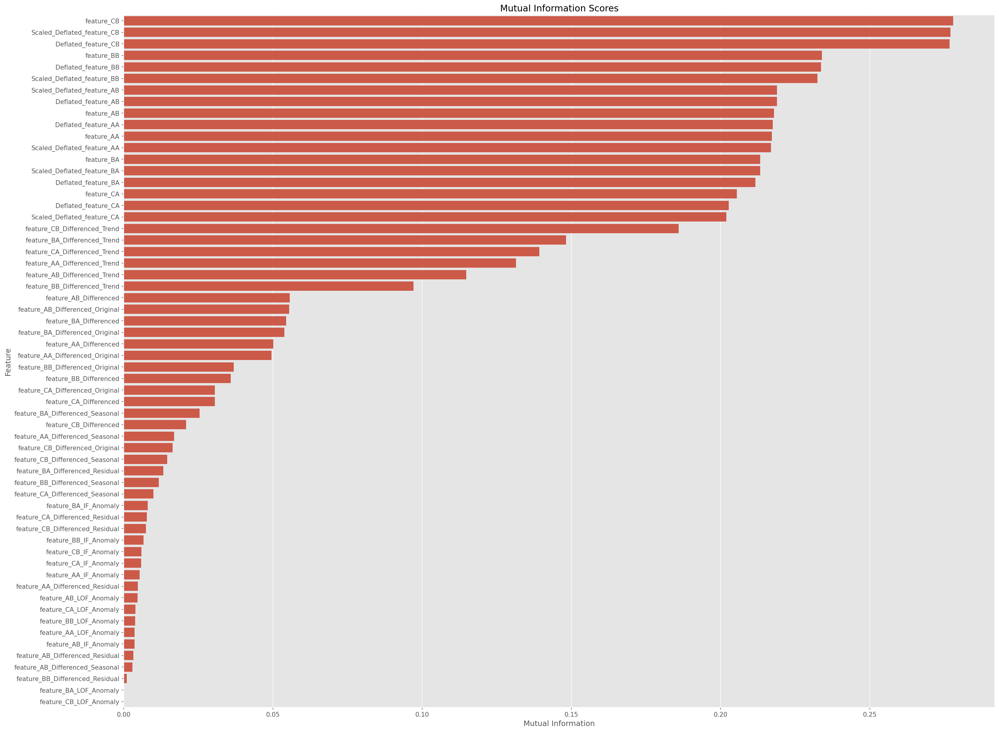

,Feature,Mutual Information
5,feature_CB,0.277921
22,Scaled_Deflated_feature_CB,0.276983
21,Deflated_feature_CB,0.276746
3,feature_BB,0.233906
15,Deflated_feature_BB,0.233668


In [31]:
from sklearn.feature_selection import mutual_info_regression

def prepare_for_mi(df, features):
    df_prepared = df[features].copy()

    for col in df_prepared.columns:
        if df_prepared[col].dtype == 'object' or df_prepared[col].dtype.name == 'category':
            df_prepared[col] = pd.Categorical(df_prepared[col]).codes
        elif df_prepared[col].dtype == 'bool':
            df_prepared[col] = df_prepared[col].astype(int)

    return df_prepared

def mutual_information_scores(data, features, target):
    # Prepare data
    data_prepared = prepare_for_mi(data, features)

    mi_scores = mutual_info_regression(data_prepared, data[target])
    mi_df = pd.DataFrame({'Feature': features, 'Mutual Information': mi_scores})
    mi_df = mi_df.sort_values('Mutual Information', ascending=False)

    plt.figure(figsize=(25, 20))
    sns.barplot(x='Mutual Information', y='Feature', data=mi_df)
    plt.title('Mutual Information Scores')
    plt.show()

    return mi_df


features = [col for col in train_df.columns if 'feature' in col]

train_df_copy = train_df.copy()

train_df_copy = train_df_copy.replace([np.inf, -np.inf], np.nan)
train_df_copy = train_df_copy.ffill().bfill()

# mutual information scores
mi_df = mutual_information_scores(train_df_copy, features, 'Temperature')

mi_df.head()

> Se eliminan las 10 *Features* menos importantes respecto la temperatura.

In [41]:
least_important_features = mi_df.tail(20)['Feature'].tolist()

train_df_reduced = train_df.drop(columns=least_important_features, errors='ignore').copy()
test_df_reduced = test_df.drop(columns=least_important_features, errors='ignore').copy()

### **Método y Modelo**

En la tarea, no solo se requiere de predecir puntualmente la temperatura, sino también cuantificar la incertidumbre; ser capaz de predecir la probabilidad de que la predicción de temperatura sea así.

El método que se usa para cuantificar la incertidumbre es **Conformal Prediction**: es un marco estadístico que permite generar **intervalos o regiones de predicción** que contienen la verdadera etiqueta (target) con una probabilidad predefinida, por ejemplo, 90%.

> **Modo de uso**:

1. **Entrenamiento del modelo base**  
   Se entrena cualquier modelo de regresión o clasificación (ej. Random Forest, Ridge, XGBoost, etc.).

2. **Calibración con conjunto de validación**  
   Se usa un conjunto de validación (calibration set) para calcular no conformities (por ejemplo, residuos en regresión).

3. **Construcción del intervalo**  
   Para cada nueva predicción, se ajusta el intervalo utilizando la distribución de no conformities obtenida en calibración.

En conformal prediction, la **calibración** es una parte clave del proceso. Nos permite construir **intervalos de predicción** que contienen el valor real con una probabilidad específica (por ejemplo, 90%), sin asumir ninguna distribución específica para los errores.

La calibración se encarga de **medir cuánto suele equivocarse el modelo**, y usa esa información para construir intervalos de predicción con cobertura estadística garantizada.


In [61]:
quantiles = [0.025,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,0.975]

quantile_mapping = {
    95: ['0.025', '0.975'],
    90: ['0.05', '0.95'],
    80: ['0.10', '0.90'],
    70: ['0.15', '0.85'],
    60: ['0.20', '0.80'],
    50: ['0.25', '0.75'],
    40: ['0.30', '0.70'],
    30: ['0.35', '0.65'],
    20: ['0.40', '0.60'],
    10: ['0.45', '0.55']
}

quantile_str = str(quantiles).replace('[','').replace(']','')


X = train_df_reduced.drop('Temperature', axis=1)
y = train_df_reduced['Temperature']


X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=5360)

X_proper_train, X_cal, y_proper_train, y_cal = train_test_split(X_train, y_train, test_size=0.12, random_state=1)

train_pool = Pool(data=X_proper_train, label=y_proper_train)
val_pool = Pool(data=X_val, label=y_val)
cal_pool = Pool(data=X_cal, label=y_cal)
test_pool = Pool(data=test_df_reduced)

In [43]:
# model definition
multiquantiles_model = CatBoostRegressor(
                                          loss_function = f'MultiQuantile:alpha={quantile_str}',
                                          thread_count = -1,
                                          bootstrap_type =  "Bernoulli",
                                          sampling_frequency= 'PerTree',
                                          iterations = 3000,
                                       **{
                                            'learning_rate': 0.015,
                                            'max_depth': 10,
                                            'subsample': 0.75,
                                            'colsample_bylevel': 0.9,
                                            'min_data_in_leaf': 45
                                          },
                                           verbose=100
                                        )


# model fitting on training set
multiquantiles_model.fit(train_pool, eval_set=(val_pool))

0:	learn: 2.3275395	test: 2.3062686	best: 2.3062686 (0)	total: 5.66s	remaining: 4h 43m 4s
100:	learn: 0.9299882	test: 0.9300038	best: 0.9300038 (100)	total: 7m 3s	remaining: 3h 22m 46s
200:	learn: 0.6864861	test: 0.6940062	best: 0.6940062 (200)	total: 13m 43s	remaining: 3h 11m 4s
300:	learn: 0.6244777	test: 0.6381532	best: 0.6381532 (300)	total: 20m 18s	remaining: 3h 2m 10s
400:	learn: 0.5974034	test: 0.6152451	best: 0.6152451 (400)	total: 26m 48s	remaining: 2h 53m 46s
500:	learn: 0.5766505	test: 0.5987006	best: 0.5987006 (500)	total: 33m 25s	remaining: 2h 46m 42s
600:	learn: 0.5581909	test: 0.5843383	best: 0.5843383 (600)	total: 40m 4s	remaining: 2h 39m 59s
700:	learn: 0.5419773	test: 0.5714722	best: 0.5714722 (700)	total: 48m 20s	remaining: 2h 38m 32s
800:	learn: 0.5249481	test: 0.5568580	best: 0.5568580 (800)	total: 56m 4s	remaining: 2h 33m 57s
900:	learn: 0.5082106	test: 0.5429938	best: 0.5429938 (900)	total: 1h 3m 11s	remaining: 2h 27m 13s
1000:	learn: 0.4933698	test: 0.5310835	be

In [62]:
predict_cal = multiquantiles_model.predict(cal_pool)
predict_val = multiquantiles_model.predict(val_pool)
predict_test = multiquantiles_model.predict(test_pool)

In [69]:
submission_df['0.50'] = predict_test[:, 10]

In [70]:
submission_val_df = submission_df[:5360].copy()

A continuación, se calcula y se muestra la distribución de los errores de calibración en los datos de calibración, para cada nivel de confianza asociado a los intervalos predichos. Cuanto más a la izquierda se ubique la distribución respecto a la línea negra vertical discontinua, mejor calibrado está el modelo (es decir, menores errores de calibración).

*Los puntos a la derecha de la línea negra representan casos donde el error de calibración es mayor al umbral aceptable, es decir, el valor real quedó fuera del intervalo predicho.*

*Una confianza del 95%, definida por los quantiles 2.5% y 97.5%, implica que para nuevos datos, el valor verdadero (por ejemplo, la temperatura) debería estar dentro de ese intervalo en el 95% de los casos.*

*La línea negra vertical discontinua representa el valor del error de calibración (non-conformity score) que se utiliza para ajustar (expandir) los intervalos predichos. Este ajuste asegura que los intervalos tengan la cobertura empírica deseada (por ejemplo, 95%).*

level : 95 interval : [0.025 , 0.975]



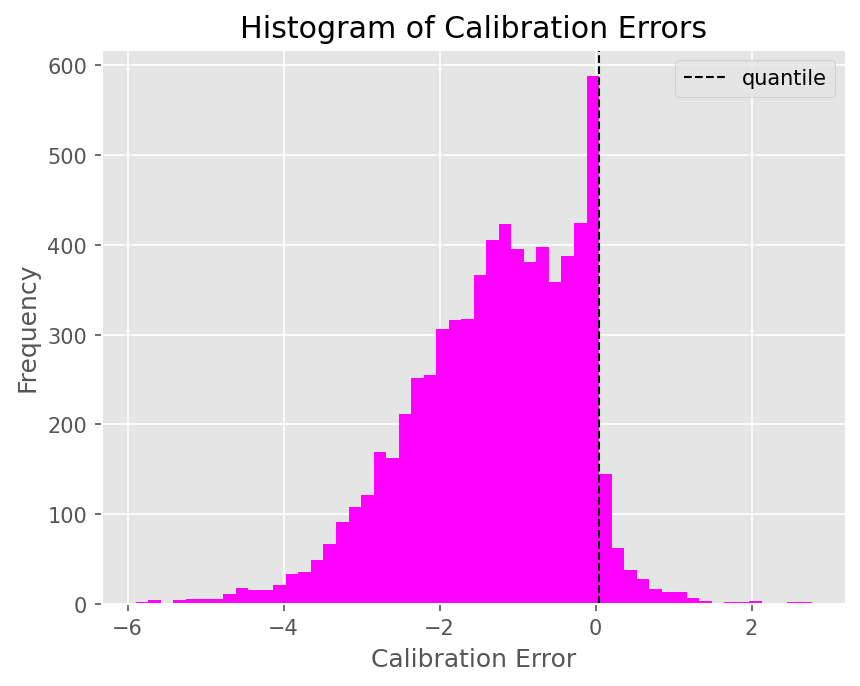

level : 90 interval : [0.05 , 0.95]



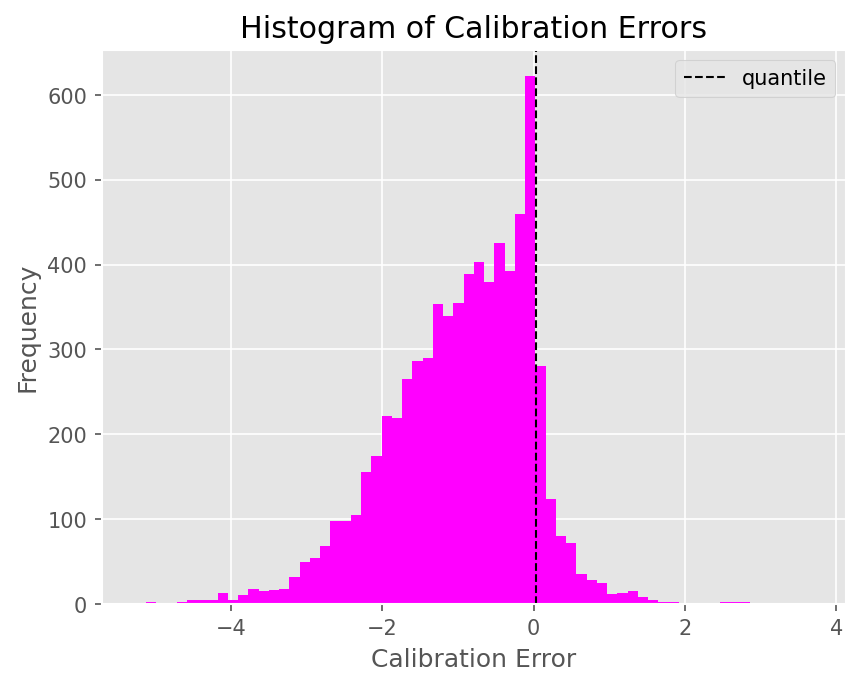

level : 80 interval : [0.10 , 0.90]



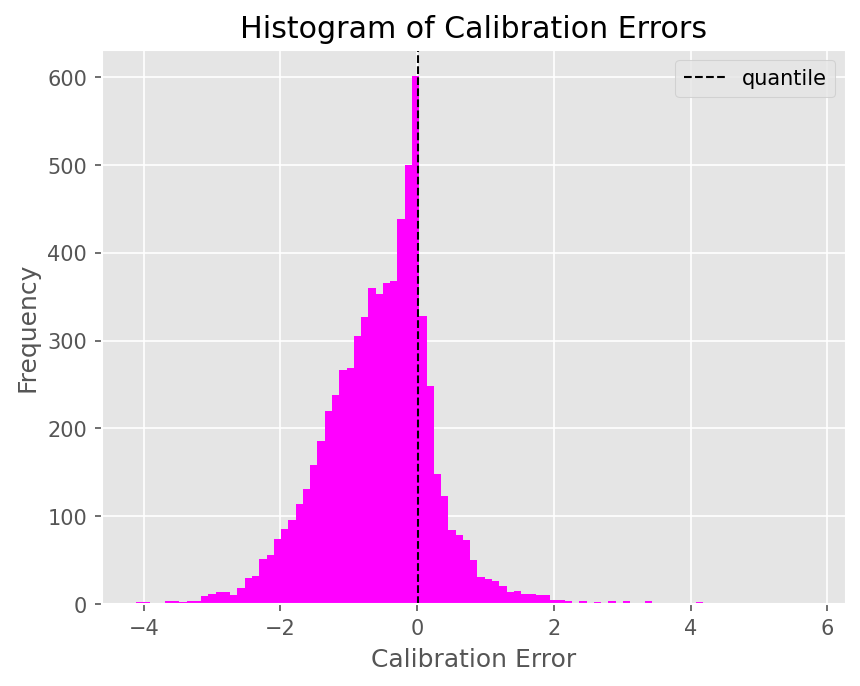

level : 70 interval : [0.15 , 0.85]



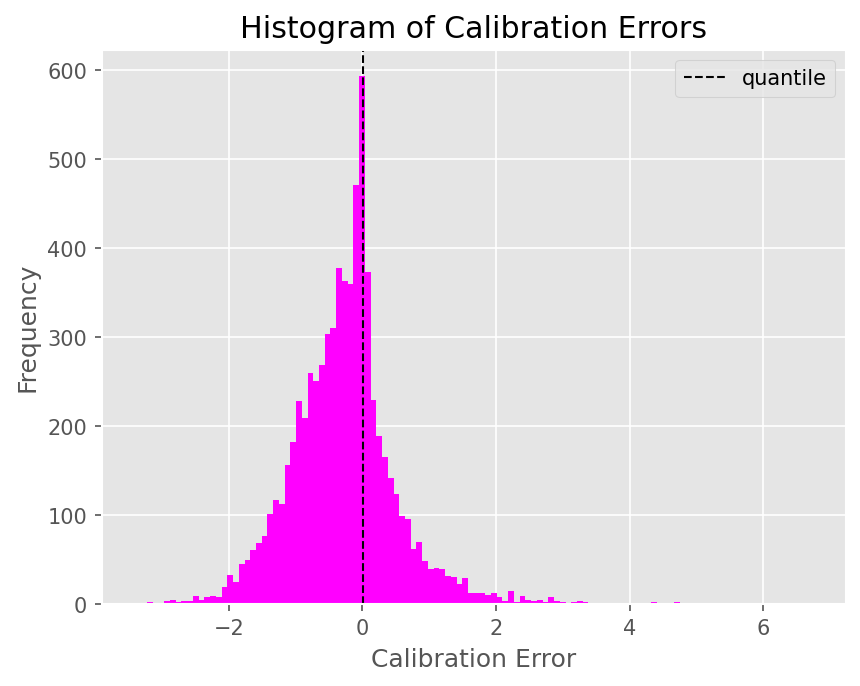

level : 60 interval : [0.20 , 0.80]



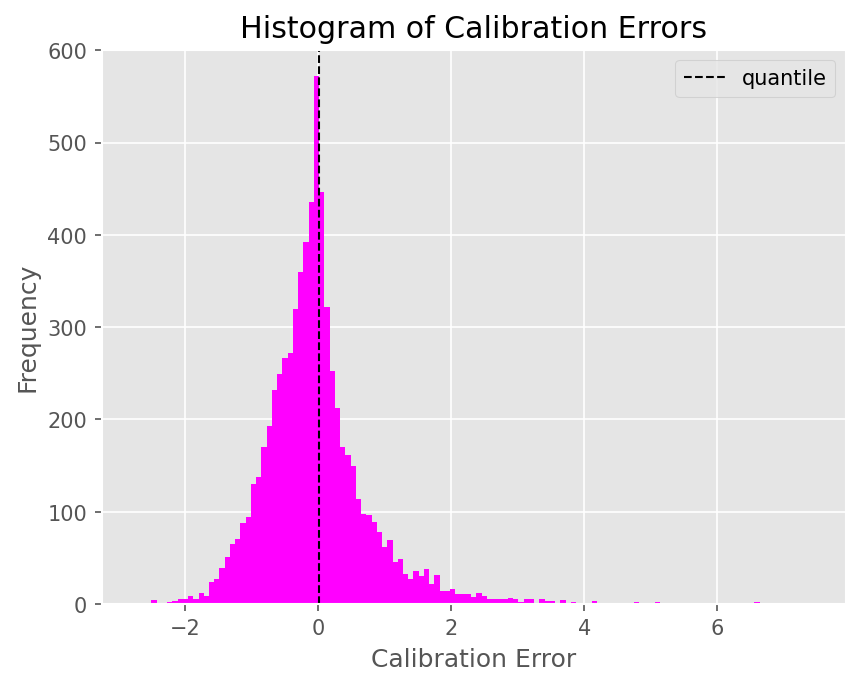

level : 50 interval : [0.25 , 0.75]



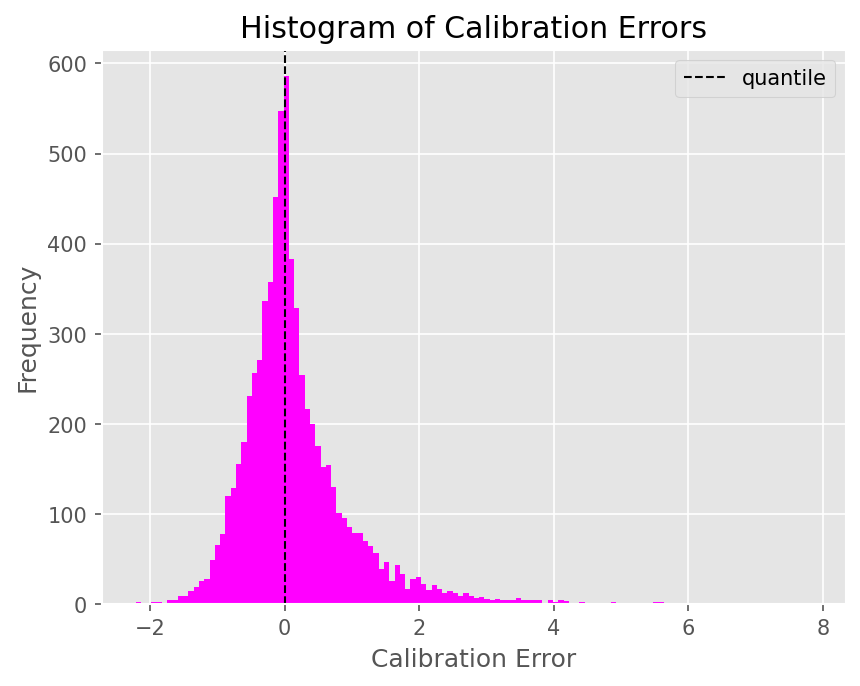

level : 40 interval : [0.30 , 0.70]



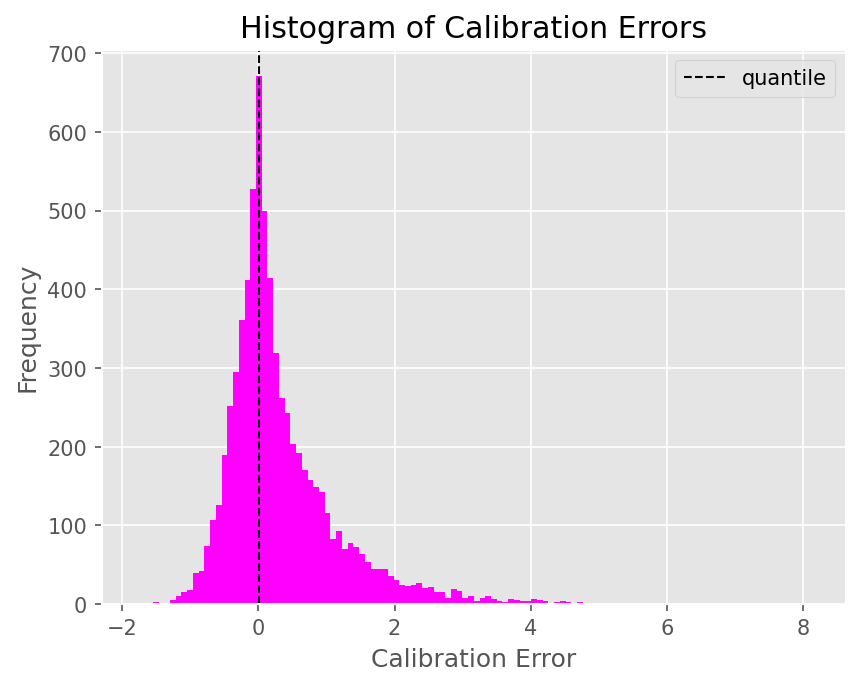

level : 30 interval : [0.35 , 0.65]



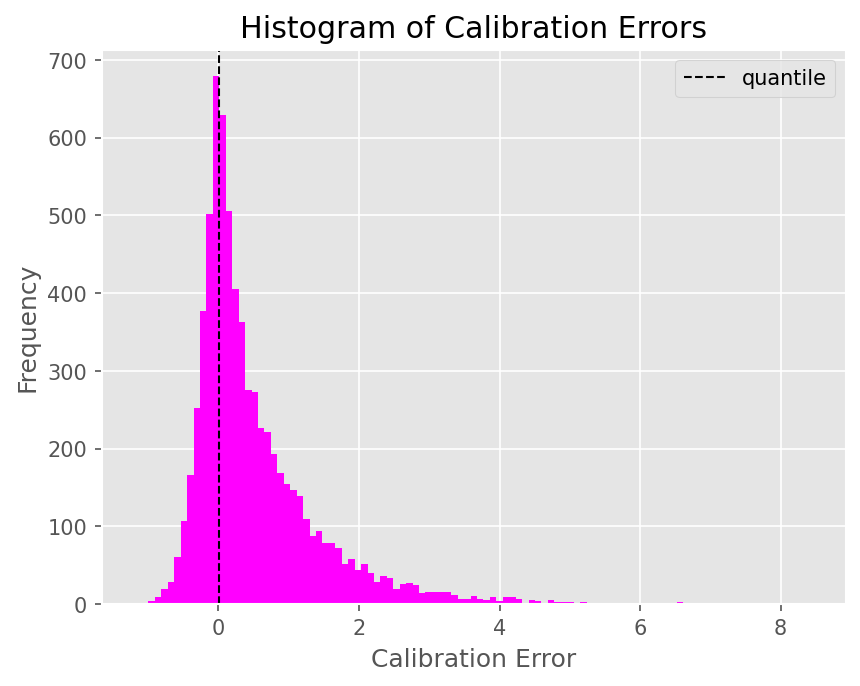

level : 20 interval : [0.40 , 0.60]



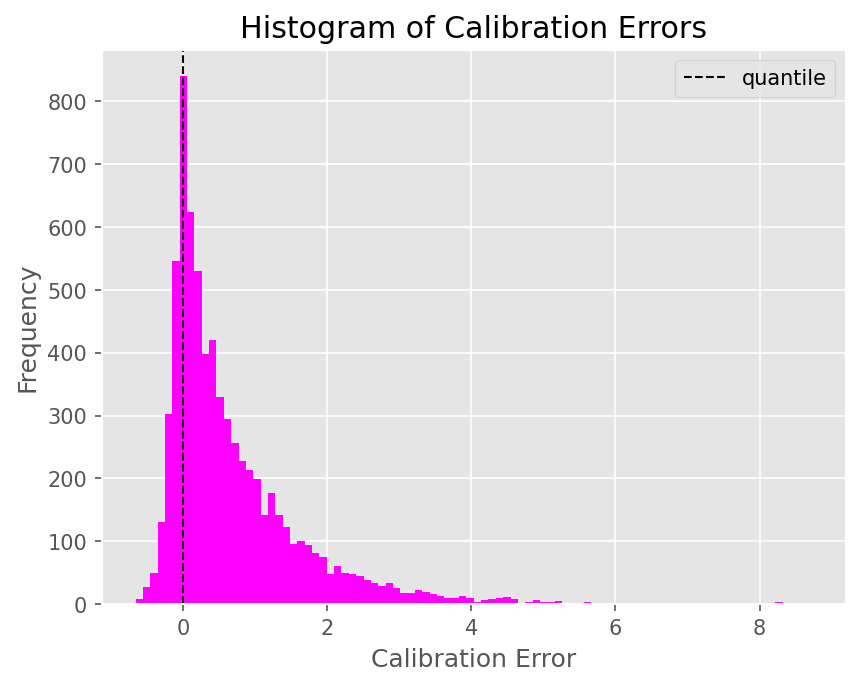

level : 10 interval : [0.45 , 0.55]



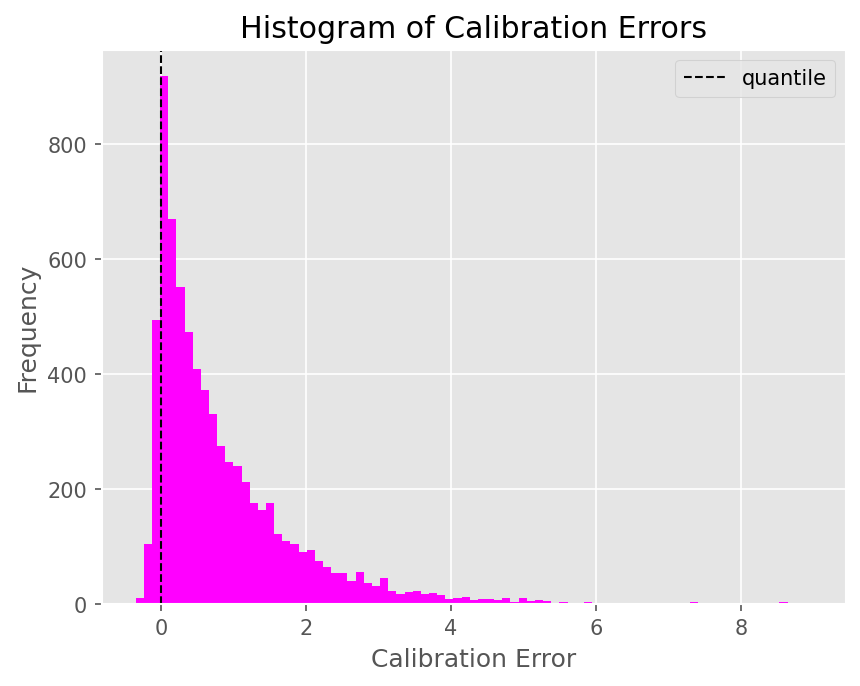

In [71]:
for index, (level, q_pair) in enumerate(quantile_mapping.items()):

    print(f'level : {level} interval : [{q_pair[0]} , {q_pair[1]}]\n')

    # Keep only predicted Quantiles related to the current level
    cal_pred_intervals = np.zeros([len(X_cal), 2])
    cal_pred_intervals[:, 0] = predict_cal[:, index]
    cal_pred_intervals[:, 1] = predict_cal[:, 20 - index]

    # Compute Non-Conformity Measures
    non_conformity_scores = np.max(
    [
        cal_pred_intervals[:, 0] - y_cal,
        y_cal - cal_pred_intervals[:, 1],
    ],
    axis=0,
    )

    # Sort Non-Conformity Measures
    non_conformity_scores = np.sort(non_conformity_scores)[::-1]

    # Compute Empirical Quantile
    emperical_quantile = (level/100) * (1 + (1 / len(y_cal)))

    correct_factor = np.quantile(
                                    non_conformity_scores,
                                    emperical_quantile,
                                    method="higher"
                                    )

    # Plot the non_conformity_scores distribution
    plt.hist(non_conformity_scores, bins='auto', color='magenta')

    # Add a vertical line for the Quantile
    plt.axvline(
                correct_factor,
                color='black',
                linestyle='dashed',
                linewidth=1,
                label='quantile'
                )

    plt.legend()
    plt.xlabel('Calibration Error')
    plt.ylabel('Frequency')
    plt.title('Histogram of Calibration Errors')

    plt.show()

    # Keep only predicted Quantiles related to the current level
    test_pred_intervals = np.zeros([len(test_df), 2])
    test_pred_intervals[:, 0] = predict_test[:, index]
    test_pred_intervals[:, 1] = predict_test[:, 20 - index]

    submission_df[q_pair[0]] = test_pred_intervals[:, 0] - correct_factor
    submission_df[q_pair[1]] = test_pred_intervals[:, 1] + correct_factor

    # Keep only predicted Quantiles related to the current level
    val_pred_intervals = np.zeros([len(X_val), 2])
    val_pred_intervals[:, 0] = predict_val[:, index]
    val_pred_intervals[:, 1] = predict_val[:, 20 - index]

    submission_val_df[q_pair[0]] = val_pred_intervals[:, 0] - correct_factor
    submission_val_df[q_pair[1]] = val_pred_intervals[:, 1] + correct_factor

Se generan las visualizaciones de los intervalos de predicción para cada nivel de confianza definido en `quantile_mapping`.

En cada gráfico:

- La línea azul representa la **mediana predicha** (`quantile 0.50`).
- La zona sombreada en gris muestra el **intervalo de predicción** correspondiente al nivel de confianza actual (por ejemplo, entre los quantiles 2.5% y 97.5% para un intervalo del 95%).
- Cada gráfico permite observar la **incertidumbre de las predicciones** y cómo varía con diferentes niveles de confianza.

Estas visualizaciones ayudan a evaluar si los intervalos son razonables y a identificar posibles patrones de sobreconfianza o subestimación de la incertidumbre del modelo.

level : 95 interval : [0.025 , 0.975 ]



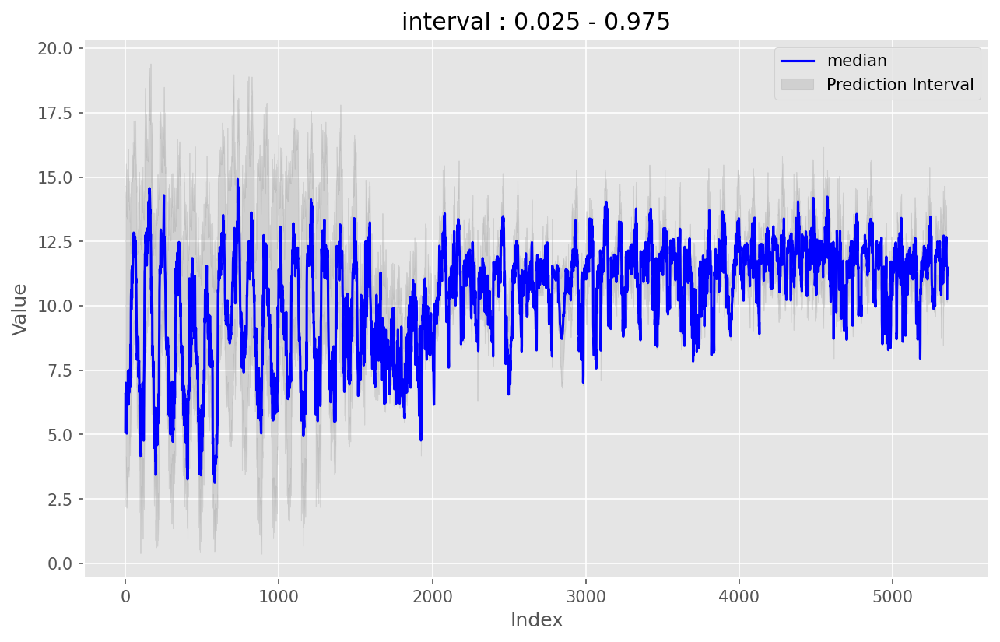

level : 90 interval : [0.05 , 0.95 ]



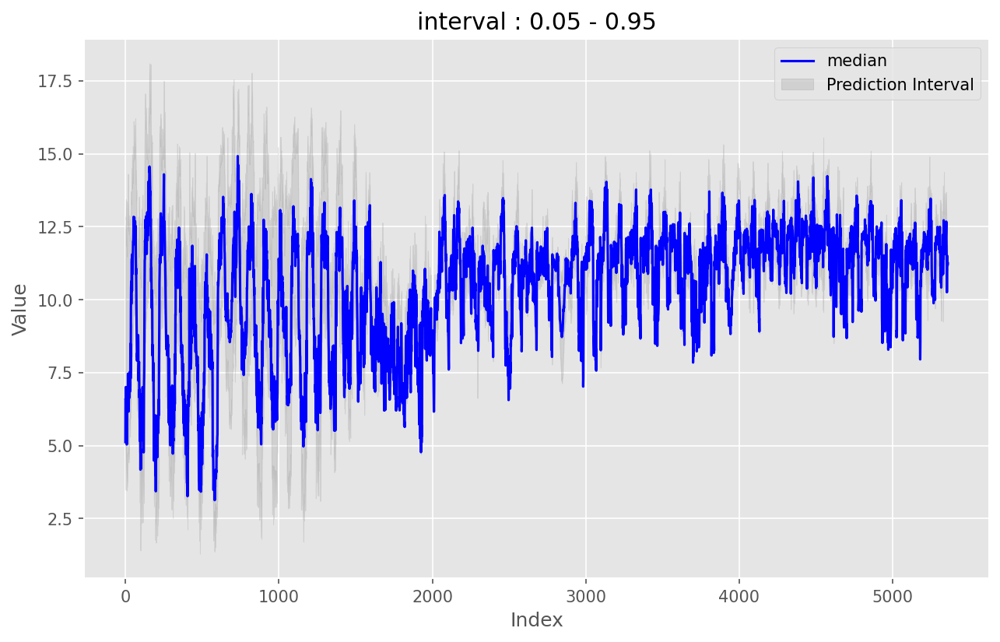

level : 80 interval : [0.10 , 0.90 ]



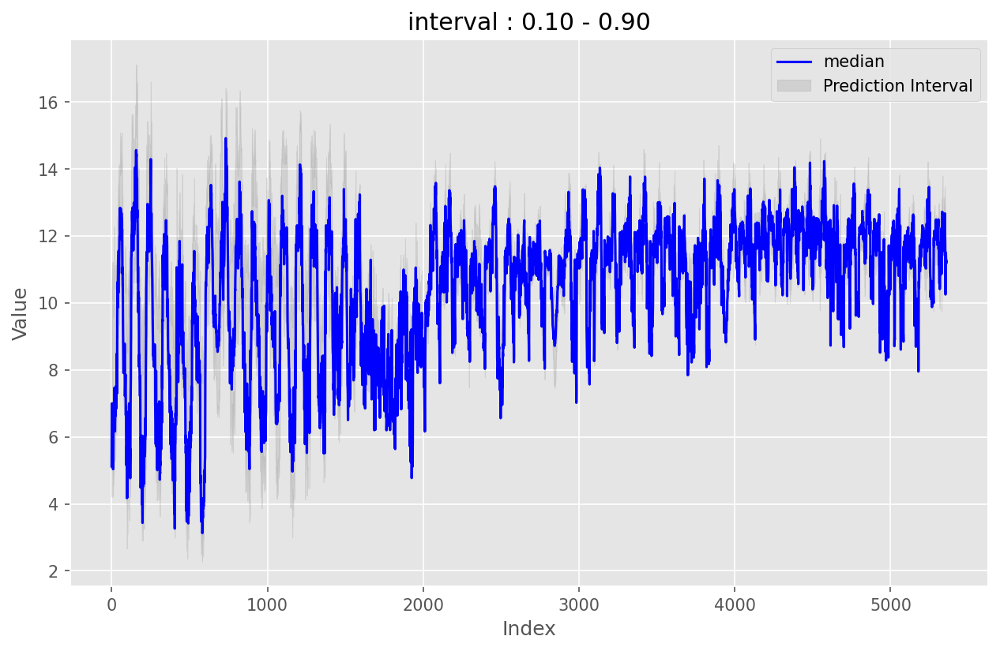

level : 70 interval : [0.15 , 0.85 ]



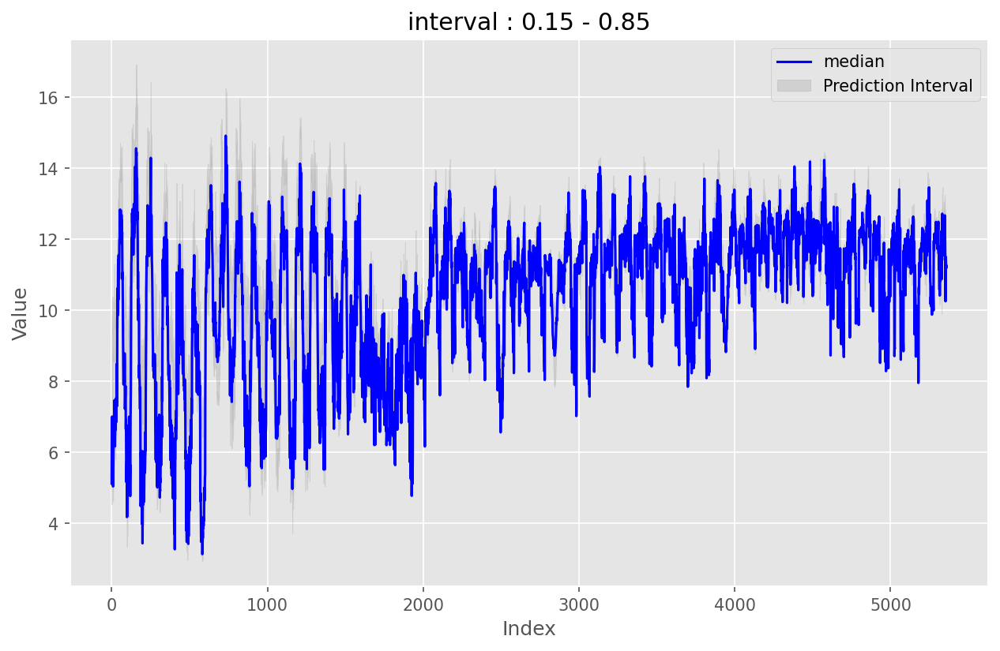

level : 60 interval : [0.20 , 0.80 ]



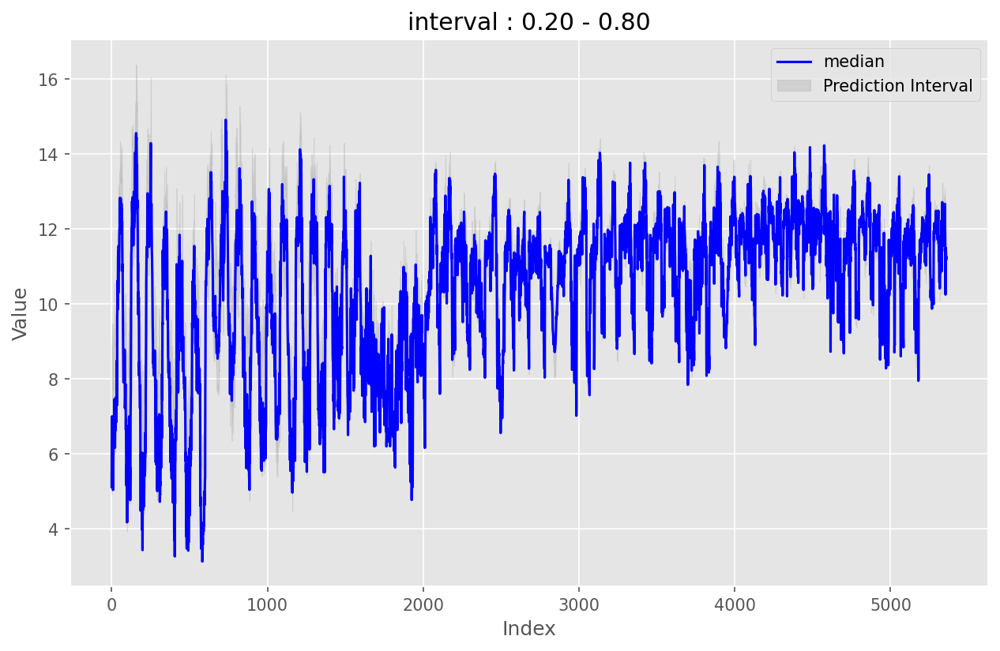

level : 50 interval : [0.25 , 0.75 ]



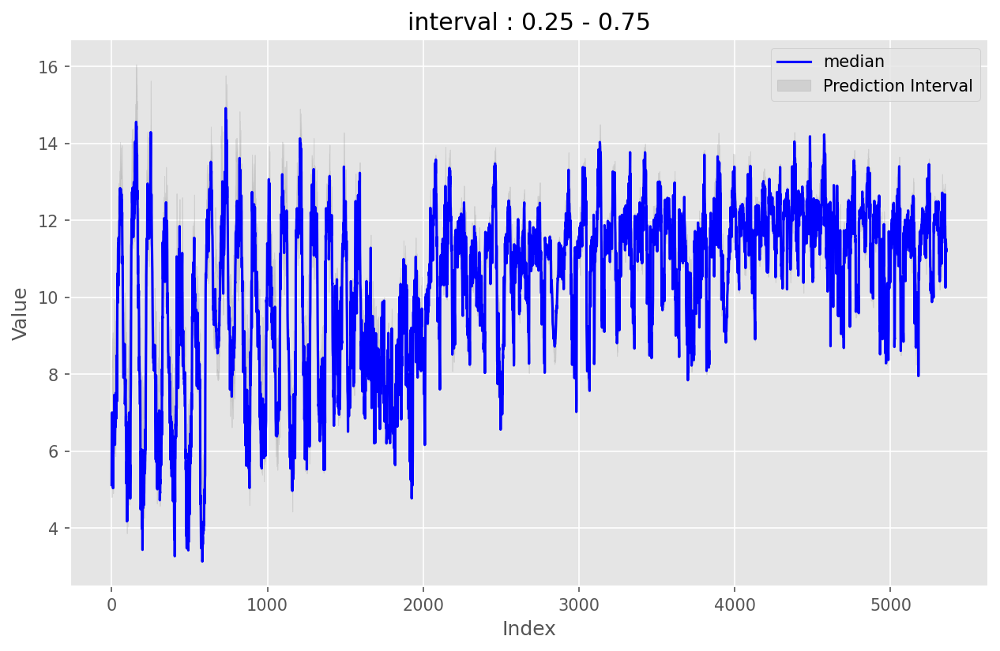

level : 40 interval : [0.30 , 0.70 ]



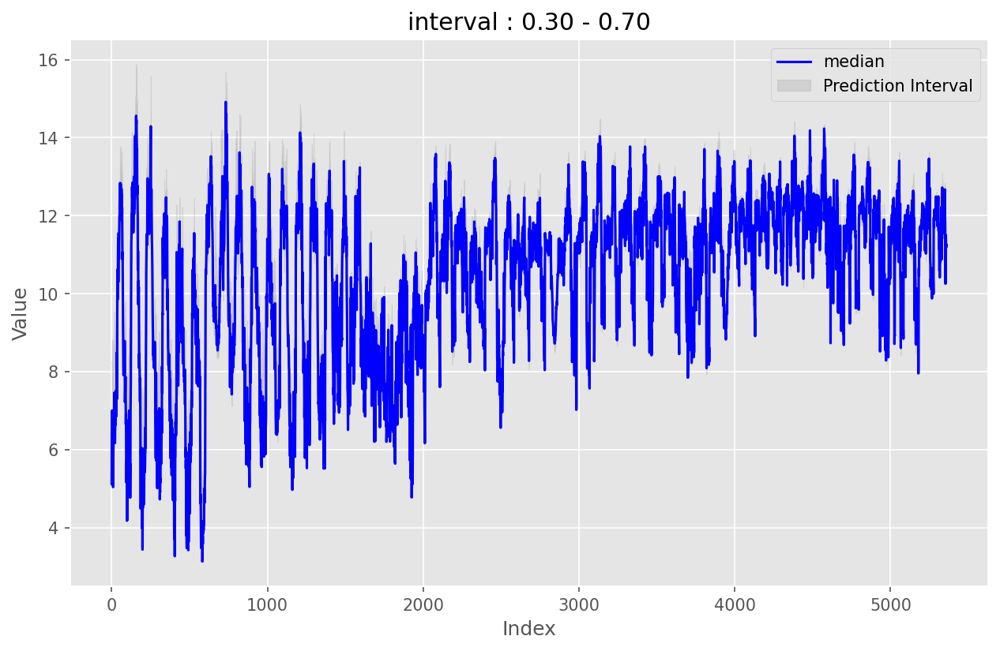

level : 30 interval : [0.35 , 0.65 ]



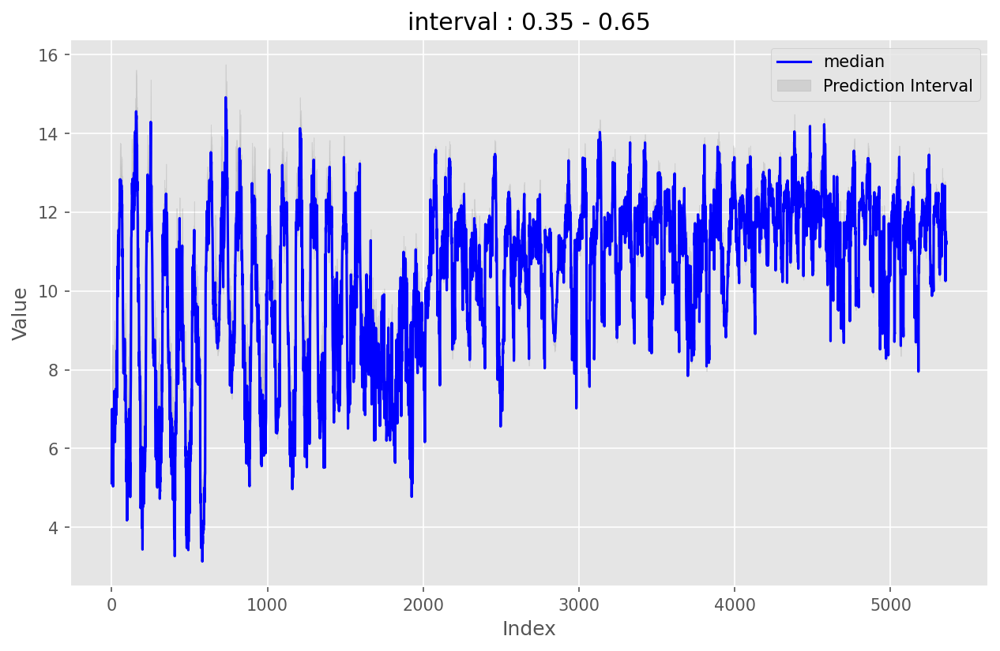

level : 20 interval : [0.40 , 0.60 ]



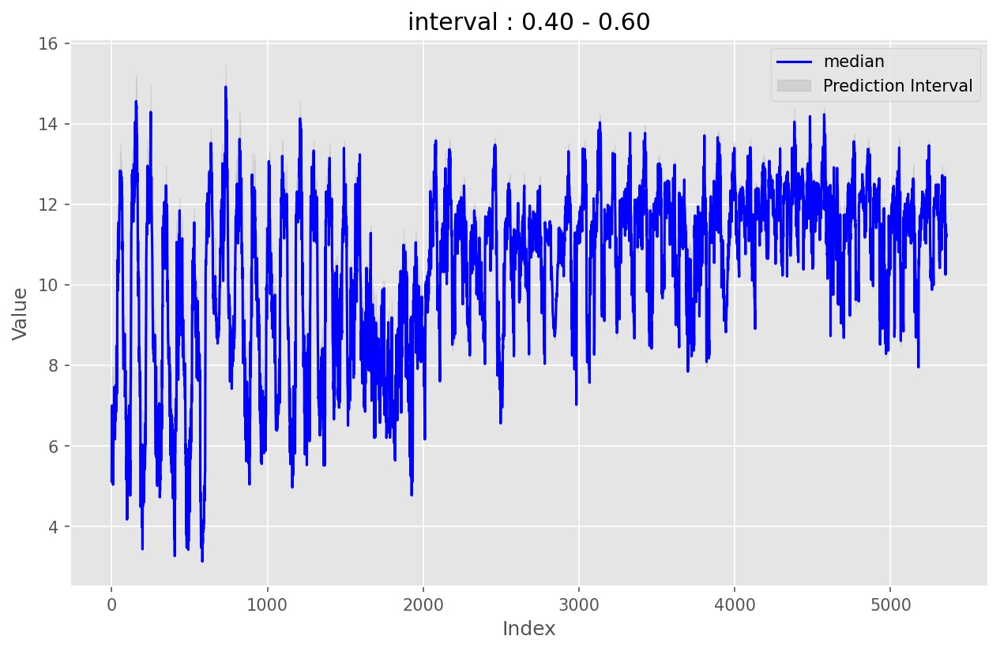

level : 10 interval : [0.45 , 0.55 ]



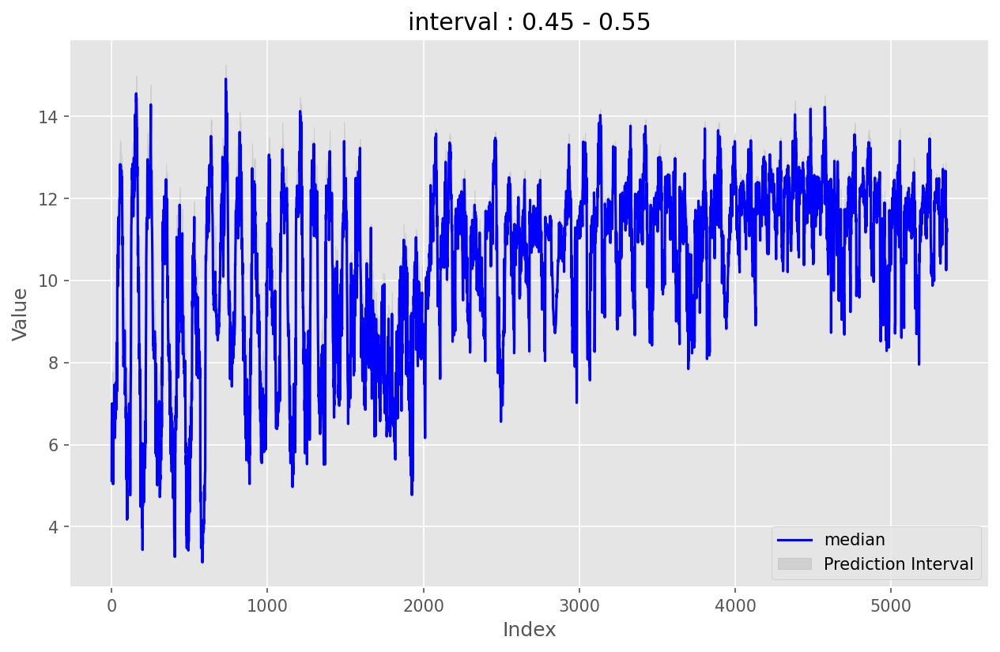

In [72]:
for (level, q_pair) in quantile_mapping.items():

    print(f'level : {level} interval : [{q_pair[0]} , {q_pair[1]} ]\n')

    title = 'interval : ' + q_pair[0] + ' - ' + q_pair[1]

    # Create a new figure
    plt.figure(figsize=(10, 6))

    # Plot actual values
    plt.plot(submission_df['0.50'], label='median', color='blue')


    # Plot prediction intervals
    plt.fill_between(submission_df.index, submission_df[q_pair[0]], submission_df[q_pair[1]],
                     color='gray', alpha=0.2, label='Prediction Interval')

    # Add the legend
    plt.legend()

    # Set labels and title
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(title)

    # Show the plot
    plt.show()

In [68]:
crps_score = crps(submission_val_df, pd.DataFrame({'Temperature': y_val}))
print("CRPS on validation set:", crps_score)

CRPS on validation set: 0.8018599105517651
